# 1. Importing Libraries and Data Set

In [1]:
# Importing the necessary libraries.
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from math import ceil
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder
import pyarrow as pa
import pyarrow.parquet as p
from datetime import datetime
from sas7bdat import SAS7BDAT
from sklearn.decomposition import PCA
from sklearn.impute import KNNImputer
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth
from sklearn.manifold import TSNE
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score
import matplotlib.cm as cm
from scipy.cluster.hierarchy import dendrogram
import umap

2023-01-06 22:34:23.296256: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Importing the dataset.
with SAS7BDAT("a2z_insurance.sas7bdat", skip_header=False) as reader:
    df=reader.to_data_frame()

# 2. Data Exploration, Preparation, and Pre-Processing

## 2.1. Basic Data Exploration and Preparation

In [3]:
# Having a first look at the DataFrame.
df.head()

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,2 - High School,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,1 - Basic,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,3 - BSc/MSc,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [4]:
# Creating a copy of the original DataFrame, so that we don't lose it.
df1=df.copy()

In [5]:
# Setting the column "CustID" as the index.
df1.set_index("CustID",inplace=True)

In [6]:
# Checking the number of rows and columns.
# We have 10296 observations and 13 variables, at first.
df1.shape

(10296, 13)

In [7]:
# Checking other useful information from our DataFrame.
df1.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10296 entries, 1.0 to 10296.0
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10296 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


In [8]:
# Checking some descriptive statistics using the .describe() method.
# From here we can already check the existence of some outliers, and other values
# that look a bit non-sense at first. We will analyse them better during
# the report.
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,10266.0,1991.062634,511.267913,1974.00,1980.00,1986.00,1992.0000,53784.00
BirthYear,10279.0,1968.007783,19.709476,1028.00,1953.00,1968.00,1983.0000,2001.00
MonthSal,10260.0,2506.667057,1157.449634,333.00,1706.00,2501.50,3290.2500,55215.00
GeoLivArea,10295.0,2.709859,1.266291,1.00,1.00,3.00,4.0000,4.00
Children,10275.0,0.706764,0.455268,0.00,0.00,1.00,1.0000,1.00
CustMonVal,10296.0,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,0.742772,2.916964,0.00,0.39,0.72,0.9800,256.20
PremMotor,10262.0,300.470252,211.914997,-4.11,190.59,298.61,408.3000,11604.42
PremHousehold,10296.0,210.431192,352.595984,-75.00,49.45,132.80,290.0500,25048.80
PremHealth,10253.0,171.580833,296.405976,-2.11,111.80,162.81,219.8200,28272.00


In [9]:
# Checking for how many missing values we have in each column.
df1.isna().sum()

FirstPolYear      30
BirthYear         17
EducDeg            0
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

In [10]:
# Checking if we have any duplicated row.
sum(df1.duplicated())

3

In [11]:
# In fact we have 3 pairs of repeated rows.
df1[df1.duplicated(keep=False)]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
2076.0,1977.0,1974.0,2 - High School,2204.0,4.0,1.0,-22.11,1.00,214.93,88.90,266.94,39.23,42.12
2100.0,1987.0,1987.0,2 - High School,1912.0,4.0,1.0,290.61,0.58,202.37,177.25,306.39,63.90,-0.11
3507.0,1986.0,1952.0,2 - High School,3900.0,4.0,0.0,-119.35,1.10,163.03,481.75,224.82,94.35,18.56
8014.0,1987.0,1987.0,2 - High School,1912.0,4.0,1.0,290.61,0.58,202.37,177.25,306.39,63.90,-0.11
8122.0,1977.0,1974.0,2 - High School,2204.0,4.0,1.0,-22.11,1.00,214.93,88.90,266.94,39.23,42.12
9554.0,1986.0,1952.0,2 - High School,3900.0,4.0,0.0,-119.35,1.10,163.03,481.75,224.82,94.35,18.56


In [12]:
# Dropping each one of the three repeated observations.
df1.drop([2076.0,2100.0,3507.0],axis=0,inplace=True)

In [13]:
# Only the column "EducDeg" has empty values.
for x in list(df1.columns):
    print(df1[df1[x]==""].shape[0])

0
0
17
0
0
0
0
0
0
0
0
0
0


In [14]:
# Let's have a look which rows have an empty value in the column "EducDeg":
df1[df1["EducDeg"]==""]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
897.0,NaN,1960.0,,2643.0,1.0,1.0,-25.00,1.00,515.54,33.90,47.01,12.89,3.78
1708.0,1992.0,1946.0,,3827.0,4.0,0.0,355.52,0.33,222.71,146.70,NaN,94.13,105.24
2450.0,NaN,1939.0,,4465.0,4.0,0.0,457.75,0.36,338.73,187.25,175.81,43.23,4.78
2729.0,NaN,1954.0,,3200.0,2.0,0.0,109.25,0.77,211.93,14.45,275.72,77.68,11.67
2771.0,NaN,1984.0,,1473.0,4.0,1.0,443.74,0.31,386.74,104.45,156.92,5.00,27.45
3057.0,NaN,1977.0,,2221.0,1.0,1.0,-9.22,0.97,475.09,15.00,93.35,15.78,2.78
4424.0,NaN,1962.0,,2688.0,1.0,1.0,481.99,0.09,533.99,-30.00,52.01,3.00,NaN
6536.0,NaN,1968.0,,2413.0,3.0,1.0,420.86,0.28,472.31,48.35,56.90,26.45,16.67
6561.0,1976.0,1992.0,,NaN,4.0,1.0,85.91,0.77,91.24,0.00,227.60,60.01,110.91


In [15]:
# Checking all the existing values in column "EducDeg".
df1["EducDeg"].value_counts()

3 - BSc/MSc        4799
2 - High School    3507
1 - Basic          1272
4 - PhD             698
                     17
Name: EducDeg, dtype: int64

In [16]:
# Setting the empty values on "EducDeg" to null values as it will
# be more useful during the analyses, as it will allow us to still
# do the correlation matrix, for example.
df1.loc[df1["EducDeg"]=="","EducDeg"]=np.nan

In [17]:
# We can consider education an ordinal variable, and so we are going
# to transform it, so that then we can use it for our analyses and posterior
# clustering. "1 - Basic" will be the 1, "2 - High School" will be the 2, "3 - BSc/MSc" will be the 3,
# and finally "4 - PhD" will be the 4.
df1.loc[(df1["EducDeg"]=="1 - Basic"),"EducDeg"]=1
df1.loc[(df1["EducDeg"]=="2 - High School"),"EducDeg"]=2
df1.loc[(df1["EducDeg"]=="3 - BSc/MSc"),"EducDeg"]=3
df1.loc[(df1["EducDeg"]=="4 - PhD"),"EducDeg"]=4

In [18]:
# Checking if the change went alright.
df1["EducDeg"].value_counts()

3    4799
2    3507
1    1272
4     698
Name: EducDeg, dtype: int64

In [19]:
# Defining and having a look to the rows which have columns that contain null values,
# not that we fixed the empty values.
nans_index=df1.isna().any(axis=1)
df1[nans_index].head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
22.0,1977.0,1958.0,2,NaN,3.0,1.0,111.37,0.80,407.52,111.70,100.13,24.67,30.34
69.0,1983.0,1977.0,2,1399.0,4.0,1.0,476.65,0.33,330.73,186.70,211.15,NaN,15.78
139.0,1979.0,1976.0,2,2538.0,2.0,1.0,149.59,0.69,194.26,305.60,NaN,37.34,17.67
144.0,1996.0,1990.0,3,NaN,4.0,1.0,-42.45,1.02,146.36,353.95,220.04,121.80,42.01
185.0,1993.0,1984.0,2,2419.0,4.0,1.0,-62.23,1.07,NaN,253.95,230.60,5.89,43.12


## 2.2. Consistency Check

In [20]:
# Checking how many columns have a policy year lower than the birth year.
sum(df1["FirstPolYear"]<(df1["BirthYear"]))

1997

In [21]:
# We have 1997 observations where the "FirstPolYear" is lower than the "BirthYear",
# which is not possible. Clearly one of the variables in incorrect, further on the notebook
# we will analyse this situation to understand better which one of the variables is incorrect.
strange_rows=df1[df1["FirstPolYear"]<df1["BirthYear"]]

In [22]:
# Having a look at the rows where "FirstPolYear" is lower than the "BirthYear", to try to find
# any pattern of why this is happening. It is inconclusive. We will deal with it later. 
df1.loc[strange_rows.index,:].head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
2.0,1981.0,1995.0,2,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
14.0,1983.0,2000.0,1,1043.0,3.0,1.0,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
19.0,1981.0,1982.0,1,1414.0,3.0,1.0,230.38,0.71,313.17,373.40,121.80,14.78,72.57
23.0,1976.0,1986.0,2,1495.0,1.0,1.0,-89.79,1.08,209.04,308.95,192.48,64.79,54.90
41.0,1994.0,1995.0,2,1177.0,4.0,1.0,121.36,0.84,52.01,455.65,135.47,146.36,148.03


In [23]:
# Checking if there is anyone with a negative age (born past 2016) or with more than 110 years of age,
# from the descriptive statistics we know that we will have at least have a person with more than
# 110 years.
print(sum(df1["BirthYear"]<(2016-110)))
print(sum(df1["BirthYear"]>2016))

1
0


In [24]:
# We have a look at the observation that corresponds to this huge age. We are going to eliminate it
# during our outlier removal.
strange_rows=df1[df1["BirthYear"]<(2016-110)]
df1.loc[strange_rows.index,:].head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
7196.0,1993.0,1028.0,3,2830.0,4.0,0.0,146.02,0.77,428.97,192.8,108.91,1.89,23.67


In [25]:
# Doing a similar analysis as the previous one, but now for the "FirstPolYear" as
# it doesn't make sense to have values higher than 2016, and lower than 1906.
print(sum(df1["FirstPolYear"]<(2016-110)))
print(sum(df1["FirstPolYear"]>2016))

0
1


In [26]:
# We have a look at the observation that corresponds to "FistPolYear" bigger than 2016.
# We are going to eliminate it during our outlier removal. Clearly, there was an error
# in computation. Looks like the value is in a different format.
strange_rows=df1[df1["FirstPolYear"]>2016]
df1.loc[strange_rows.index,:].head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
9295.0,53784.0,1948.0,3,3268.0,1.0,0.0,348.85,0.37,351.4,15.0,187.37,22.45,17.78


In [27]:
# Checking the relationship between "EducDeg" and "BirthYear" to see if all of them
# make sense. Everything looks normal, it is normal to finish Basic Scool at 15,
# to finish High School at 18, to finish a Bachelors at 20, and a PhD at 23. Nothing
# to remove here.
print(2016-max(df1[df1["EducDeg"]==4]["BirthYear"]))
print(2016-max(df1[df1["EducDeg"]==3]["BirthYear"]))
print(2016-max(df1[df1["EducDeg"]==2]["BirthYear"]))
print(2016-max(df1[df1["EducDeg"]==1]["BirthYear"]))

23.0
20.0
18.0
15.0


In [28]:
# Next, we will check if anyone born after 2000 have a monthly salary,
# because it is a bit odd a person younger than 16 to have a monthly salary.
sum(df1["BirthYear"]>(2016-16))

12

In [29]:
# In fact we have 12 observations where this happens. As these observations won't
# be detected during our outlier removal method, we chose to eliminate them now.
df1[df1["BirthYear"]>(2016-16)]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
660.0,1991.0,2001.0,1,1284.0,4.0,1.0,243.50,0.81,46.23,1079.65,72.68,252.27,-10.00
690.0,1997.0,2001.0,1,1180.0,3.0,1.0,436.10,0.48,54.90,406.20,65.79,112.02,256.05
866.0,1979.0,2001.0,1,562.0,1.0,1.0,1113.78,0.11,40.34,847.95,94.24,178.70,112.13
1437.0,1989.0,2001.0,1,823.0,4.0,0.0,281.28,0.60,129.58,177.80,58.01,176.70,218.15
2580.0,1986.0,2001.0,1,1006.0,4.0,0.0,267.95,0.67,48.23,396.75,291.50,127.58,24.45
3147.0,1994.0,2001.0,1,372.0,4.0,1.0,488.76,0.36,60.68,270.60,177.59,182.48,107.13
4466.0,1978.0,2001.0,1,958.0,4.0,0.0,-204.59,1.11,28.56,1359.15,68.79,38.23,179.59
4484.0,1983.0,2001.0,1,1241.0,3.0,1.0,909.17,0.13,43.34,589.55,142.47,121.80,179.48
5348.0,1980.0,2001.0,1,1119.0,3.0,1.0,796.71,0.23,148.14,628.45,221.82,45.12,30.23


In [30]:
# Removing the 12 observations.
df1.drop(df1[df1["BirthYear"]>(2016-16)].index, axis=0, inplace=True)

## 2.3. Data Visualization I

In [31]:
metric_features=['FirstPolYear', 'BirthYear', 'MonthSal','CustMonVal', 'ClaimsRate', 'PremMotor', 'PremHousehold',
       'PremHealth', 'PremLife', 'PremWork']
non_metric_features=["Children","EducDeg","GeoLivArea"]

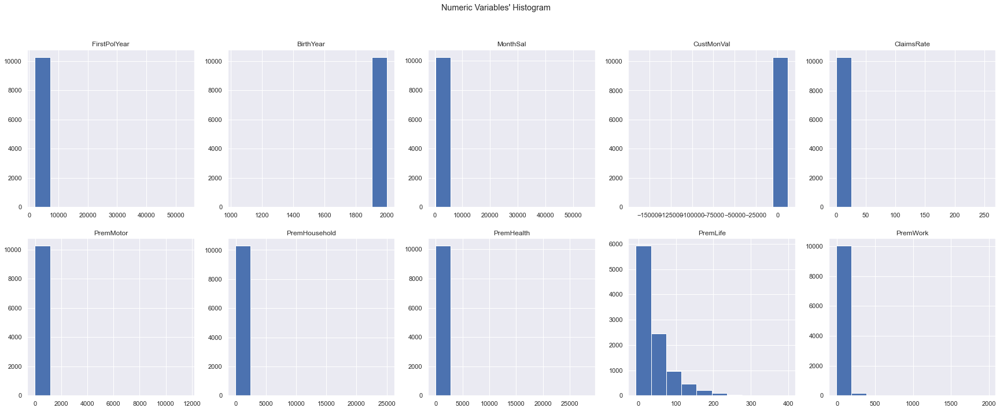

In [32]:
# Histograms for the data before outlier removal and feature engineering.
# Clearly we are facing many outliers that we will have to treat on the next stage.
sns.set()
fig,axes=plt.subplots(2,ceil(len(metric_features)/2),figsize=(30,11))
for ax,feat in zip(axes.flatten(),metric_features):
    ax.hist(df1[feat])
    ax.set_title(feat)
title="Numeric Variables' Histogram"
plt.suptitle(title)
plt.show()

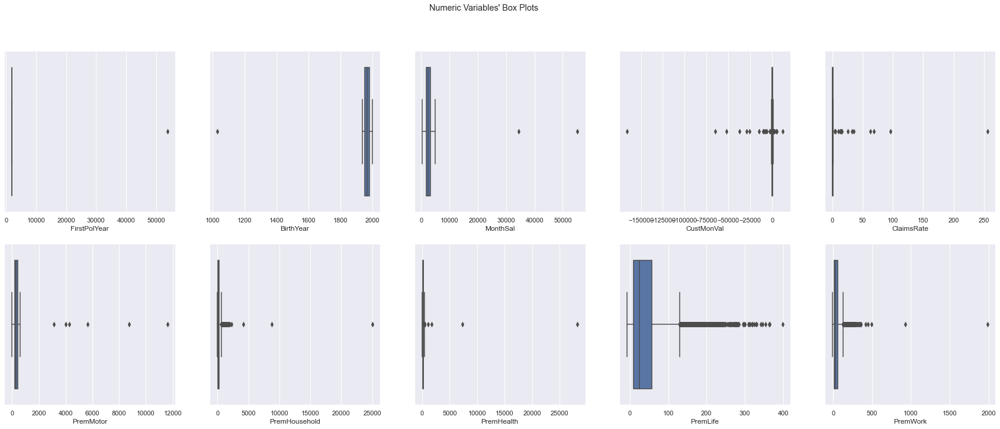

In [33]:
# Box Plots for the data before outlier removal and feature engineering.
# Clearly we are facing many outliers that we will have to treat on the next stage.
sns.set()
fig,axes=plt.subplots(2,ceil(len(metric_features)/2),figsize=(30,11))
for ax,feat in zip(axes.flatten(),metric_features):
    sns.boxplot(x=df1[feat],ax=ax)
title="Numeric Variables' Box Plots"
plt.suptitle(title)
plt.show()

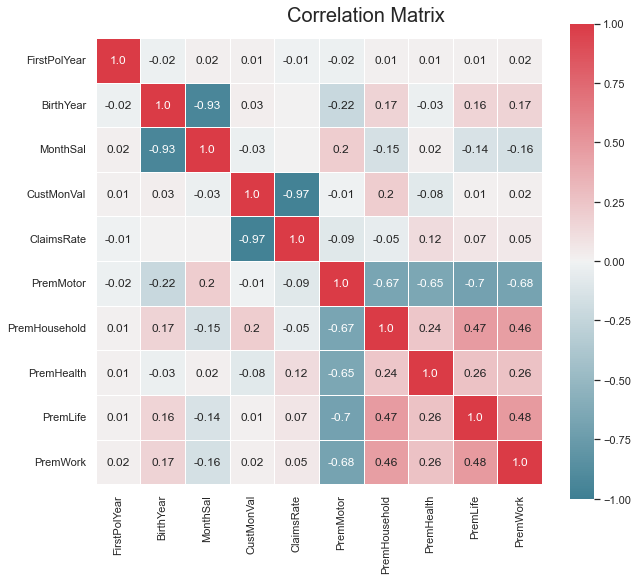

In [34]:
# At first glance once again we found something strange related to the variable
# "FirstPolYear", as it is not correlated with any variable, not even BirthYear.
# One would think that "FirstPolYear" should show some degree of correlation with
# "BirthYear" or "CustMonValue" but that is not verified. One starts to suspect that
# this was just a variable to create some confusion on the dataset and that it
# won't be useful for our analysis. We use spearman correlation as some of the relations
# between the variable may be non-linear. We see some other interesting correlations.

fig=plt.figure(figsize=(10,8))
corr=np.round(df1[metric_features].corr(method="spearman"),decimals=2)
mask_annot=np.absolute(corr.values)>=0.01
annot=np.where(mask_annot, corr.values, np.full(corr.shape,""))
sns.heatmap(data=corr,annot=annot,cmap=sns.diverging_palette(220,10,as_cmap=True), 
            fmt='s',vmin=-1,vmax=1,center=0,square=True,linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix",fontsize=20)
plt.show()

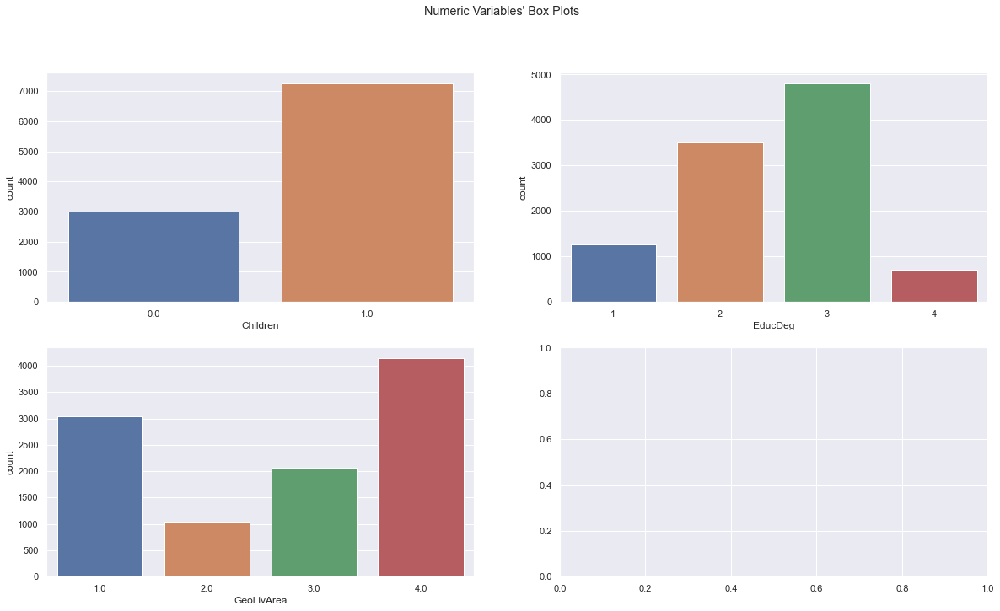

In [35]:
# Let's also build histograms for the non metric features, so that we can
# understand them better. Everything looks ok with this variables at
# first sight.
sns.set()
fig,axes=plt.subplots(2,ceil(len(non_metric_features)/2),figsize=(20, 11))
for ax,feat in zip(axes.flatten(),non_metric_features):
    sns.countplot(x=df1[feat].astype(object),ax=ax)
plt.suptitle(title)
plt.show()

## 2.4. Outlier Removal

In [36]:
# Creating a copy of our previous DataFrame as we are going to perform
# outlier removal in the metric features.
df2=df1.copy()

In [37]:
# When we start the clustering we may have to adapt the quantity of outliers
# we include according to the clustering techniques we are using
# since some of them adapt better to outliers than others. Also, we may
# test how the clustering goes when using 3, 4, 5 standard deviations
# because for now is hard to tell how many outliers should we exclude.
# Also here with this technique we eliminate all the outliers that we identified
# during the consistency checking and that we didn't eliminate at the time.

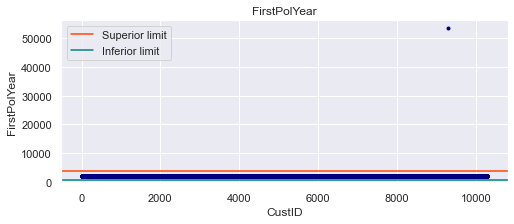

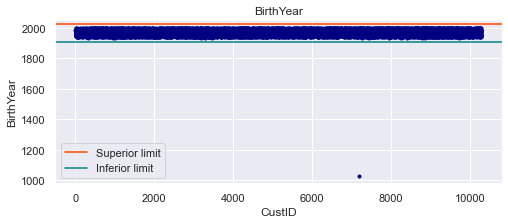

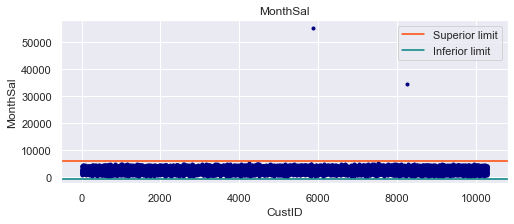

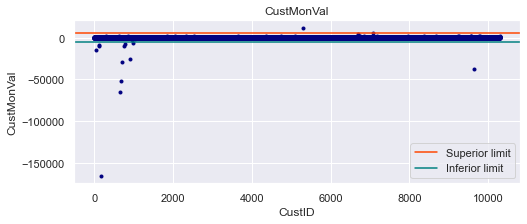

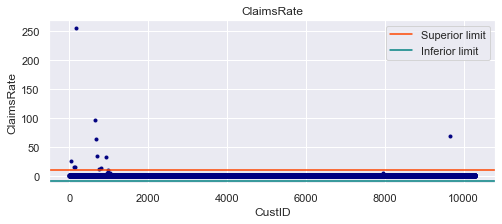

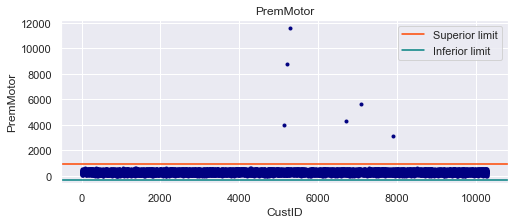

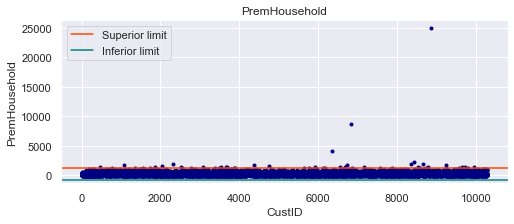

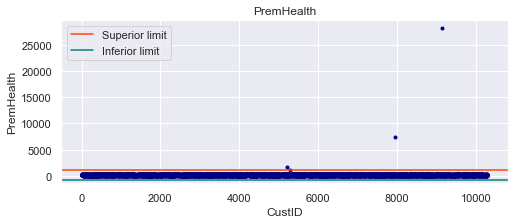

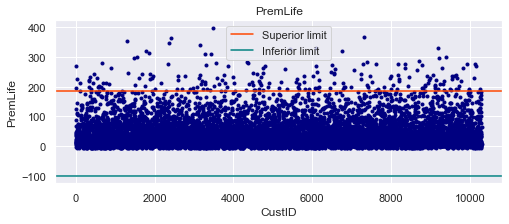

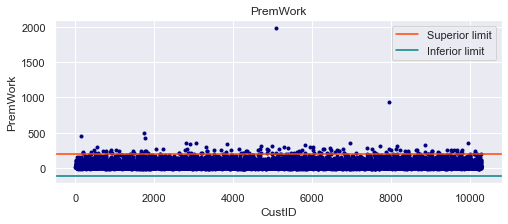

In [38]:
# Plotting every point in a chart and introducing an upper and lower limit
# corresponding to 3 standard deviations above and below the mean. This will
# help us understand better which observations are outliers. For some features we may have
# to increase/decrease this upper/lower limit as it can be dropping too many or
# too little outliers. Let's have a first look for every metric feature.
for feature in metric_features:
    
    sup_lim = df2[feature].mean() + 3*df2[feature].std()
    inf_lim = df2[feature].mean() - 3*df2[feature].std()

    plt.figure(figsize = (8, 3))
    plt.plot(df2[feature], 'o', ms = 3, color = 'navy')
    plt.autoscale(enable=True)
    plt.axhline(sup_lim,color = 'orangered',label='Superior limit')
    plt.axhline(inf_lim,color = 'teal',label='Inferior limit')
    plt.xlabel('CustID')
    plt.ylabel(feature)
    plt.legend()
    plt.title(feature)

In [39]:
# Not considering some of this observations as outliers would mean that they would have
# an own cluster for themselves, but then since they are little represented we wouldn't be
# that interested in creating a marketing strategy for them. For example, the 13 observations
# we are taking out do to "CustMonValue" having extreme values is people that used claimed the
# insurance and received large amounts of money, being financial disastrous for the insurance
# company.

for feature in metric_features:
    
    sup_lim = df2[feature].mean() + 3*df2[feature].std()
    inf_lim = df2[feature].mean() - 3*df2[feature].std()
    out=sum((df2[feature]>sup_lim) + (df2[feature]<inf_lim))
    
    print(f"Keeping this threshold for {feature}, we eliminate {out} outliers.")

Keeping this threshold for FirstPolYear, we eliminate 1 outliers.
Keeping this threshold for BirthYear, we eliminate 1 outliers.
Keeping this threshold for MonthSal, we eliminate 2 outliers.
Keeping this threshold for CustMonVal, we eliminate 13 outliers.
Keeping this threshold for ClaimsRate, we eliminate 12 outliers.
Keeping this threshold for PremMotor, we eliminate 6 outliers.
Keeping this threshold for PremHousehold, we eliminate 35 outliers.
Keeping this threshold for PremHealth, we eliminate 3 outliers.
Keeping this threshold for PremLife, we eliminate 207 outliers.
Keeping this threshold for PremWork, we eliminate 158 outliers.


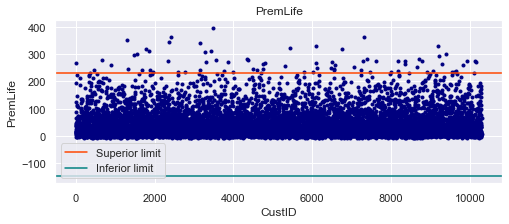

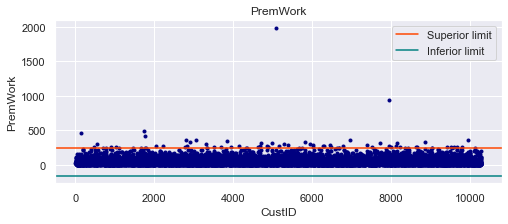

In [40]:
# For every metric feature it looks like if we use 3 standard deviations
# we are eliminating the right number of outliers. For "PremLife" and "PremWork"
# it looks like we are eliminating too many outliers. For these 2 features we are
# going to increase the threshold to 4 standard deviations and plot the result, as we
# don't want to eliminate real extreme values but only values that are harder to find
# sense on.
for feature in ["PremLife","PremWork"]:
    
    sup_lim = df2[feature].mean() + 4*df2[feature].std()
    inf_lim = df2[feature].mean() - 4*df2[feature].std()

    plt.figure(figsize = (8, 3))
    plt.plot(df2[feature], 'o', ms = 3, color = 'navy')
    plt.autoscale(enable=True)
    plt.axhline(sup_lim,color = 'orangered',label='Superior limit')
    plt.axhline(inf_lim,color = 'teal',label='Inferior limit')
    plt.xlabel('CustID')
    plt.ylabel(feature)
    plt.legend()
    plt.title(feature)

In [41]:
# Using 4 standard deviations the elimination of outliers for "PremLife"
# and "PremWork" is much more smooth.

for feature in ["PremLife","PremWork"]:
    
    sup_lim = df2[feature].mean() + 4*df2[feature].std()
    inf_lim = df2[feature].mean() - 4*df2[feature].std()
    out=sum((df2[feature]>sup_lim) + (df2[feature]<inf_lim))
    
    print(f"Keeping this threshold for {feature}, we eliminate {out} outliers.")

Keeping this threshold for PremLife, we eliminate 78 outliers.
Keeping this threshold for PremWork, we eliminate 61 outliers.


In [42]:
# Removal of the outliers. We eliminate 2% of the outliers, which is an acceptable
# number given the size of the dataset.

for feature in ['FirstPolYear','BirthYear','MonthSal','CustMonVal',
                'ClaimsRate','PremMotor','PremHousehold','PremHealth']:
    
    sup_lim = df2[feature].mean() + 3*df2[feature].std()
    inf_lim = df2[feature].mean() - 3*df2[feature].std()
    
    df2.drop(df2[df2[feature]>sup_lim].index, axis=0, inplace=True)
    df2.drop(df2[df2[feature]<inf_lim].index, axis=0, inplace=True)

for feature in ["PremLife","PremWork"]:

    sup_lim = df2[feature].mean() + 4*df2[feature].std()
    inf_lim = df2[feature].mean() - 4*df2[feature].std()
    
    df2.drop(df2[df2[feature]>sup_lim].index, axis=0, inplace=True)
    df2.drop(df2[df2[feature]<inf_lim].index, axis=0, inplace=True)

percent_remov=round(((1-(len(df2)/len(df)))*100),2)
print(f"Percentage of outliers removed: {percent_remov}%")

Percentage of outliers removed: 2.09%


## 2.5. Data Visualization II

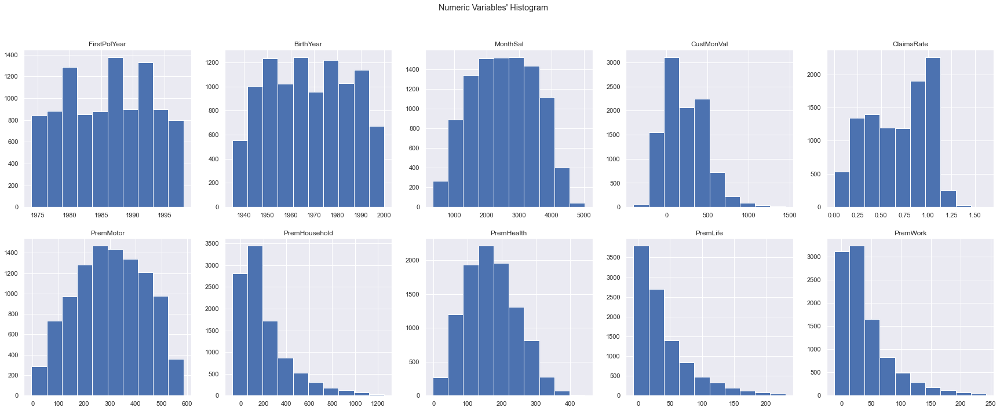

In [43]:
# Histograms for the data after outlier removal and before feature engineering.
sns.set()
fig,axes=plt.subplots(2,ceil(len(metric_features)/2),figsize=(30,11))
for ax,feat in zip(axes.flatten(),metric_features):
    ax.hist(df2[feat])
    ax.set_title(feat)
title="Numeric Variables' Histogram"
plt.suptitle(title)
plt.show()

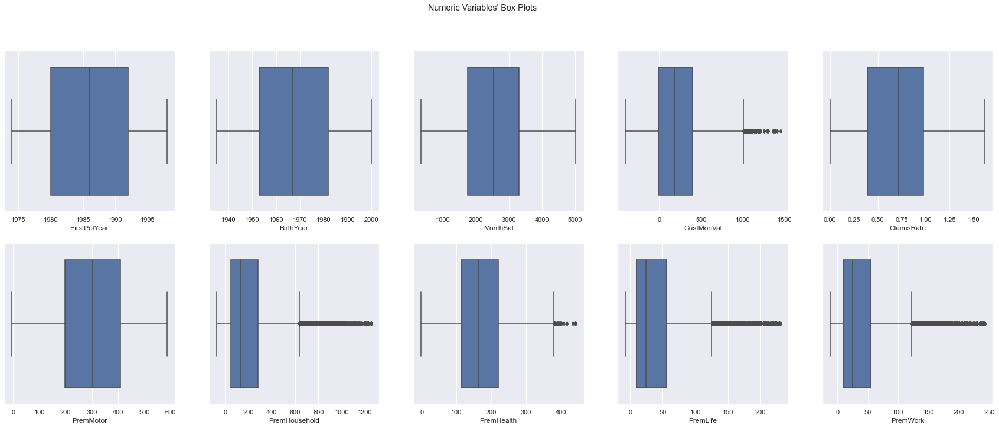

In [44]:
# Box Plots for the data after outlier removal and before feature engineering.
sns.set()
fig,axes=plt.subplots(2,ceil(len(metric_features)/2),figsize=(30,11))
for ax,feat in zip(axes.flatten(),metric_features):
    sns.boxplot(x=df2[feat],ax=ax)
title="Numeric Variables' Box Plots"
plt.suptitle(title)
plt.show()

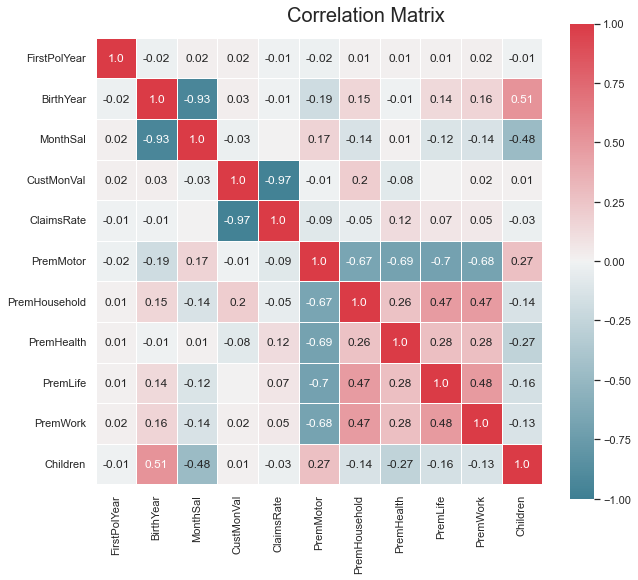

In [45]:
# "FirstPolYear" continues to not be correlated with anything. Some interesting correlations
# between "PremMotor" and the other premiums. Between "ClaimsRate" and "CustMonVal". We will
# further comment this on the report. This time we included "EducDeg" and "Children" as they
# will be useful during the clustering.

metric_features.append("Children")
metric_features.append("EducDeg")

fig=plt.figure(figsize=(10,8))
corr=np.round(df2[metric_features].corr(method="spearman"),decimals=2)
mask_annot=np.absolute(corr.values)>=0.01
annot=np.where(mask_annot, corr.values, np.full(corr.shape,""))
sns.heatmap(data=corr,annot=annot,cmap=sns.diverging_palette(220,10,as_cmap=True), 
            fmt='s',vmin=-1,vmax=1,center=0,square=True,linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix",fontsize=20)
plt.show()

metric_features.remove("Children")
metric_features.remove("EducDeg")

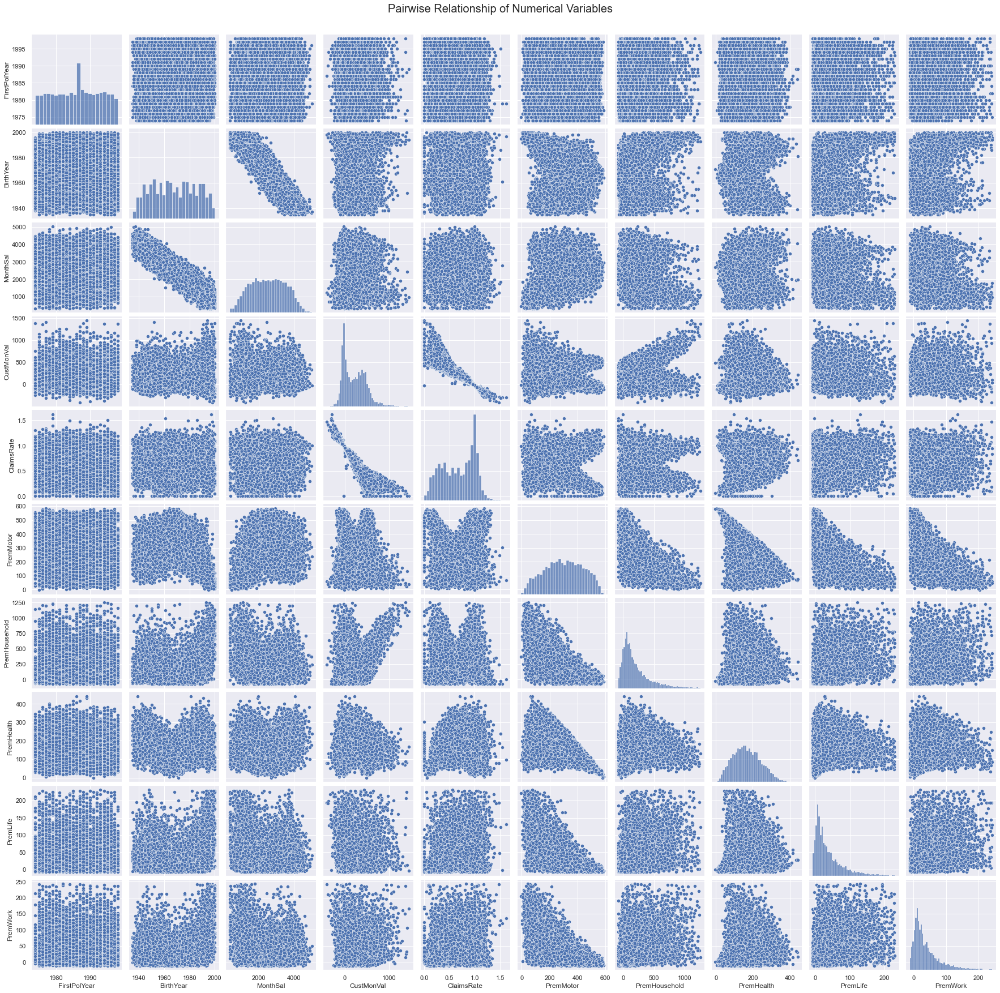

In [46]:
# We still have to eliminate some bivariate outliers. By looking at the pairwise relation
# between the different variables we can see 2 things: The first is that we still have some
# bivariate outliers. The second is that the relation between the variables is not always linear,
# as one would expect. For the Data Exploration use these plots to draw some nice conclusions.
# Explore the relation between the premiums.
sns.set()
sns.pairplot(df2[metric_features],diag_kind="hist")
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables",fontsize=20)
plt.show()

## 2.6. Filling Missing Values

In [47]:
# We create a copy of df2 called df3 where we are going to input the missing values.
df3=df2.copy()

In [48]:
# We still have missing values at this point.
df3.isna().sum()

FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         33
PremHousehold      0
PremHealth        42
PremLife         103
PremWork          86
dtype: int64

In [49]:
# For the missing values regarding "PremMotor", "PremHealth", "PremLife", and "PremWork"
# we are just going to assume that these customers chose to not have this specific
# type of insurance and chose to have the other type of insurances.
df3.loc[df3["PremMotor"].isna(),"PremMotor"]=0
df3.loc[df3["PremHealth"].isna(),"PremHealth"]=0
df3.loc[df3["PremLife"].isna(),"PremLife"]=0
df3.loc[df3["PremWork"].isna(),"PremWork"]=0

In [50]:
# But we want to drop observations where all the premiums are 0. These observations
# are probably from customers that did the register and never bought an insurance.
to_drop=df3[(df3["PremMotor"]==0)&(df3["PremHealth"]==0)&(df3["PremLife"]==0)&(df3["PremWork"]==0)&(df3["PremMotor"]==0)].index.tolist()
df3.drop(to_drop, axis=0, inplace=True)

In [51]:
# "FirstPolYear" as we seen before has a very strange behavior and is not correlated
# to any variable as we saw previously on the correlation plot. Because of that
# we choose to deleate this 30 observations. As of now, later upon more analysis
# we may even drop the whole variable. We also deal with the missing value of
# "GeoLivArea" since it was a common observation with a missing value on "FirstPolYear".
df3.drop(df3[df3["FirstPolYear"].isna()].index, axis=0, inplace=True)

In [52]:
# "BirthYear" seems to be highly correlated with "MonthSal" and moderate correlated
# with "Children", as so we are going to create a regression to estimate the "BirthYear".
# To estimate this we will only be able to use the observation that don't have a null
# value in "MonthSal" and "Children".
nan_monthsal=df3[df3["MonthSal"].isna()].index.tolist()
nan_children=df3[df3["Children"].isna()].index.tolist()
nan_birthyear=df3[df3["BirthYear"].isna()].index.tolist()
nan_both=nan_monthsal+nan_children
nan_all=nan_both+nan_birthyear

In [53]:
# Creating the dataframe that we are going to use to train the linear regression.
df_lin_reg=df3.copy()
df_lin_reg.drop(nan_all, axis=0, inplace=True)

In [54]:
# Training the Linear Regression.
linear_ref=LinearRegression()
linear_ref.fit(df_lin_reg[["MonthSal","Children"]],df_lin_reg["BirthYear"])

LinearRegression()

In [55]:
# Defining the lines we want to predict and predicting.
birthyear_to_predict=df3[df3["BirthYear"].isna()][["MonthSal","Children"]]
to_predict_index=df3[df3["BirthYear"].isna()].index
birthyear_predictions=linear_ref.predict(birthyear_to_predict)

In [56]:
# Filling the missing values with the predictions. Transforming the whole column
# in integers.
df3.loc[df3["BirthYear"].isna(),"BirthYear"]=birthyear_predictions
df3["BirthYear"]=df3["BirthYear"].astype("int")

In [57]:
# "MonthSal" is highly correlated with "BirthYear" and moderate correlated with "Children",
# and so as before, we are going to create a regression to estimate the missing values of
# "MonthSal". The reasoning will be the same as before.

In [58]:
# Training the Linear Regression. We already have the dataframes that we are going to
# use for training ready from before.
linear_reg2=LinearRegression()
linear_reg2.fit(df_lin_reg[["BirthYear","Children"]],df_lin_reg["MonthSal"])

LinearRegression()

In [59]:
# Defining the lines we want to predict and predicting.
monthsal_to_predict=df3[df3["MonthSal"].isna()][["BirthYear","Children"]]
to_predic_index2=df3[df3["MonthSal"].isna()].index
monthsal_predictions=linear_reg2.predict(monthsal_to_predict)

In [60]:
# Filling the missing values with the predictions. Also transforming the
# "MonthSal" in integer, as before we just had integer values for it.
df3.loc[df3["MonthSal"].isna(),"MonthSal"]=monthsal_predictions
df3["MonthSal"]=df3["MonthSal"].astype("int")

In [61]:
# "Children" is moderate correlated with "BirthYear" and "MonthSal", and moderate-low
# correlated with "PremMotor" and "PremHealth". We are going to use these 4 variables on
# a KNN Imputer to find out the last missing values on "Children".

In [62]:
# First we will have to guarantee that we scale these variables since we are going to use euclidean
# distances.
knn_features=["BirthYear", "MonthSal", "PremMotor","PremHealth","Children"]
df_to_scale=df3[knn_features].copy()

min_max=MinMaxScaler()
min_max.fit(df_to_scale)
df_scaled=min_max.transform(df_to_scale)
df_scaled=pd.DataFrame(data=df_scaled, index=df_to_scale.index, columns=df_to_scale.columns)
df_scaled.head()

,BirthYear,MonthSal,PremMotor,PremHealth,Children
CustID,,,,,
1.0,0.723077,0.393345,0.644732,0.333663,1.0
2.0,0.923077,0.073379,0.138411,0.266984,1.0
3.0,0.538462,0.414676,0.356778,0.284716,0.0
4.0,0.707692,0.163396,0.316614,0.704047,1.0
5.0,0.584615,0.305034,0.581559,0.415084,1.0


In [63]:
# Checking which are the rows that we are going to end up predicting.
nan_children=df_scaled[df_scaled["Children"].isna()].index
df_scaled.loc[nan_children]

,BirthYear,MonthSal,PremMotor,PremHealth,Children
CustID,,,,,
620.0,0.907692,0.213311,0.493679,0.399600,NaN
773.0,0.215385,0.697099,0.184990,0.646605,NaN
2363.0,0.615385,0.271758,0.503487,0.362384,NaN
2672.0,0.815385,0.172142,0.292094,0.620379,NaN
3178.0,0.615385,0.493601,0.693194,0.253747,NaN
3281.0,0.215385,0.677474,0.296625,0.520732,NaN
3685.0,0.369231,0.587244,0.629834,0.285210,NaN
4729.0,0.446154,0.513439,0.821798,0.192058,NaN
5438.0,0.723077,0.316553,0.639642,0.333416,NaN


In [64]:
# As the only null values in the previously created DataFrame is on
# Children we can use directly the KNNImputer.
imputer=KNNImputer(n_neighbors=5, weights="uniform")
imputer.fit(df_scaled)
df_solved=imputer.transform(df_scaled)
df_solved=pd.DataFrame(data=df_solved, index=df_scaled.index, columns=df_scaled.columns)

In [65]:
# Transforming the decimal prediction in 0's or 1's.
df_solved["Children"]=df_solved["Children"].astype("int")

In [66]:
# Getting an array of the predictions.
prediction_array=df_solved.loc[nan_children, "Children"].values
prediction_array

array([0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0])

In [67]:
# Filling the missing values in the "Children" column in our dataframe.
df3.loc[nan_children,"Children"]=prediction_array

In [68]:
# As we only have 2 missing values missing in "EducDeg" we decided to just use the
# mode to fill here the value.
modes=df3["EducDeg"].mode()[0]
df3.fillna(modes, inplace=True)

In [69]:
# We no longer have any missing value.
df3.isna().sum()

FirstPolYear     0
BirthYear        0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [70]:
# Converting "FirstPolYear", "BirthYear", "EducDeg", "GeoLivArea", "Children"
# to the right datatype as they have to be integers and not floats. Before we couldn't
# perform this as we had null values in our observations. We couldn't round it before
# because at first we had a couple of null values in the first policy year and birth year
# column.
df3["FirstPolYear"]=df3["FirstPolYear"].astype("int")
df3["BirthYear"]=df3["BirthYear"].astype("int")
df3["EducDeg"]=df3["EducDeg"].astype("int")
df3["GeoLivArea"]=df3["GeoLivArea"].astype("int")
df3["Children"]=df3["Children"].astype("int")

In [71]:
# Having a look at the head of our dataframe.
df3.head()

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1.0,1985,1982,2,2177,1,1,380.97,0.39,375.85,79.45,146.36,47.01,16.89
2.0,1981,1995,2,677,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
3.0,1991,1970,1,2277,3,0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
4.0,1990,1981,3,1099,4,1,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
5.0,1986,1973,3,1763,4,1,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [72]:
# Do some descriptive statistics now that we removed outliers and filled
# the missing values. Everything looks alright.
df3.describe().T

,count,mean,std,min,25%,50%,75%,max
FirstPolYear,10039.0,1986.020520,6.600185,1974.00,1980.00,1986.00,1992.000,1998.00
BirthYear,10039.0,1967.683136,17.147529,1935.00,1953.00,1967.00,1982.000,2000.00
EducDeg,10039.0,2.499153,0.784370,1.00,2.00,3.00,3.000,4.00
MonthSal,10039.0,2519.403626,973.963808,333.00,1743.00,2526.00,3299.000,5021.00
GeoLivArea,10039.0,2.709832,1.266837,1.00,1.00,3.00,4.000,4.00
Children,10039.0,0.707242,0.455051,0.00,0.00,1.00,1.000,1.00
CustMonVal,10039.0,216.371797,250.939089,-402.96,-8.44,187.03,397.915,1448.28
ClaimsRate,10039.0,0.680620,0.316793,0.00,0.39,0.72,0.980,1.62
PremMotor,10039.0,300.555821,135.931895,-4.11,197.26,302.39,409.300,585.22
PremHousehold,10039.0,200.230152,221.909347,-75.00,48.90,131.70,283.950,1255.25


## 2.7. Data Visualization III

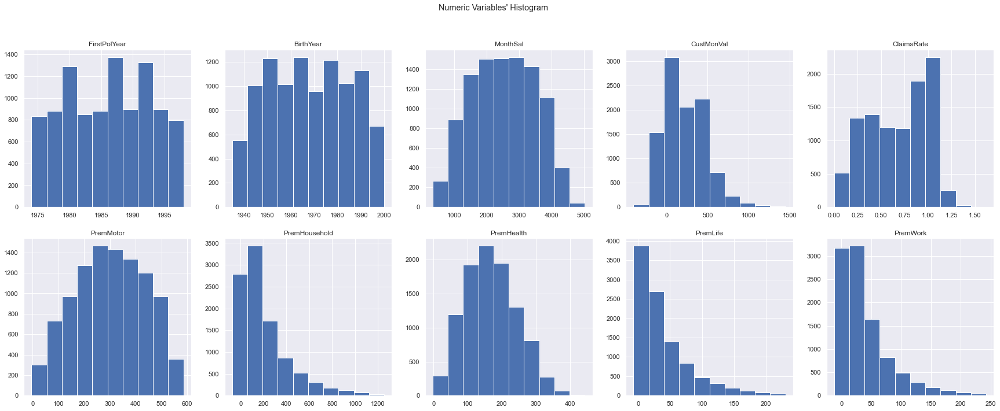

In [73]:
# Histograms for the data after outlier removal and before feature engineering.
sns.set()
fig,axes=plt.subplots(2,ceil(len(metric_features)/2),figsize=(30,11))
for ax,feat in zip(axes.flatten(),metric_features):
    ax.hist(df3[feat])
    ax.set_title(feat)
title="Numeric Variables' Histogram"
plt.suptitle(title)
plt.show()

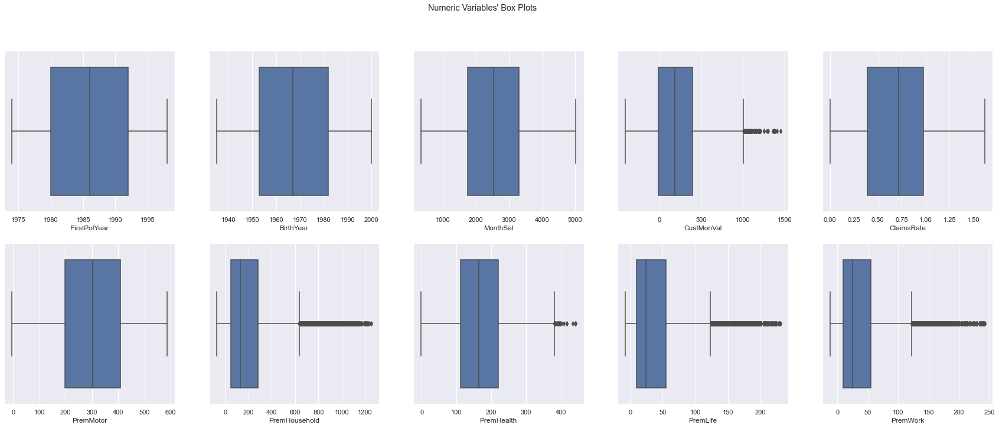

In [74]:
# Box Plots for the data after outlier removal and before feature engineering.
sns.set()
fig,axes=plt.subplots(2,ceil(len(metric_features)/2),figsize=(30,11))
for ax,feat in zip(axes.flatten(),metric_features):
    sns.boxplot(x=df3[feat],ax=ax)
title="Numeric Variables' Box Plots"
plt.suptitle(title)
plt.show()

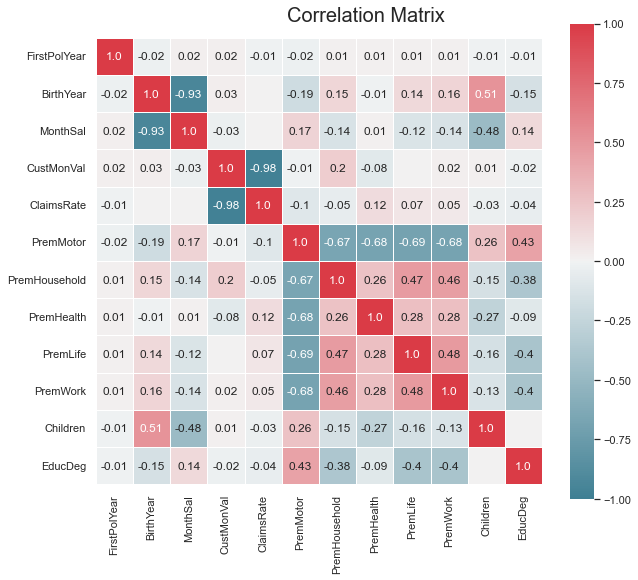

In [75]:
# "FirstPolYear" continues to not be correlated with anything. Some interesting correlations
# between "PremMotor" and the other premiums. Between "ClaimsRate" and "CustMonVal". We will
# further comment this on the report. This time we included "EducDeg" and "Children" as they
# will be useful during the clustering.

metric_features.append("Children")
metric_features.append("EducDeg")

fig=plt.figure(figsize=(10,8))
corr=np.round(df3[metric_features].corr(method="spearman"),decimals=2)
mask_annot=np.absolute(corr.values)>=0.01
annot=np.where(mask_annot, corr.values, np.full(corr.shape,""))
sns.heatmap(data=corr,annot=annot,cmap=sns.diverging_palette(220,10,as_cmap=True), 
            fmt='s',vmin=-1,vmax=1,center=0,square=True,linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix",fontsize=20)
plt.show()

metric_features.remove("Children")
metric_features.remove("EducDeg")

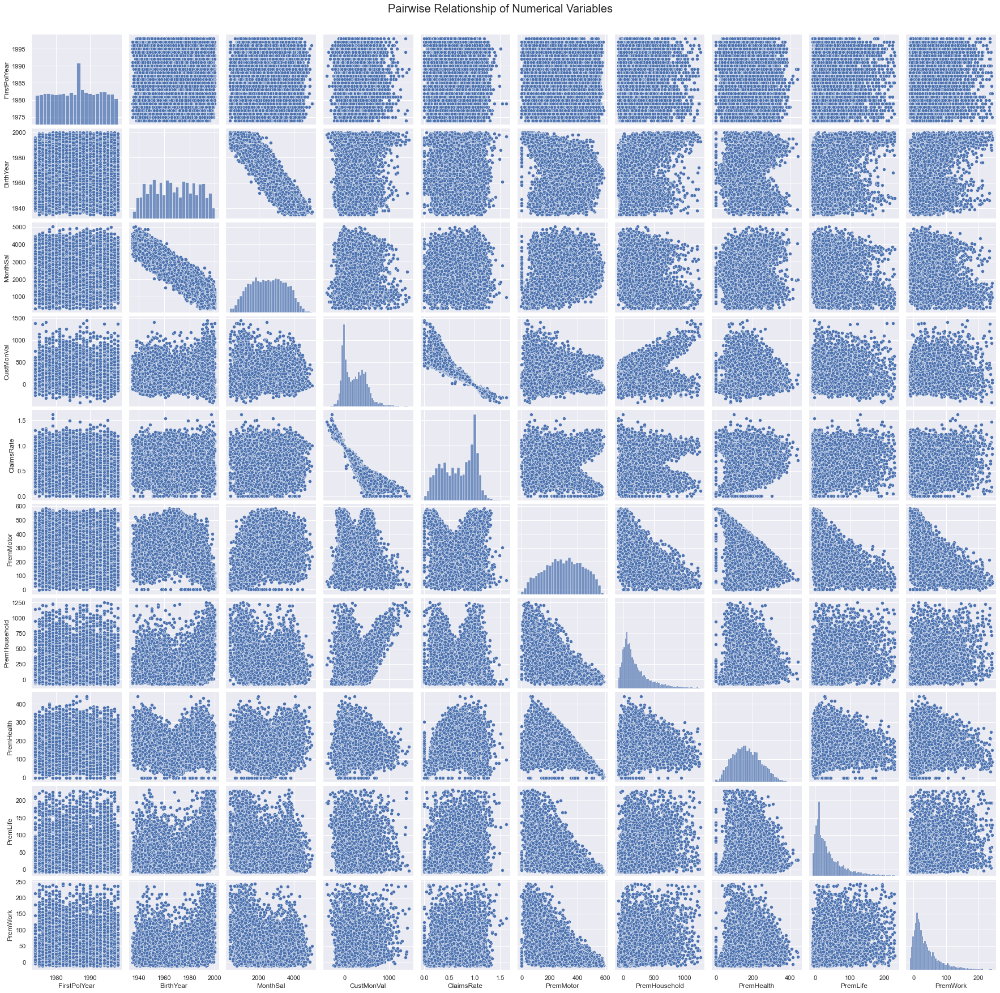

In [76]:
# We still have to eliminate some bivariate outliers. By looking at the pairwise relation
# between the different variables we can see 2 things: The first is that we still have some
# bivariate outliers. The second is that the relation between the variables is not always linear,
# as one would expect. For the Data Exploration use these plots to draw some nice conclusions.
# Explore the relation between the premiums.
sns.set()
sns.pairplot(df3[metric_features],diag_kind="hist")
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables",fontsize=20)
plt.show()

## 2.8. Feature Engineering

In [77]:
# Creating a copy to perform feature engineering.
df4=df3.copy()

In [78]:
# Further explanation on the variables created will be presented on the report.
df4["Age"]=2016-df4["BirthYear"]
df4["Fidelity"]=2016-df4["FirstPolYear"]
df4["Annual_Salary"]=12*df4["MonthSal"]
df4["Total_Premium"]=df4["PremMotor"]+df4["PremHousehold"]+df4["PremHealth"]+df4["PremLife"]+df4["PremWork"]
df4["Insurance_Burden"]=df4["Total_Premium"]/df4["Annual_Salary"]

In [79]:
# Checking the portion of the total premium that comes from the household premium.
# For the reversal we set the ratio to be 0, as we don't want negative ratios.
df4["Household_Ratio"]=df4["PremHousehold"]/df4["Total_Premium"]
household_negative=df4[df4["PremHousehold"]<0].index
df4.loc[household_negative,"Household_Ratio"]=0

In [80]:
# Checking the portion of the total premium that comes from the health premium.
# For the reversal we set the ratio to be 0, as we don't want negative ratios.
df4["Health_Ratio"]=df4["PremHealth"]/df4["Total_Premium"]
health_negative=df4[df4["PremHealth"]<0].index
df4.loc[health_negative,"Health_Ratio"]=0

In [81]:
# Checking the portion of the total premium that comes from the life premium.
# For the reversal we set the ratio to be 0, as we don't want negative ratios.
df4["Life_Ratio"]=df4["PremLife"]/df4["Total_Premium"]
life_negative=df4[df4["PremLife"]<0].index
df4.loc[life_negative,"Life_Ratio"]=0

In [82]:
# Checking the portion of the total premium that comes from the work premium.
# For the reversal we set the ratio to be 0, as we don't want negative ratios.
df4["Work_Ratio"]=df4["PremWork"]/df4["Total_Premium"]
work_negative=df4[df4["PremWork"]<0].index
df4.loc[work_negative,"Work_Ratio"]=0

In [83]:
# Checking the portion of the total premium that comes from the motor premium.
# For the reversal we set the ratio to be 0, as we don't want negative ratios.
df4["Motor_Ratio"]=df4["PremMotor"]/df4["Total_Premium"]
motor_negative=df4[df4["PremMotor"]<0].index
df4.loc[motor_negative,"Motor_Ratio"]=0

In [84]:
# Creating a dummy variable that takes the value 1 if any of the insurance premiums was cancelled,
# and takes the value 0 if we didn't have the cancellation of any insurance of the insurances.
df4["Cessation"]=0
df4.loc[household_negative,"Cessation"]=1
df4.loc[health_negative,"Cessation"]=1
df4.loc[life_negative,"Cessation"]=1
df4.loc[work_negative,"Cessation"]=1
df4.loc[motor_negative,"Cessation"]=1

In [85]:
# Dropping from the dataset features that explain exactly the same as the ones created,
# and won't be useful going ahead.
df4.drop(columns=["BirthYear"],inplace=True)
df4.drop(columns=["FirstPolYear"],inplace=True)
df4.drop(columns=["MonthSal"],inplace=True)

In [86]:
# Appending to, and removing from our list the new and old variables.
metric_features.append("Age")
metric_features.append("Fidelity")
metric_features.append("Annual_Salary")
metric_features.append("Total_Premium")
metric_features.append("Household_Ratio")
metric_features.append("Health_Ratio")
metric_features.append("Life_Ratio")
metric_features.append("Work_Ratio")
metric_features.append("Motor_Ratio")
metric_features.append("Insurance_Burden")
metric_features.append("Cessation")
metric_features.remove("BirthYear")
metric_features.remove("FirstPolYear")
metric_features.remove("MonthSal")

In [87]:
# Checking if everything was performed correctly.
df4.head()

,EducDeg,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,...,Fidelity,Annual_Salary,Total_Premium,Insurance_Burden,Household_Ratio,Health_Ratio,Life_Ratio,Work_Ratio,Motor_Ratio,Cessation
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,2,1,1,380.97,0.39,375.85,79.45,146.36,47.01,16.89,...,31,26124,665.56,0.025477,0.119373,0.219905,0.070632,0.025377,0.564712,0
2.0,2,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13,...,35,8124,910.96,0.112132,0.456881,0.128096,0.213489,0.116503,0.085031,0
3.0,1,3,0,504.67,0.28,206.15,224.50,124.58,86.35,99.02,...,25,27324,740.60,0.027104,0.303133,0.168215,0.116595,0.133702,0.278355,0
4.0,3,4,1,-16.99,0.99,182.48,43.35,311.17,35.34,28.34,...,26,13188,600.68,0.045547,0.072168,0.518030,0.058833,0.047180,0.303789,0
5.0,3,4,1,35.23,0.90,338.62,47.80,182.59,18.78,41.45,...,30,21156,629.24,0.029743,0.075965,0.290175,0.029846,0.065873,0.538141,0


In [88]:
# Checking if we have any null values resultant from the feature engineering.
df4.isna().sum()

EducDeg             0
GeoLivArea          0
Children            0
CustMonVal          0
ClaimsRate          0
PremMotor           0
PremHousehold       0
PremHealth          0
PremLife            0
PremWork            0
Age                 0
Fidelity            0
Annual_Salary       0
Total_Premium       0
Insurance_Burden    0
Household_Ratio     0
Health_Ratio        0
Life_Ratio          0
Work_Ratio          0
Motor_Ratio         0
Cessation           0
dtype: int64

## 2.9. Data Visualization IV

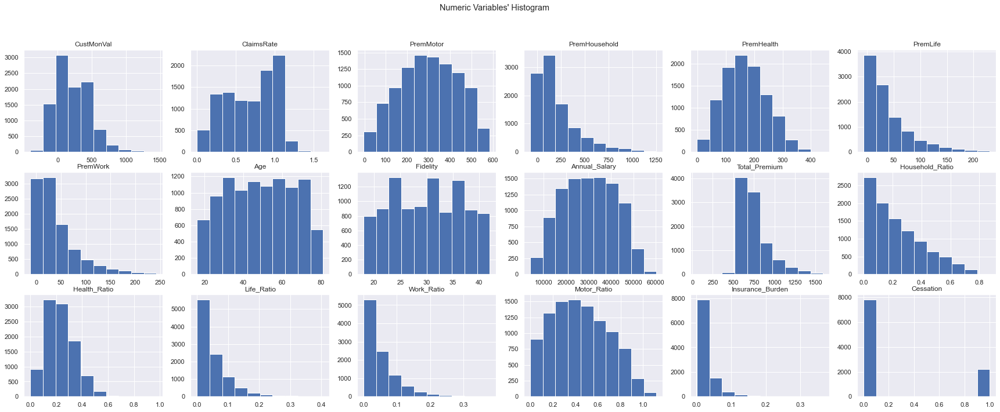

In [89]:
# Histograms for the data after removing the outliers and performing feature engineering.
sns.set()
fig,axes=plt.subplots(3,ceil(len(metric_features)/3),figsize=(30,11))
for ax,feat in zip(axes.flatten(),metric_features):
    ax.hist(df4[feat])
    ax.set_title(feat)
title="Numeric Variables' Histogram"
plt.suptitle(title)
plt.show()

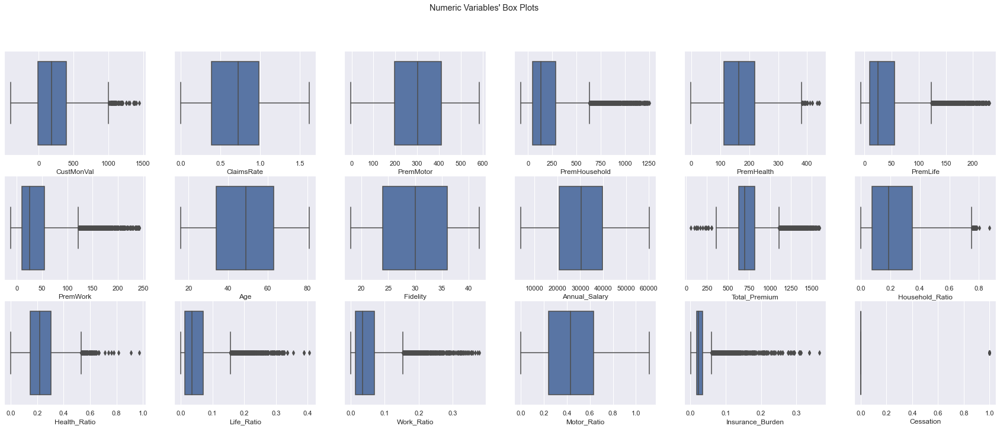

In [90]:
# Box Plots for the data after removing the outliers and performing feature engineering.
sns.set()
fig,axes=plt.subplots(3,ceil(len(metric_features)/3),figsize=(30,11))
for ax,feat in zip(axes.flatten(),metric_features):
    sns.boxplot(x=df4[feat],ax=ax)
title="Numeric Variables' Box Plots"
plt.suptitle(title)
plt.show()

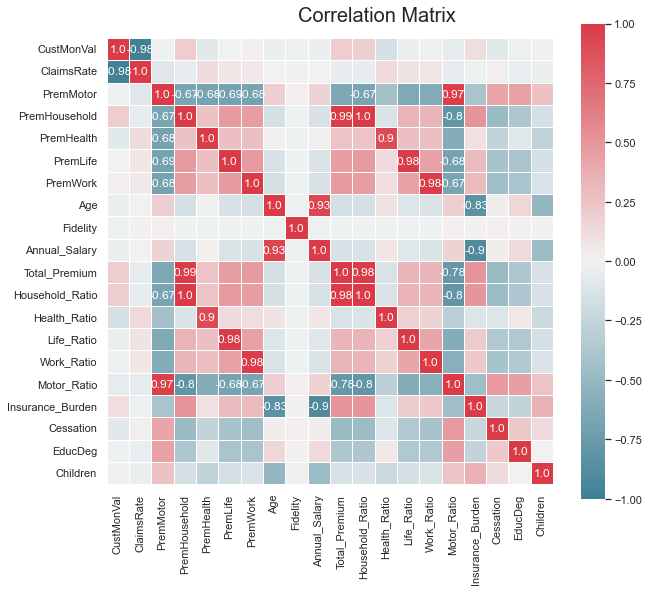

In [91]:
# We use spearman as some of the relations between the variables
# may be non-linear.
metric_features.append("EducDeg")
metric_features.append("Children")
fig=plt.figure(figsize=(10,8))
corr=np.round(df4[metric_features].corr(method="spearman"),decimals=2)
mask_annot=np.absolute(corr.values)>=0.65
annot=np.where(mask_annot, corr.values, np.full(corr.shape,""))
sns.heatmap(data=corr,annot=annot,cmap=sns.diverging_palette(220,10,as_cmap=True), 
            fmt='s',vmin=-1,vmax=1,center=0,square=True,linewidths=.5)
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix",fontsize=20)
plt.show()
metric_features.remove("EducDeg")
metric_features.remove("Children")

## 2.10. Outlier Removal and Variable Cleaning from the Feature Engineering Features

In [92]:
# Defining the new features that may require outlier remotion.
new_features=["Total_Premium", "Household_Ratio", "Health_Ratio", "Life_Ratio", "Work_Ratio",
             "Motor_Ratio", "Insurance_Burden"]

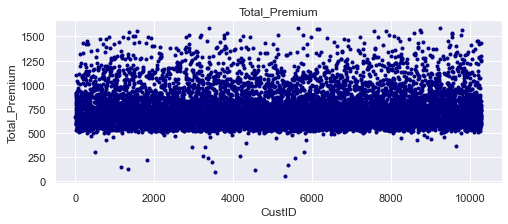

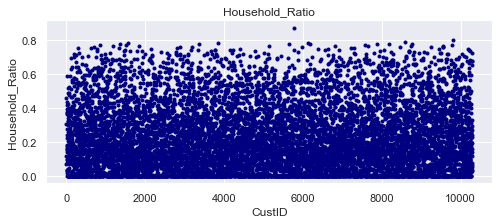

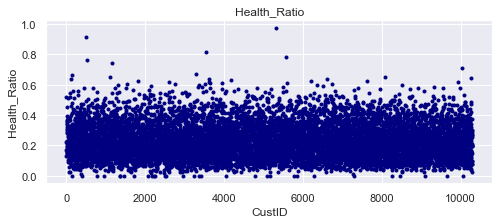

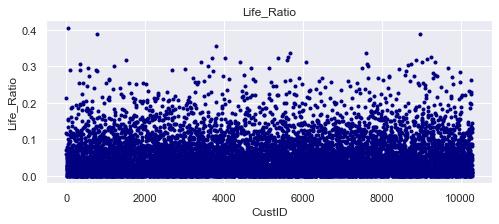

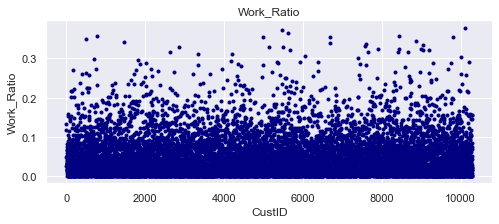

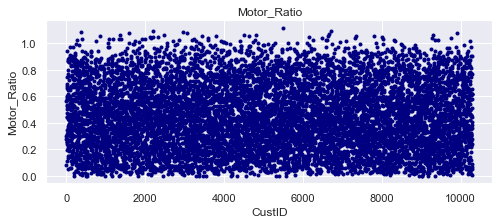

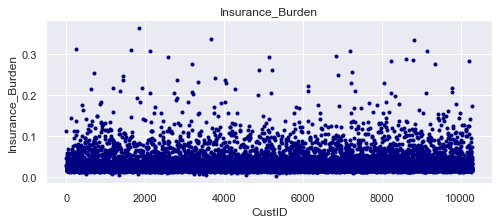

In [93]:
for feature in new_features:
    plt.figure(figsize = (8, 3))
    plt.plot(df4[feature], 'o', ms = 3, color = 'navy')
    plt.autoscale(enable=True)
    plt.xlabel('CustID')
    plt.ylabel(feature)
    plt.title(feature)

In [94]:
# At this step we won't do much cleaning as we already did outlier removal
# on the basic features. Nonetheless, some of the new variables caught our
# sight and we decided to remove these observations.
out_1=df4[df4['Household_Ratio']>0.80].index.tolist()
out_2=df4[df4['Health_Ratio']>0.70].index.tolist()
out_3=df4[df4['Motor_Ratio']>1].index.tolist()
out_all=out_1+out_2+out_3
df4.drop(out_all, axis=0, inplace=True)

In [95]:
# At this point we already understood that "Fidelity" brings a lot of problems
# and doesn't correlate with any variable, so we decide to drop it as we don't
# want to use it in our analysis. Also dropping it from the metric features.
df4.drop(["Fidelity"], axis=1, inplace=True)
metric_features.remove("Fidelity")

## 2.11. Exploring "GeoLivArea"

In [96]:
# Comparing "GeoLivArea" with "Children". Creating a DataFrame that
# will have as index the different regions, as columns if they have
# children or not, and as values the proportion within that region.
# At first sight, no significant differences are verified.
geo_child=df4.groupby(["GeoLivArea","Children"]).size().unstack()
for index in geo_child.index:
    geo_child.loc[index]=round((geo_child.loc[index])/(sum(geo_child.loc[index])),3)*100
pd.DataFrame(geo_child)

Children,0,1
GeoLivArea,,
1,28.1,71.9
2,30.6,69.4
3,28.4,71.6
4,30.6,69.4


In [97]:
# Comparing "GeoLivArea" with "Children". Creating a DataFrame that
# will have as index the different regions, as columns if they have
# children or not, and as values the proportion within that region.
# At first sight, no significant differences are verified.
geo_educ=df4.groupby(["GeoLivArea","EducDeg"]).size().unstack()
for index in geo_educ.index:
    geo_educ.loc[index]=round((geo_educ.loc[index])/(sum(geo_educ.loc[index])),3)*100
pd.DataFrame(geo_educ)

EducDeg,1,2,3,4
GeoLivArea,,,,
1,11.5,33.7,47.7,7.1
2,11.7,34.8,46.8,6.8
3,11.2,33.5,48.7,6.7
4,11.5,35.5,46.6,6.4


In [98]:
# Comparing "GeoLivArea" with "MonthSal". At first sight,
# no significant differences are verified.
pd.DataFrame(df4.groupby("GeoLivArea")["Annual_Salary"].mean())

,Annual_Salary
GeoLivArea,
1,29910.610169
2,30908.103586
3,30056.794355
4,30348.471994


In [99]:
# Comparing "GeoLivArea" with "MonthSal". At first sight,
# no significant differences are verified.
pd.DataFrame(df3.groupby("GeoLivArea")["PremHousehold"].mean())

,PremHousehold
GeoLivArea,
1,201.783726
2,195.667490
3,197.648554
4,201.509068


In [100]:
# "GeoLivArea" doesn't seem to have a relation with any of the variables
# that would make sense to have. One would expect to have regions where the
# customer would have a higher "Annual_Salary" than in others, it is not
# verified. One would also expect a similar relation when we relate it 
# with "Children", "EducDeg", and "PremHousehold". Going ahead we are thinking
# about not using it as it doesn't have that much of discriminative power.

# 3. Segmentation

In [101]:
# We decided to segment in 3 different segments, which then we are going to apply
# different clustering algorithms to them and try to understand which technique
# works better with each one of them. For each one of the segments we are going
# to create different dataframes with different variations of the variables and
# find out which dataframe works the best.

In [102]:
# Before dividing them, we are going to scale the data, as we want each variable
# to have the same weight in our clustering algorithm. This is needed because
# normally the clustering algorithms use euclidean distances as the similarity
# metric.
metric_features.append("EducDeg")
metric_features.append("Children")

# Performing Standard Scaling and creating df5_standard.
df5=df4[metric_features].copy()
scaling1=StandardScaler()
scaling1.fit(df5)
df5_standard=scaling1.transform(df5)
df5_standard=pd.DataFrame(data=df5_standard, index=df5.index, columns=df5.columns)

# Performing Min Max Scaling and creating df5_minmax.
scaling2=MinMaxScaler()
scaling2.fit(df5)
df5_minmax=scaling2.transform(df5)
df5_minmax=pd.DataFrame(data=df5_minmax, index=df5.index, columns=df5.columns)

In [103]:
# For the Customer Demographic Segment we chose "Age", "Children", "EducDeg", and "Annual_Salary",
# as the variables to use. We will create different variants of this dataframe to understand
# then which are the better ones to include and with which scaling, for example.
cust_demographic=["Age","Children","EducDeg","Annual_Salary"]

# As "Age" and "Annual_Salary" are highly correlated we can only include one of them at a time,
# so we are going to use different dataframes to check which one is the better for clustering.
# Nonetheless, we are always going to include the excluded one on the final analysis.
cust_demographic1=["EducDeg","Annual_Salary"]
cust_demographic2=["Age","EducDeg"]

# Creating the dataframes using cust_demographic1.
demo_df1_minmax=df5_minmax[cust_demographic1]
demo_df1_standard=df5_standard[cust_demographic1]

# Creating the dataframes using cust_demographic2.
demo_df2_minmax=df5_minmax[cust_demographic2]
demo_df2_standard=df5_standard[cust_demographic2]

In [104]:
# For the Insurance Package Segment we chose "PremMotor", "PremHousehold", "PremHealth", "PremLife", "PremWork"
# as the variables to use. We will create different variants of this dataframe to understand
# then which are the better ones to include and with which scaling, for example.
insur_package=["PremMotor","PremHousehold","PremHealth","PremLife","PremWork"]
insur_package_ratio=["Household_Ratio","Health_Ratio","Life_Ratio","Work_Ratio","Motor_Ratio"]

# "PreMotor" is highly correlated with the other premiums so we will exclude it from the clustering
# but when analysing the clusters we are going to include it again so we can get insights with it.
insur_package1=["PremHousehold","PremHealth","PremLife","PremWork"]
pack_df1_minmax=df5_minmax[insur_package1]
pack_df1_standard=df5_standard[insur_package1]

# "Motor_Ratio" is highly correlated with the other ratios so we will exlude it from the clustering
# but when analysing the clusters we are going to include it again so we can get insights from it.
insur_package_ratio1=["Household_Ratio","Health_Ratio","Life_Ratio","Work_Ratio"]
pack_df2_minmax=df5_minmax[insur_package_ratio1]
pack_df2_standard=df5_standard[insur_package_ratio1]

In [105]:
# For the Customer Importance Segment we chose "CustMonVal", "ClaimsRate", "Total_Premium",
# "Cessation", and "Insurance_Burden" as the variables to use. We will create different
# variants of this dataframe to understand then which are the better ones to include and
# with which scaling, for example.
cust_importance=["CustMonVal", "ClaimsRate", "Total_Premium", "Cessation", "Insurance_Burden"]

# As "ClaimsRate" and "CustMonVal" are highly correlated we can only have one of them at
# a time, we will create two option, one with each one of them at a time, and check which
# is the dataframe that gives clearer clusters.
cust_importance1=["ClaimsRate", "Total_Premium", "Insurance_Burden"]
cust_importance2=["CustMonVal", "Total_Premium", "Insurance_Burden"]

# Creating the dataframes using cust_importance1.
import_df1_minmax=df5_minmax[cust_importance1]
import_df1_standard=df5_standard[cust_importance1]

# Creating the dataframes using cust_importance2.
import_df2_minmax=df5_minmax[cust_importance2]
import_df2_standard=df5_standard[cust_importance2]

# 4. Clustering

## 4.1 Support Functions

In [106]:
#This function will retrieve the r2 metrics for a hierarchical clustering solution applied on a 
#given dataframe for every number of clusters within a range
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss
    sst = get_ss(df)
    r2 = []
    for i in range(min_nclus, max_nclus+1):  
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hc_labels = cluster.fit_predict(df)
        hc_labels=pd.DataFrame(data=hc_labels, index=df.index, columns=['Labels'])
        df_concat=pd.concat([df[metric_features_used], hc_labels], join='inner', ignore_index=False, axis=1)
        ssw_labels = df_concat.groupby(by='Labels').apply(get_ss)
        ssb = sst - np.sum(ssw_labels)
        r2.append(ssb / sst)
    return np.array(r2)

In [107]:
#This function will plot a histogram for every variable in every cluster on a given dataframe.
#Limits for the X axis were altered as to allow visual comparisons between clusters.
def clust_profiler(df, labels):
    fig, axes=plt.subplots(ceil(len(np.unique(labels))),ceil(len(df.columns)),figsize=(30,10))
    for m, i in enumerate(np.unique(labels)):
        j=0
        for feat in df.columns:
            min_value = df[feat].min()-0.1
            max_value = df[feat].max()+0.1
            axes[m, j].hist(df.loc[df.Labels==i][feat])
            axes[m, j].set_title(f'{feat} - {i}')
            axes[m, j].set_xlim(min_value, max_value)
            j+=1    
    print(f'Number of rows in axes: {axes.shape[0]}')
    print(f'Number of columns in axes: {axes.shape[1]}')
    print(f'Number of unique cluster labels: {len(np.unique(labels))}')
    print(f'Number of features: {len(df.columns)}')
    print(f'Number of rows in df: {df.shape[0]}')

In [108]:
range_clusters = range(1, 11)
# Function that will plot the inertia.

def inertia_plot(df_to_plot):
    
    # Using "k-means++" and n_init=15 as it will give better initialization points.
    # Iterating over the desired ncluster range and saving the inertia of the given
    # cluster solution.
    
    inertia = []
    for n_clus in range_clusters: 
        kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
        kmclust.fit(df_to_plot)
        inertia.append(kmclust.inertia_)
    
    # Plotting the inertia.
    
    plt.figure(figsize=(9,5))
    plt.plot(inertia)
    plt.ylabel("Inertia: SSW")
    plt.xlabel("Number of clusters")
    plt.title("Inertia plot over clusters", size=15)
    return plt.show()

In [109]:
#plot the silhouette.

def silhouette_plot(df_to_plot):
    
    # Storing average silhouette metric.
    avg_silhouette = []
    for nclus in range_clusters:
        # Skip nclus == 1.
        if nclus == 1:
            continue

        # Create a figure.
        fig = plt.figure(figsize=(13, 7))

        # Initialize the KMeans object with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
        cluster_labels = kmclust.fit_predict(df_to_plot)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed clusters.
        silhouette_avg = silhouette_score(df_to_plot, cluster_labels)
        avg_silhouette.append(silhouette_avg)
        print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

        # Compute the silhouette scores for each sample.
        sample_silhouette_values = silhouette_samples(df_to_plot, cluster_labels)

        y_lower = 10
        for i in range(nclus):
            # Aggregate the silhouette scores for samples belonging to cluster i, and sort them.
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            # Get y_upper to demarcate silhouette y range size.
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            # Filling the silhouette.
            color = cm.nipy_spectral(float(i) / nclus)
            plt.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            # Label the silhouette plots with their cluster numbers at the middle.
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot.
            y_lower = y_upper + 10  # 10 for the 0 samples.

        plt.title(f"The silhouette plot for the various clusters for df{n_iterator}")
        plt.xlabel("The silhouette coefficient values")
        plt.ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values.
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")

        # The silhouette coefficient can range from -1, 1.
        xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
        plt.xlim([xmin, xmax])

        # The (nclus+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        plt.ylim([0, len(df_to_plot) + (nclus + 1) * 10])

        plt.yticks([])  # Clear the yaxis labels / ticks.
        plt.xticks(np.arange(xmin, xmax, 0.1))
        
    # The average silhouette plot
    # The inertia plot
    plt.figure(figsize=(9,5))
    plt.plot(range_clusters[1:],avg_silhouette)
    plt.ylabel("Average silhouette")
    plt.xlabel("Number of clusters")
    plt.title("Average silhouette plot over clusters", size=15)
    return plt.show()

In [110]:
#DBSCAN clustering recognizes  outliers and assigns them to cluster -1.
#As we want to have the same number of observations in every clustering solution so as to
#develop an unbiased analysis, we had to find a way to reassign those outlier data points to
#other clusters.
#This function takes a dataframe(with scaled data) without the cluster labels and another one
#just consisting of cluster labels. It will separate the instances in which the cluster label was -1,
#and train a decision tree classifier on the remaining(with the target being the cluster label).
#Finally, the function will take the trained classifier and predict the cluster labels for the data 
#stored away for reassignment.
#It will retrive a dataframe(with unscaled data, so ready to plot and analyze) with all the datapoints
#used for clustering purposes, in which no none will have an outlier label.  
def  outlier_ddt_imputer(df, labels, features):
    train=df.copy()
    train=pd.concat([train, labels], join='inner', ignore_index=False, axis=1)
    to_predict=train[train['Labels'] == -1]
    to_predict.drop(['Labels'], axis=1, inplace=True)
    to_drop=train[train['Labels'] == -1].index.to_list()
    train.drop(to_drop, axis=0, inplace=True)
    target=pd.DataFrame(data=train['Labels'])
    train.drop(['Labels'], axis=1, inplace=True)
    dt=DecisionTreeClassifier()
    dt.fit(train, target)
    train_preds=dt.predict(train.loc[:, train.columns!='Labels'])
    preds=dt.predict(to_predict)
    score_target=target['Labels'].values
    score=f1_score(score_target, train_preds, average='weighted')
    preds=pd.DataFrame(data=preds, index=to_predict.index, columns=['Labels'])
    target_and_preds=pd.concat([target, preds], axis=0)
    goal_df=pd.concat([df4[features], target_and_preds], join='inner', ignore_index=False, axis=1)
    #print(f'The train score of the ddt imputer is {score}!')
    return goal_df

In [111]:
# K-distance graph to find out the right eps value
def epsilon_finder(df, n_neighbors=20):
    neigh = NearestNeighbors(n_neighbors=n_neighbors)
    neigh.fit(df)
    distances, _ = neigh.kneighbors(df)
    distances = np.sort(distances[:, -1])
    plt.plot(distances)
    plt.show()

## 4.2 Ploting to choose parameters for Clustering

In [112]:
#Fitting the the hierarchical clustering algorithm for further dendogram plot 
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)

In [113]:
#Defining the list of outliers used in the for loops for r2 and dendrogram plots.
df_range=[demo_df1_minmax, demo_df1_standard, demo_df2_minmax, demo_df2_standard, pack_df1_minmax, pack_df1_standard, pack_df2_minmax, pack_df2_standard, import_df1_minmax, import_df1_standard, import_df2_minmax, import_df2_standard]

df1 done!
df2 done!
df3 done!
df4 done!
df5 done!
df6 done!
df7 done!
df8 done!
df9 done!
df10 done!
df11 done!
df12 done!


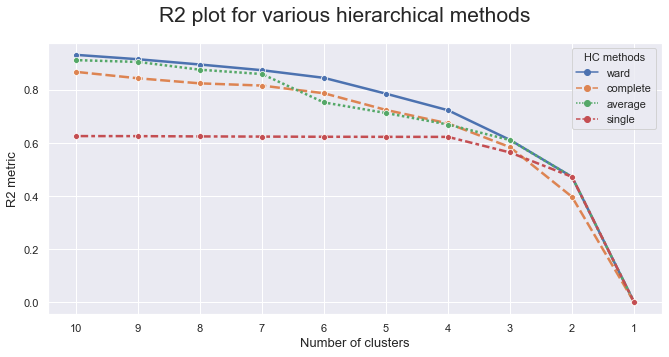

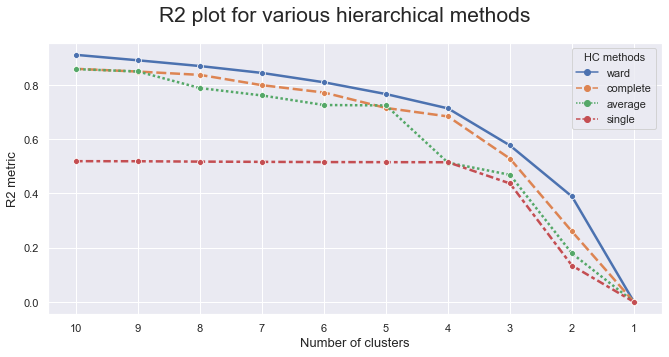

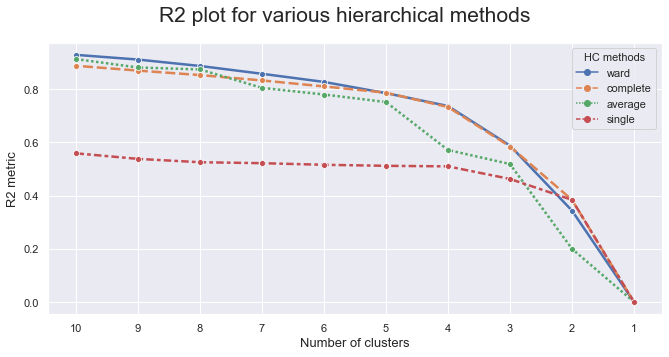

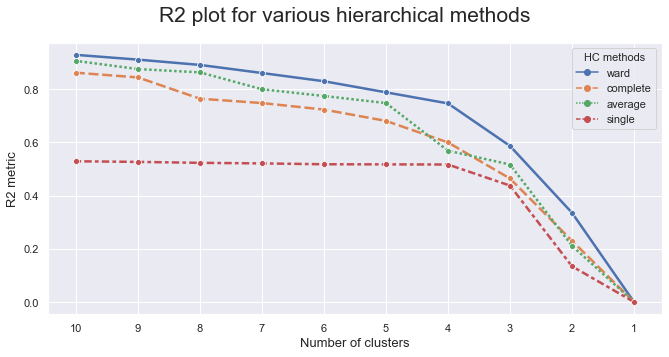

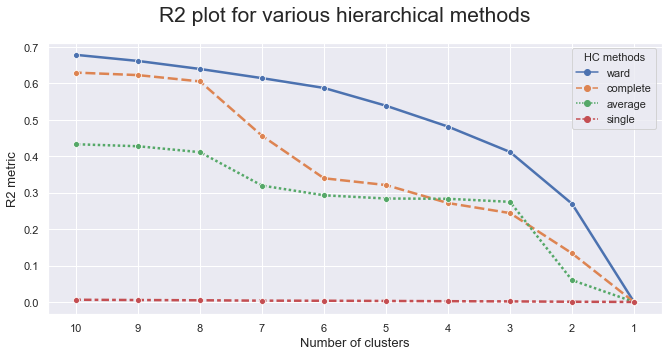

...

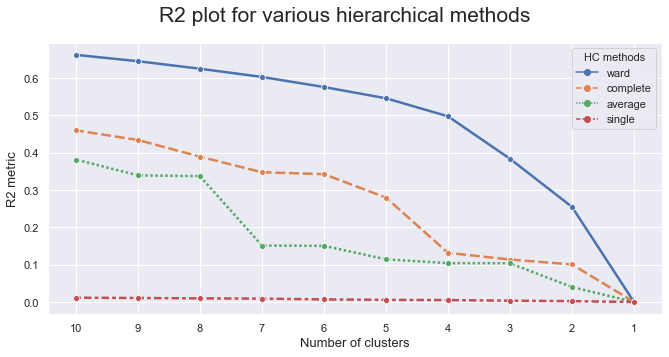

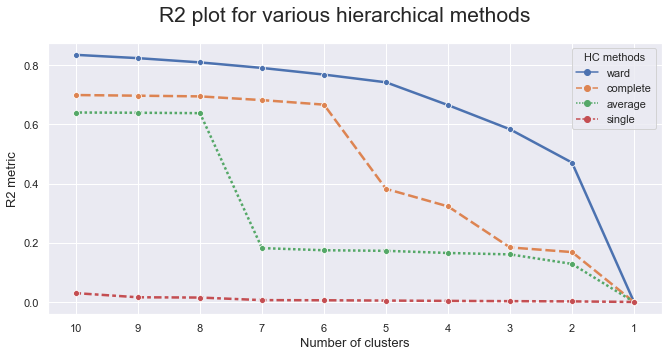

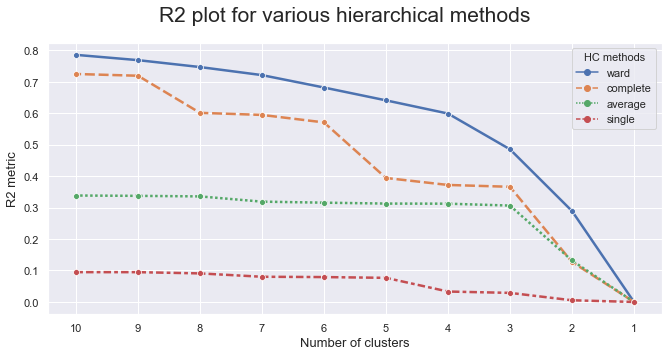

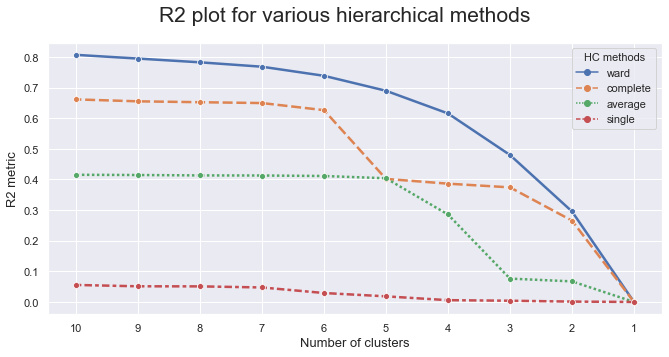

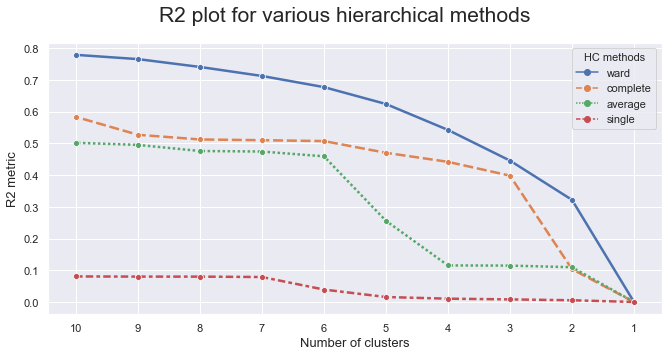

In [114]:
#For loop that plots the r2 metric for a hierarchical clustering solution for every 
#number of clusters within a range.
#This process is also repeated for every dataframe in a list of dataframes called df_range.
i=1
for df in df_range:
    metric_features_used = [x for x in metric_features if x in df]
    hc_methods=['ward', 'complete', 'average', 'single']
    max_nclus=10
    r2_hc_methods=np.vstack([get_r2_hc(df=df, link_method=link, max_nclus=max_nclus) for link in hc_methods]).T
    r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

    sns.set()
    fig = plt.figure(figsize=(11,5))
    sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)
    fig.suptitle(f"R2 plot for various hierarchical methods", fontsize=21)
    plt.gca().invert_xaxis()  # invert x axis
    plt.legend(title="HC methods", title_fontsize=11)
    plt.xticks(range(1, max_nclus + 1))
    plt.xlabel("Number of clusters", fontsize=13)
    plt.ylabel("R2 metric", fontsize=13)
    
    print(f"df{i} done!")
    i+=1

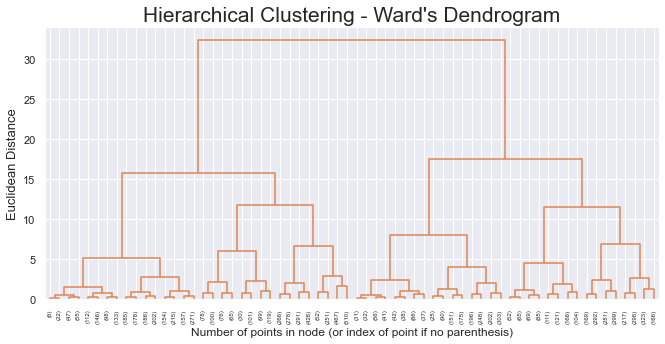

df1 done!


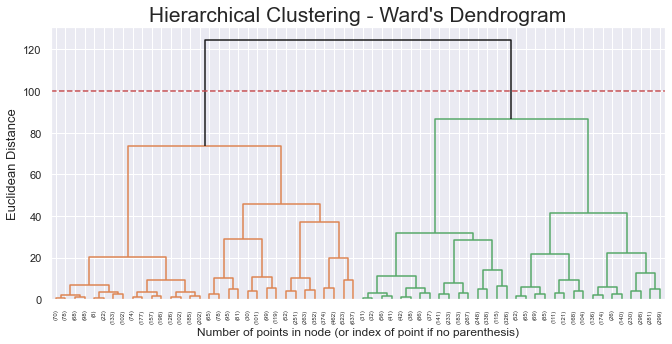

df2 done!


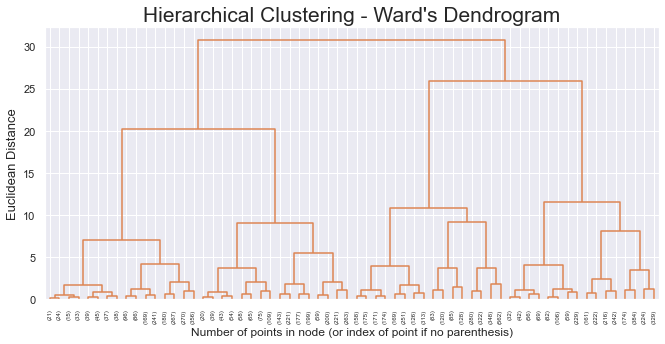

df3 done!


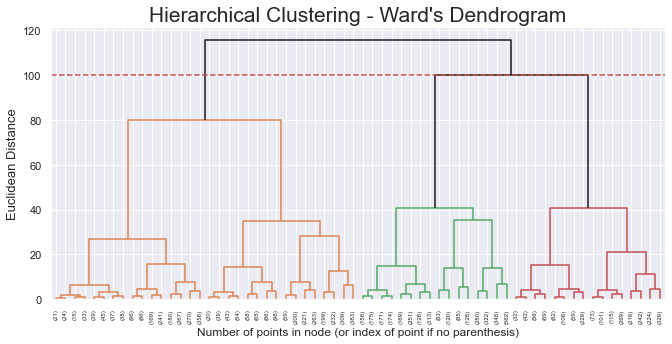

df4 done!


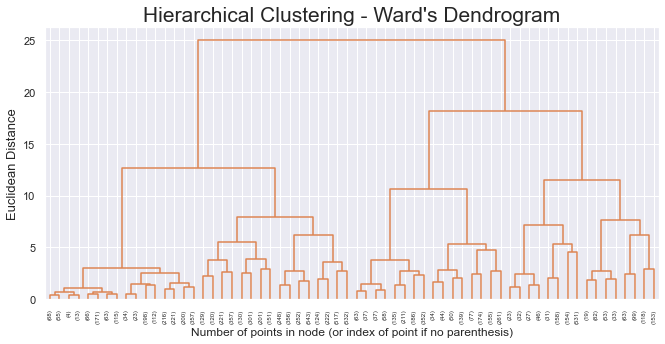

df5 done!


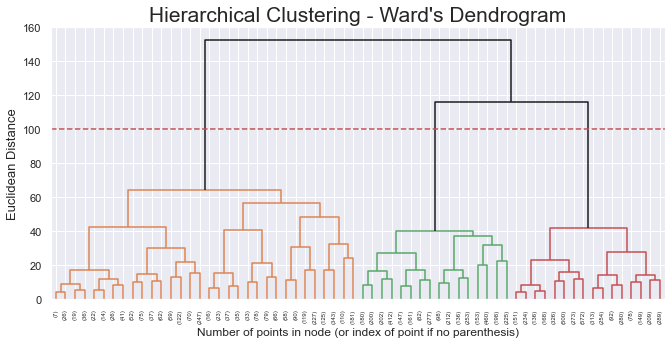

df6 done!


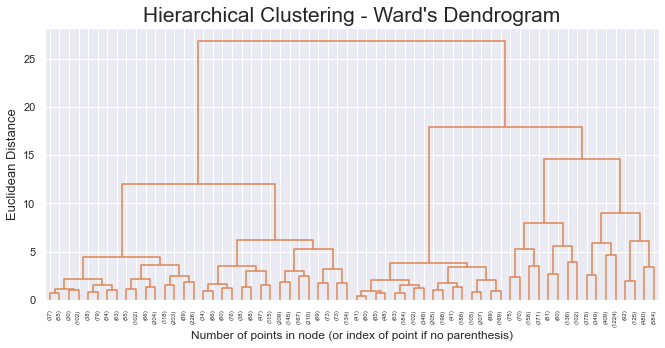

df7 done!


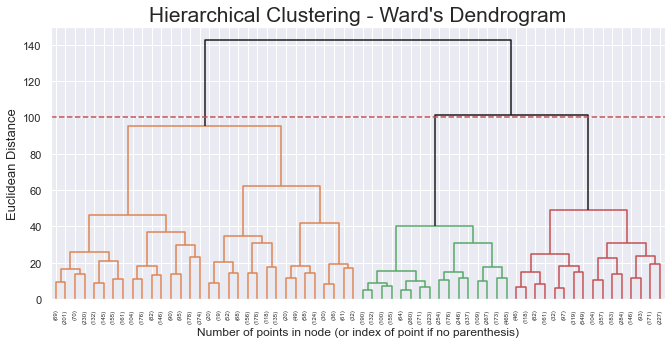

df8 done!


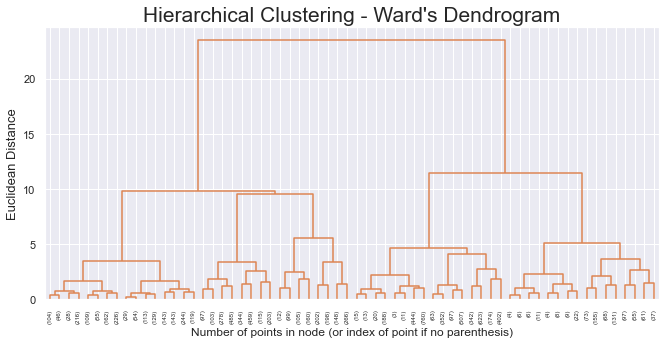

df9 done!


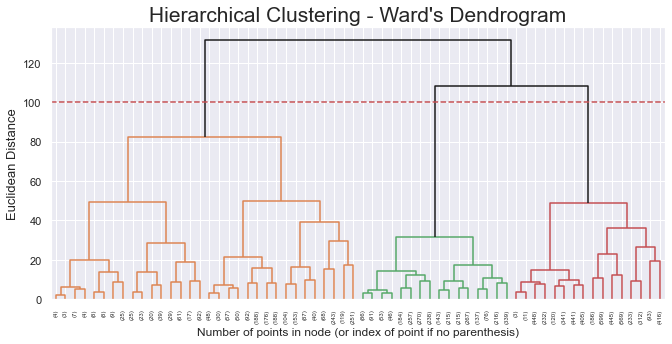

df10 done!


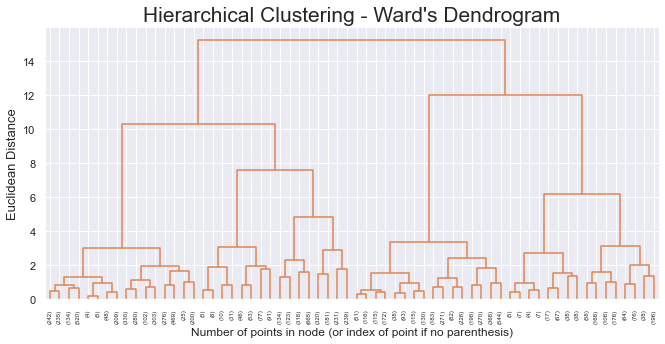

df11 done!


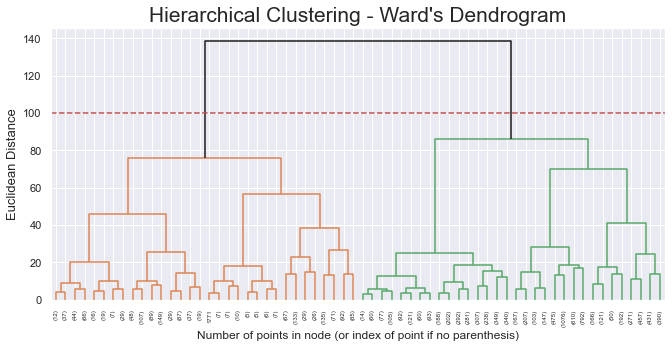

df12 done!


In [115]:
#For loop to plot a dendrogram for possible hierarchical clustering solutions for
#every dataframe in df_range.
n=1
for df in df_range:
    metric_features_used = [x for x in metric_features if x in df]
    hclust.fit_predict(df)
    # Adapted from:
    # https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

    # create the counts of samples under each node (number of points being merged)
    counts = np.zeros(hclust.children_.shape[0])
    n_samples = len(hclust.labels_)

    # hclust.children_ contains the observation ids that are being merged together
    # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
    for i, merge in enumerate(hclust.children_):
        # track the number of observations in the current cluster being formed
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                # If this is True, then we are merging an observation
                current_count += 1  # leaf node
            else:
                # Otherwise, we are merging a previously formed cluster
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    # the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
    # the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
    # the counts indicate the number of points being merged (dendrogram's x-axis)
    linkage_matrix = np.column_stack(
        [hclust.children_, hclust.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    sns.set()
    fig = plt.figure(figsize=(11,5))
    # The Dendrogram parameters need to be tuned
    y_threshold = 100
    dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel(f'{distance.title()} Distance', fontsize=13)
    plt.show()
    
    print(f"df{n} done!")
    n+=1

In [116]:
#After looking at the dendrogram graphs, we can see that the dataframes built with standard 
#scaling are much better defined than the ones built with minmax scaling, so from now on we decided to 
#keep going with only those dataframes, so here we define a new list of dataframes to use.
df_range_usable=[demo_df1_standard, demo_df2_standard, pack_df1_standard, pack_df2_standard, import_df1_standard, import_df2_standard]

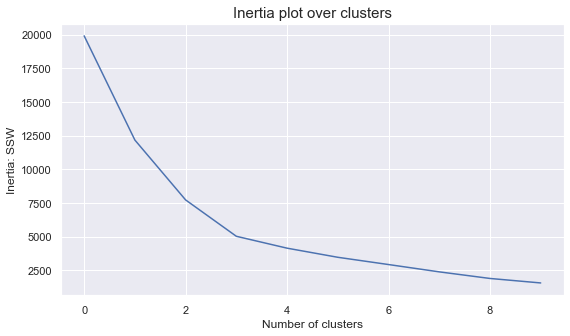

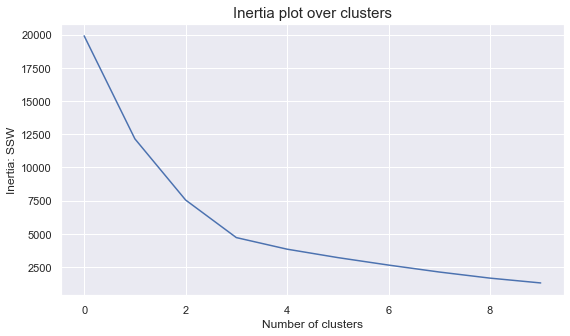

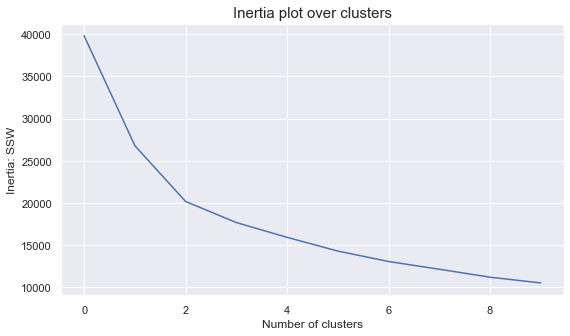

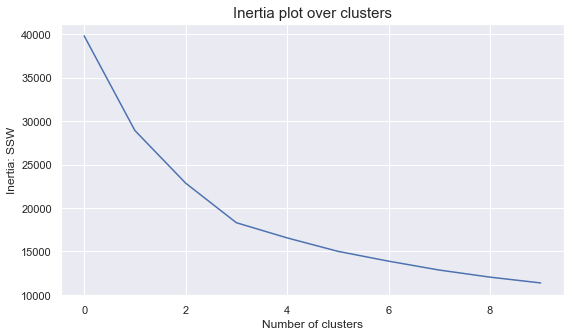

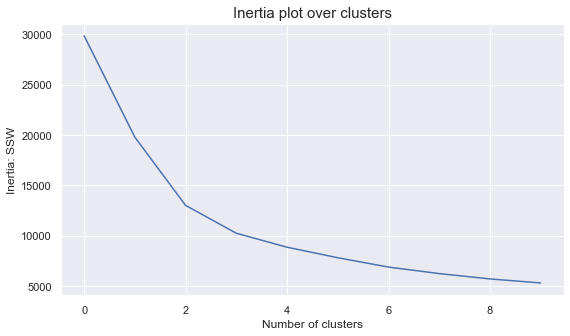

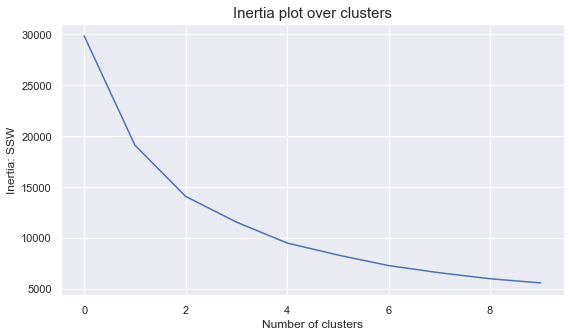

In [117]:
#For loop to plot inertia for KMeans clustering solutions for every number of cluster within 
#a range for every dataframe in the new list of dataframes.
for i in df_range_usable:
    inertia_plot(i)

For n_clusters = 2, the average silhouette_score is : 0.4005979901653605
For n_clusters = 3, the average silhouette_score is : 0.4133698595220726
For n_clusters = 4, the average silhouette_score is : 0.4714948966597956
For n_clusters = 5, the average silhouette_score is : 0.4838144898454973
For n_clusters = 6, the average silhouette_score is : 0.46457675397969866
For n_clusters = 7, the average silhouette_score is : 0.49840845539336714
For n_clusters = 8, the average silhouette_score is : 0.5229169085854944
For n_clusters = 9, the average silhouette_score is : 0.5275652597536463
For n_clusters = 10, the average silhouette_score is : 0.5487920870976681


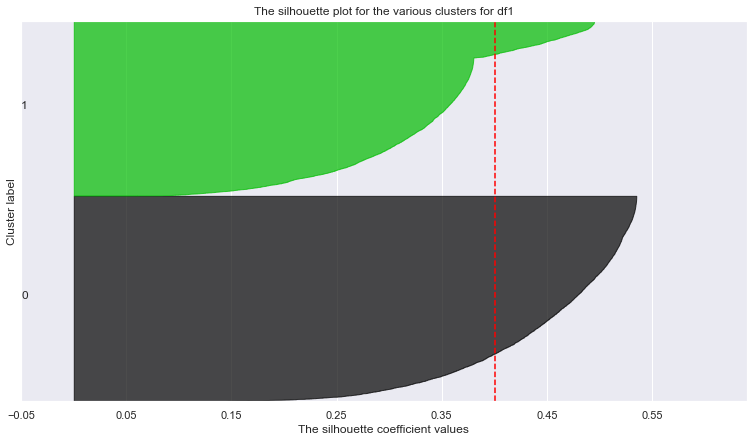

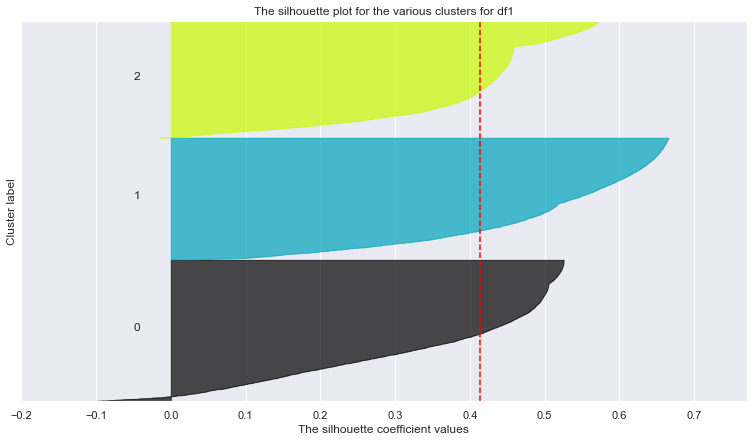

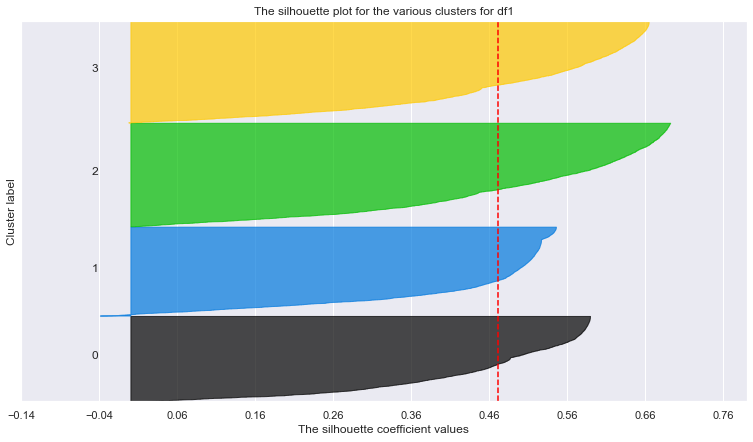

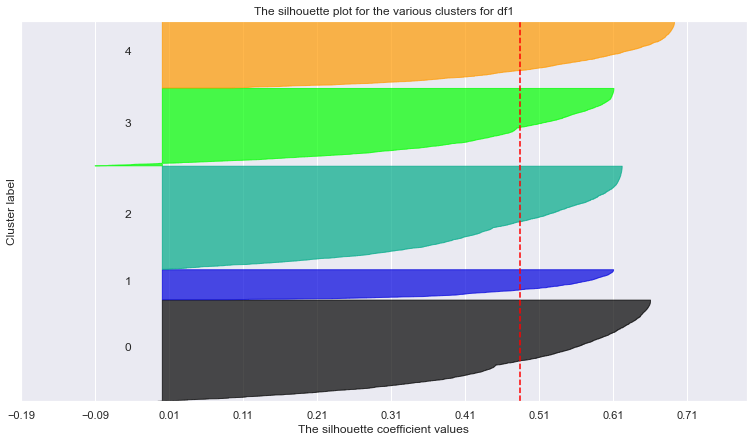

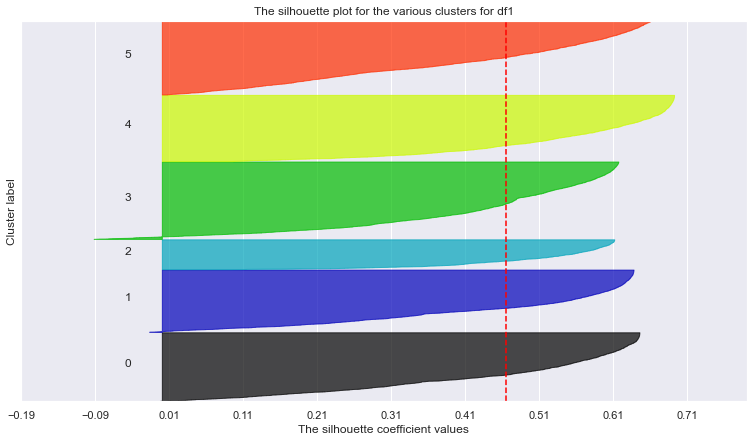

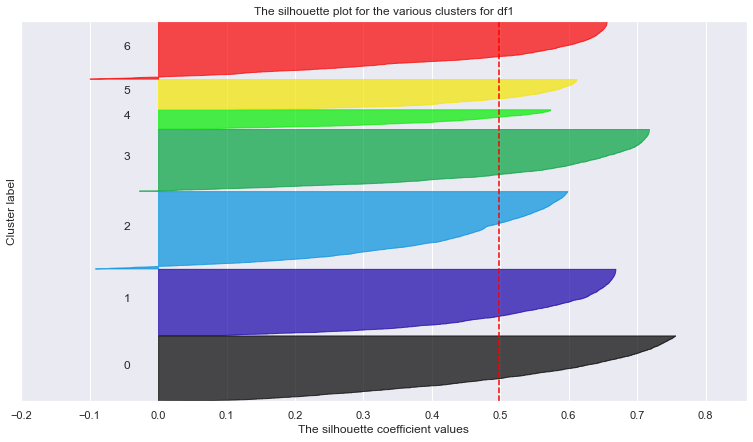

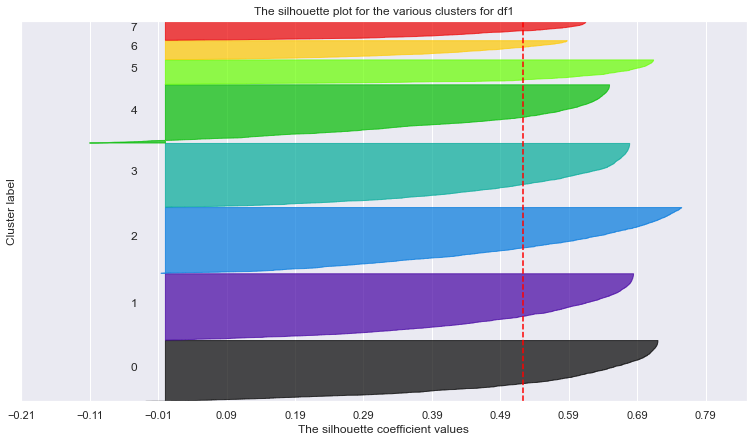

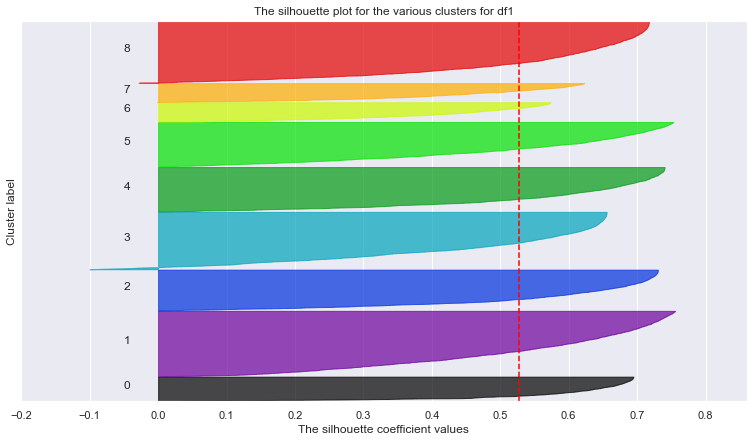

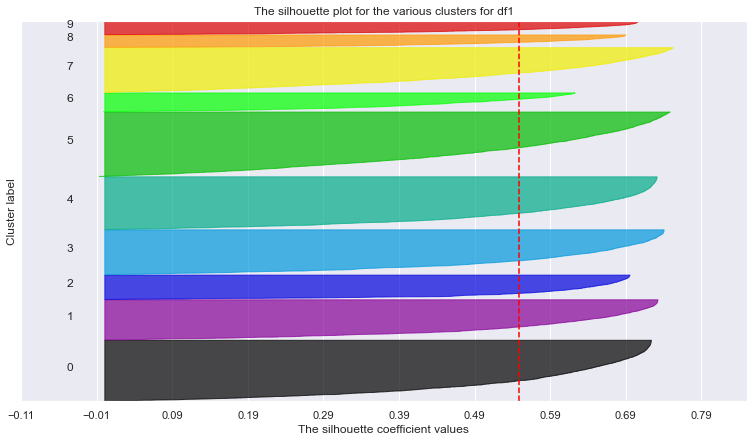

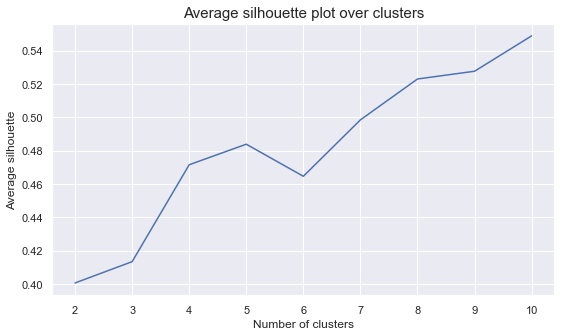

For n_clusters = 2, the average silhouette_score is : 0.3990597498122801
For n_clusters = 3, the average silhouette_score is : 0.42417939424694434
For n_clusters = 4, the average silhouette_score is : 0.49034721840346035
For n_clusters = 5, the average silhouette_score is : 0.5035507126990364
For n_clusters = 6, the average silhouette_score is : 0.48573344014996944
For n_clusters = 7, the average silhouette_score is : 0.5107657529374049
For n_clusters = 8, the average silhouette_score is : 0.5459320534877532
For n_clusters = 9, the average silhouette_score is : 0.5503143598843682
For n_clusters = 10, the average silhouette_score is : 0.5767757065531564


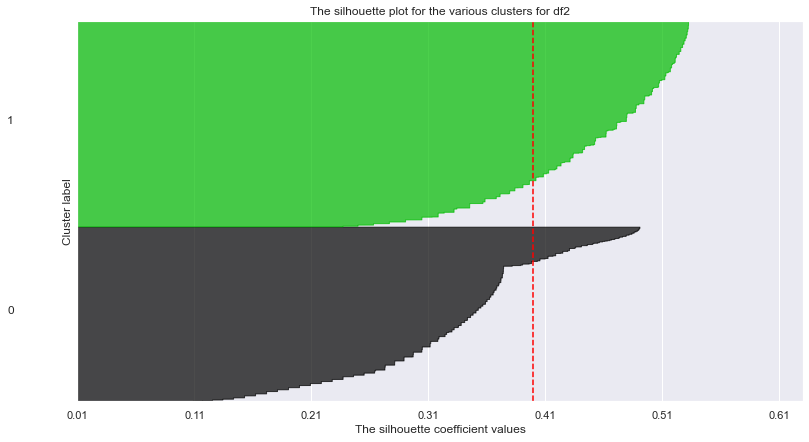

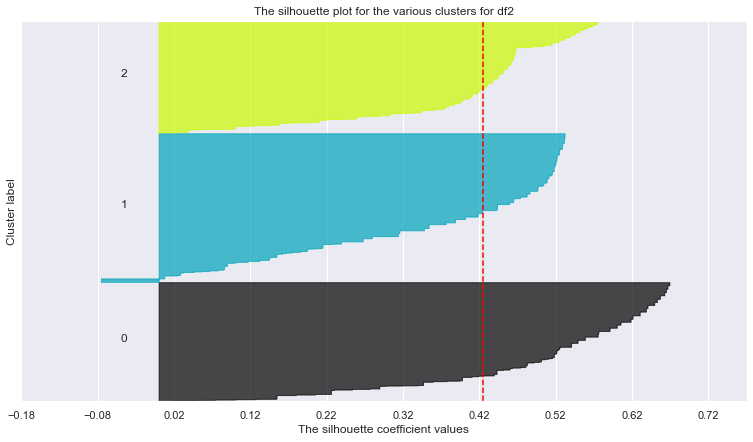

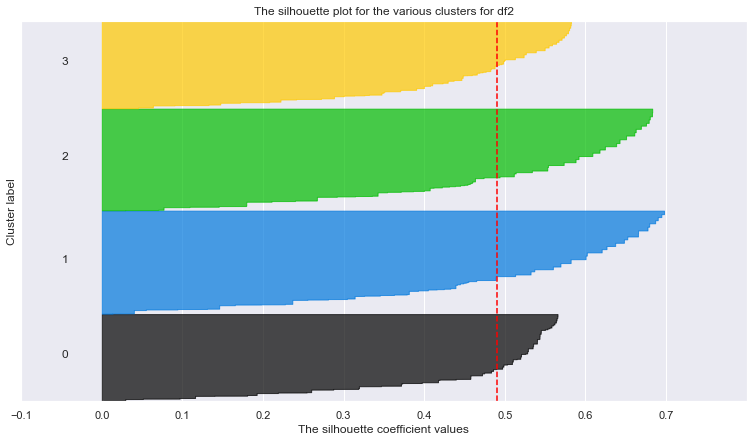

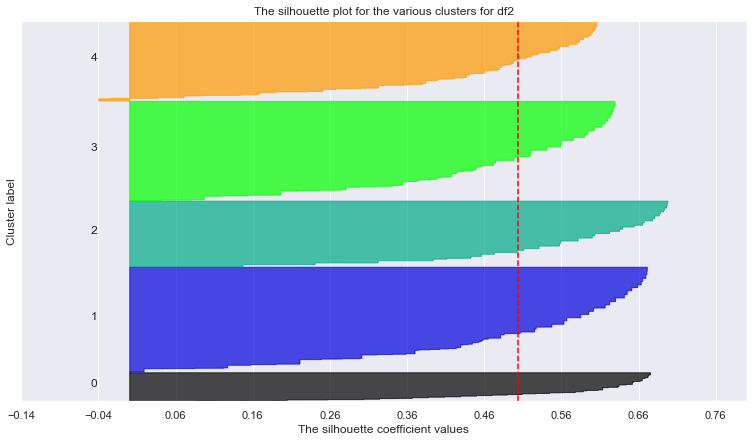

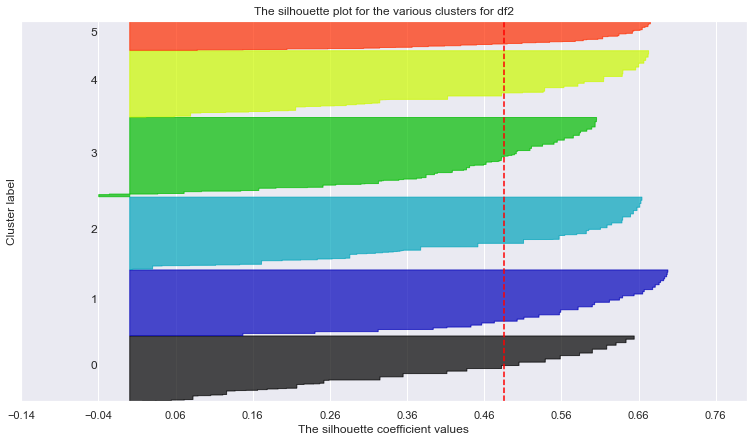

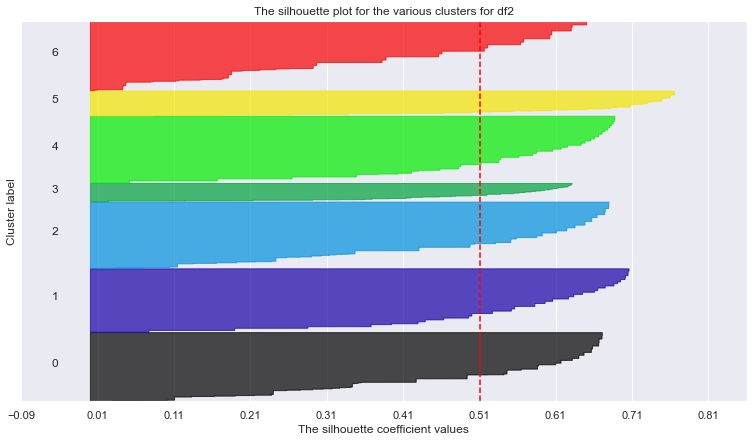

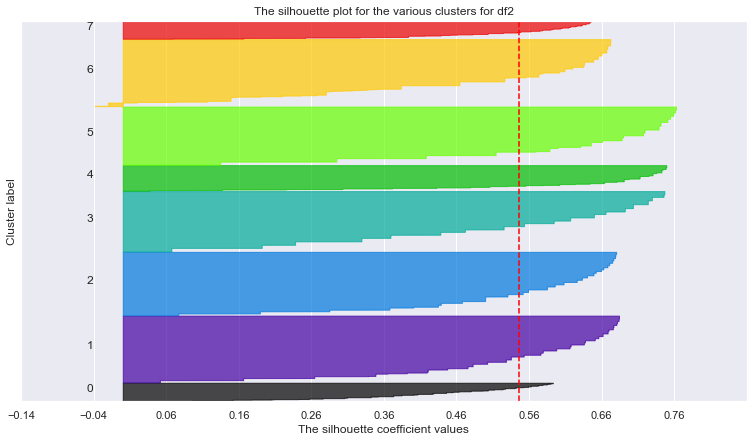

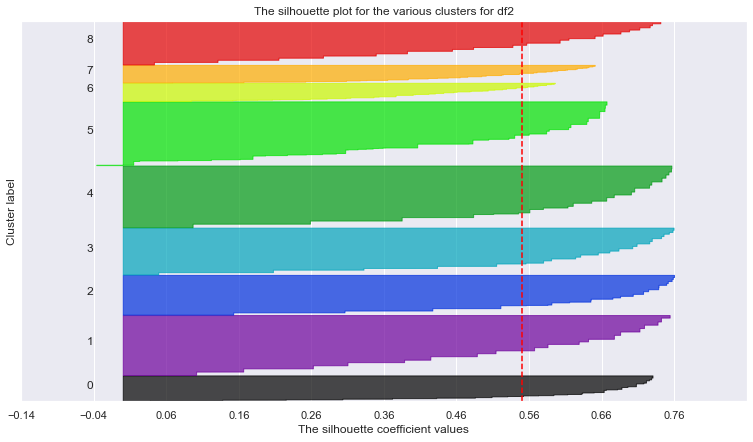

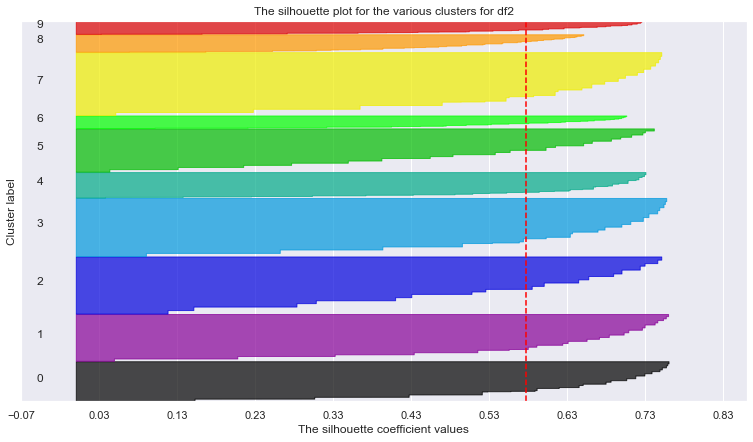

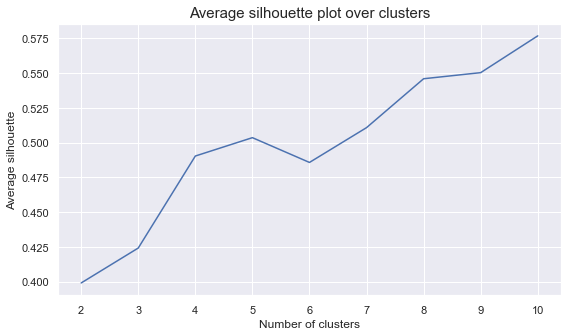

For n_clusters = 2, the average silhouette_score is : 0.38206726769369614
For n_clusters = 3, the average silhouette_score is : 0.31104484850826564
For n_clusters = 4, the average silhouette_score is : 0.31540505977023253
For n_clusters = 5, the average silhouette_score is : 0.31975719527270835
For n_clusters = 6, the average silhouette_score is : 0.24694061083821198
For n_clusters = 7, the average silhouette_score is : 0.2500937473058787
For n_clusters = 8, the average silhouette_score is : 0.2524180255688839
For n_clusters = 9, the average silhouette_score is : 0.2590307611793305
For n_clusters = 10, the average silhouette_score is : 0.259789390734532


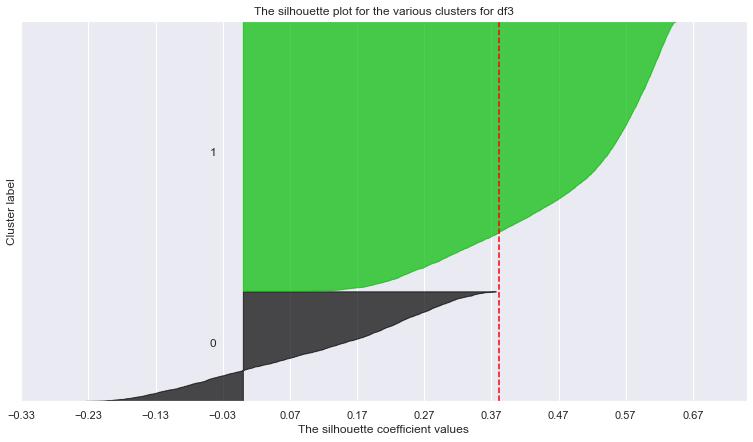

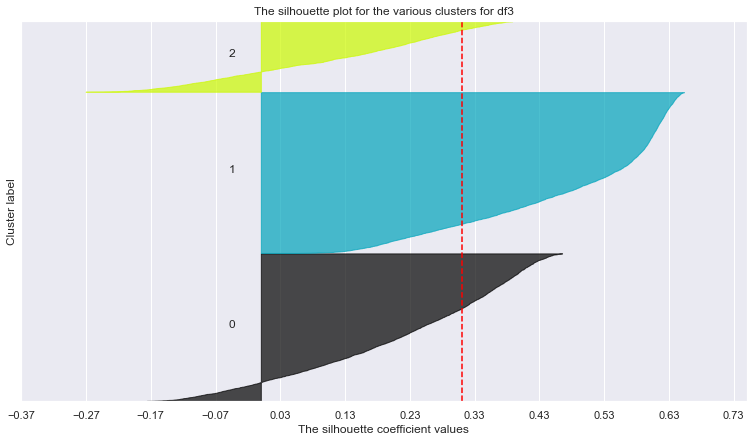

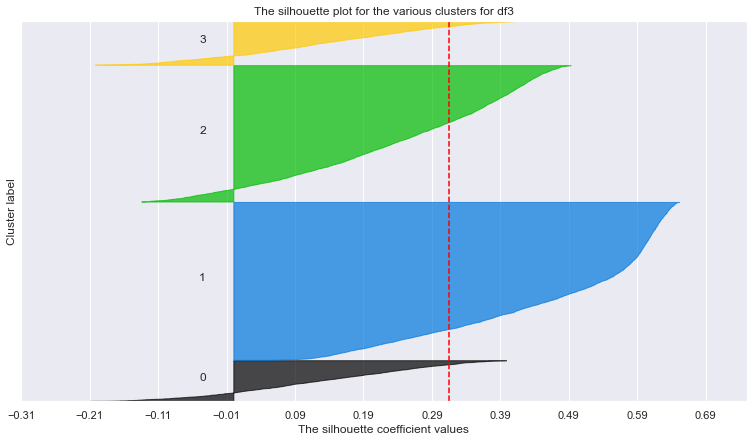

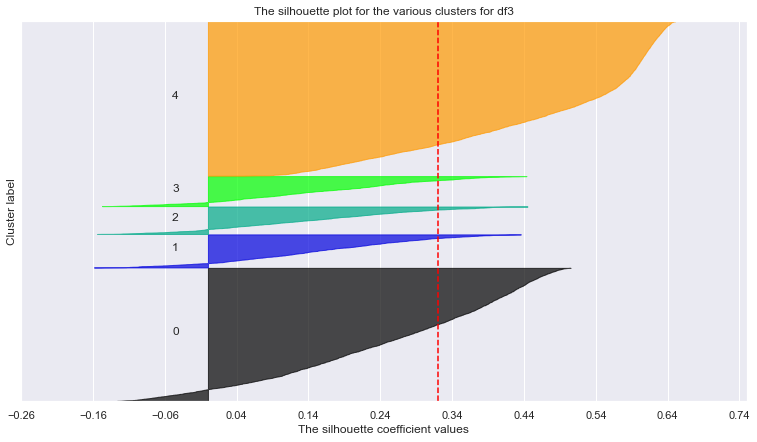

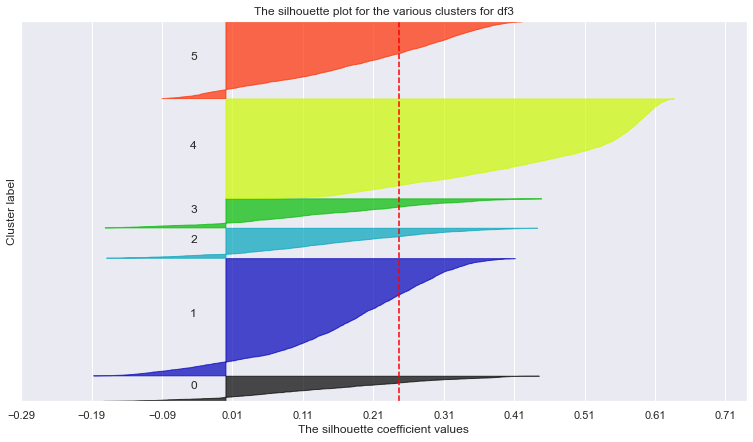

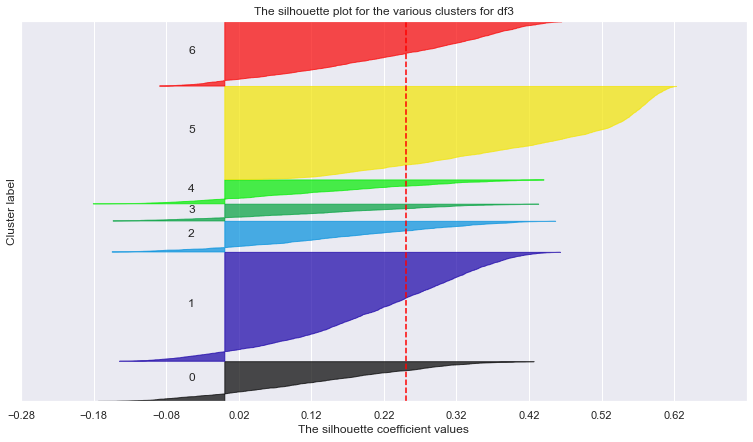

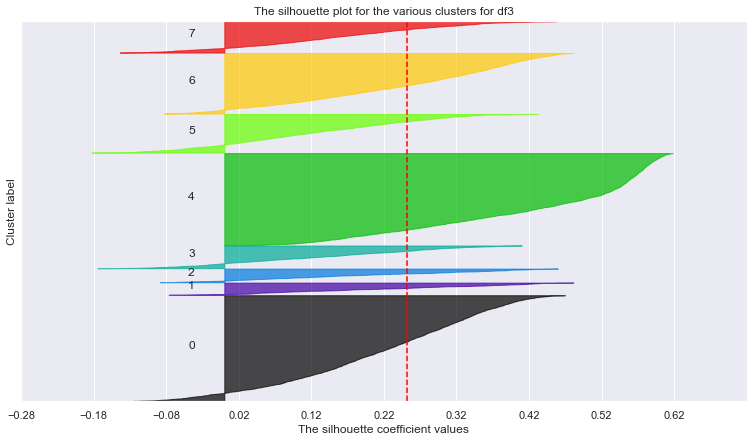

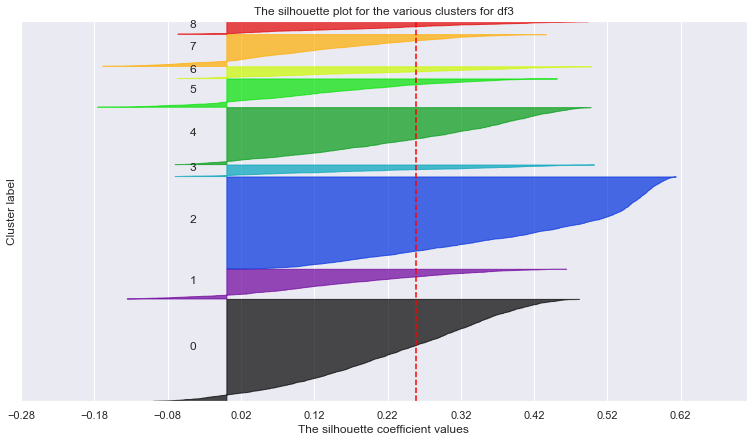

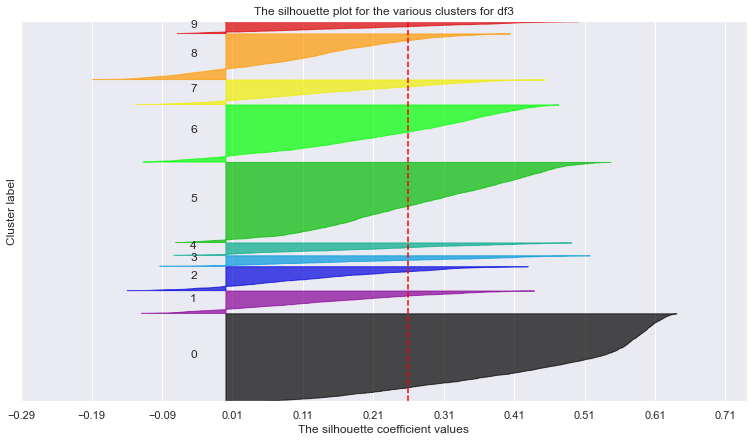

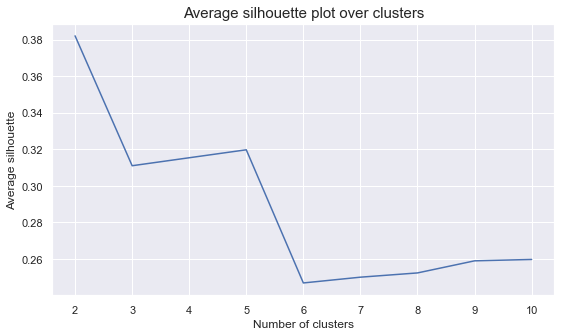

For n_clusters = 2, the average silhouette_score is : 0.31685153234585234
For n_clusters = 3, the average silhouette_score is : 0.2823377317198514
For n_clusters = 4, the average silhouette_score is : 0.29865177452105973
For n_clusters = 5, the average silhouette_score is : 0.3006649861876881
For n_clusters = 6, the average silhouette_score is : 0.2613662904024078
For n_clusters = 7, the average silhouette_score is : 0.2673707722144405
For n_clusters = 8, the average silhouette_score is : 0.23184064384671677
For n_clusters = 9, the average silhouette_score is : 0.23091934764836908
For n_clusters = 10, the average silhouette_score is : 0.2355473048676049


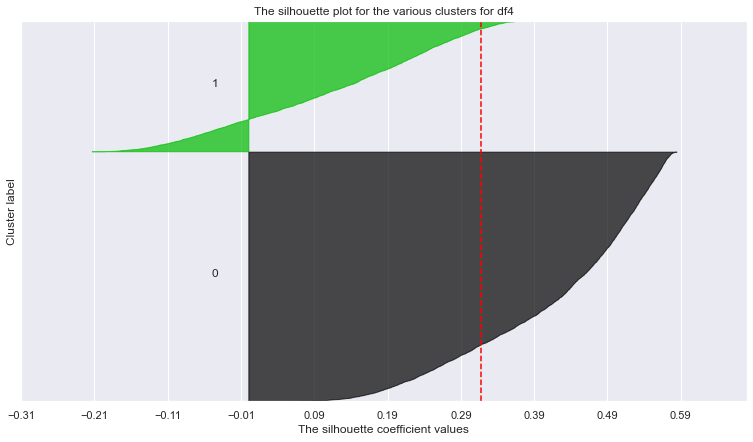

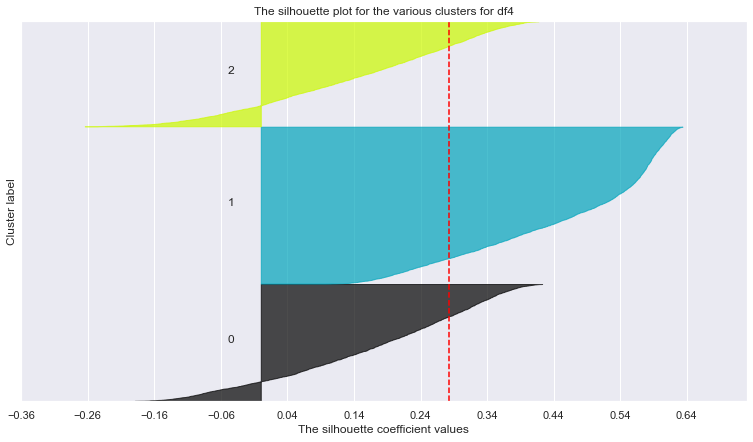

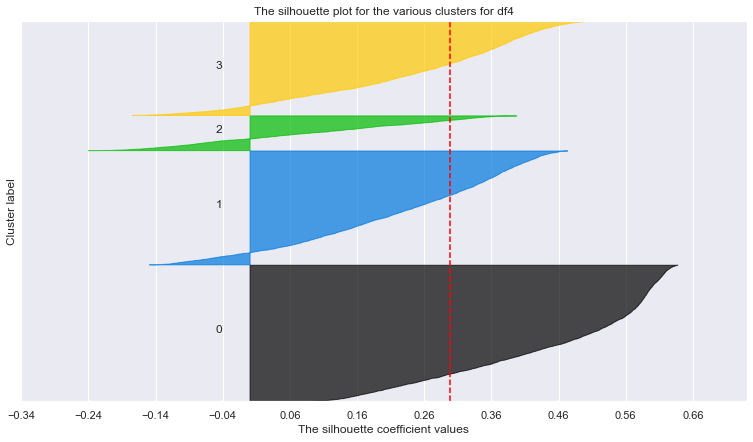

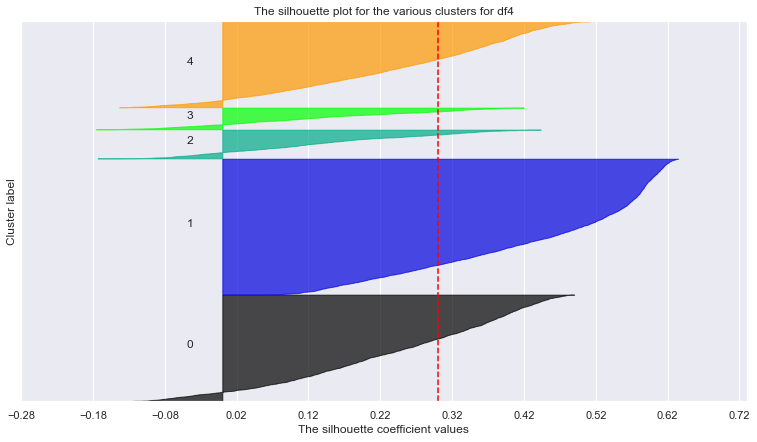

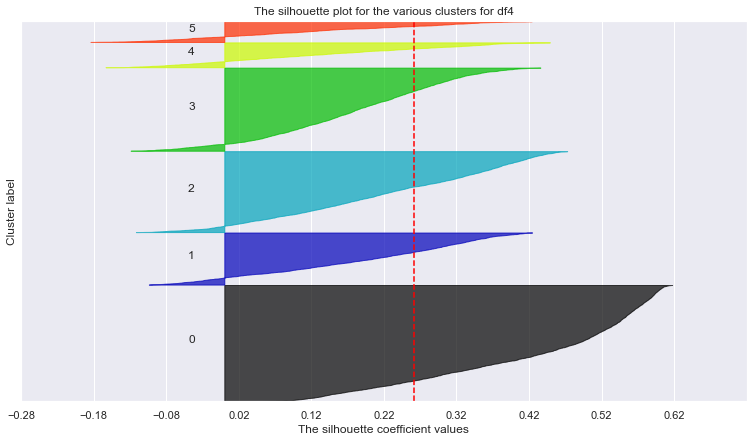

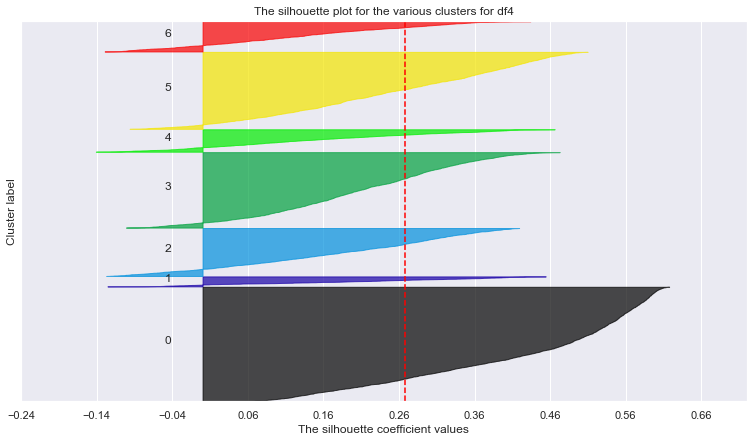

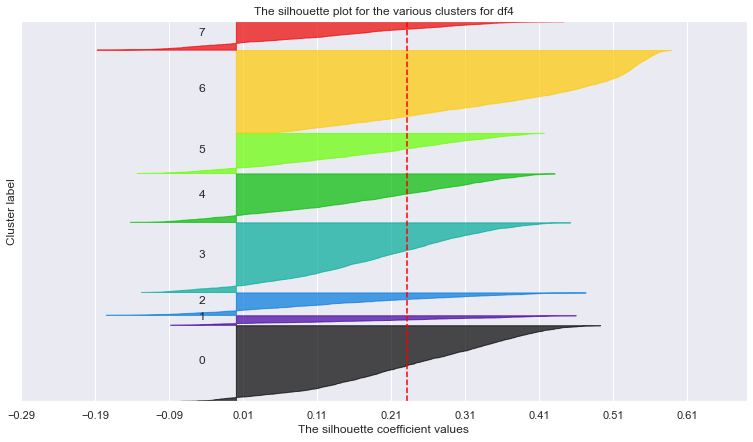

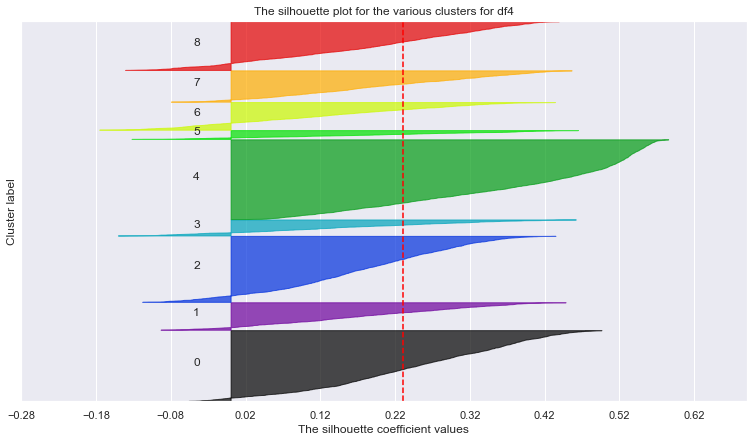

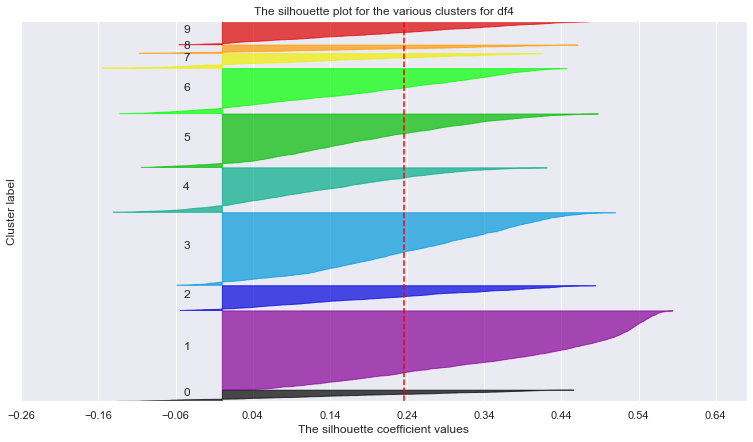

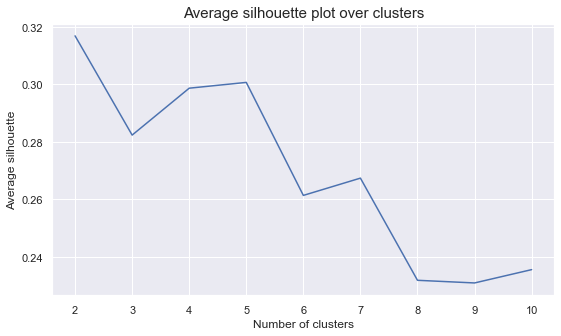

For n_clusters = 2, the average silhouette_score is : 0.4990463878344052
For n_clusters = 3, the average silhouette_score is : 0.4061087656489359
For n_clusters = 4, the average silhouette_score is : 0.4192062766432222
For n_clusters = 5, the average silhouette_score is : 0.40913401530984134
For n_clusters = 6, the average silhouette_score is : 0.3929352990764269
For n_clusters = 7, the average silhouette_score is : 0.36142994692787717
For n_clusters = 8, the average silhouette_score is : 0.36727635579938195
For n_clusters = 9, the average silhouette_score is : 0.3695826844109837
For n_clusters = 10, the average silhouette_score is : 0.34698036808038935


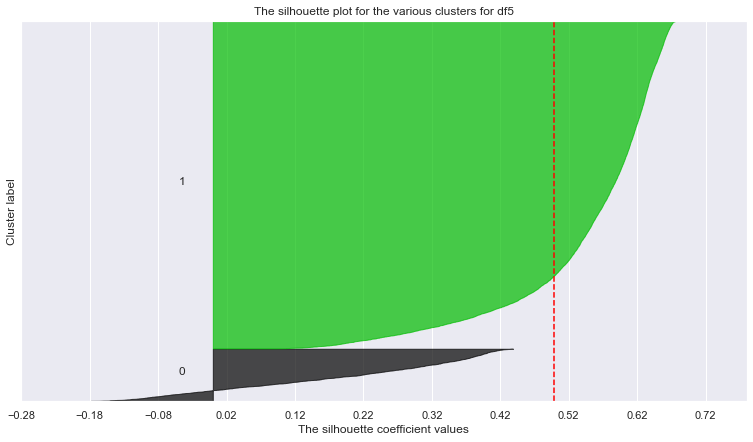

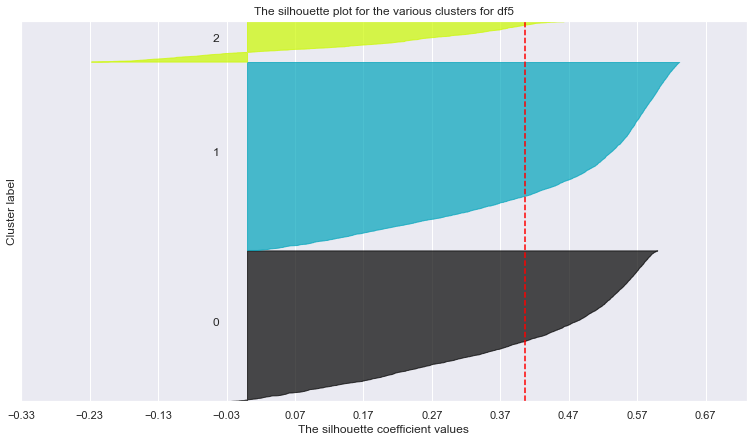

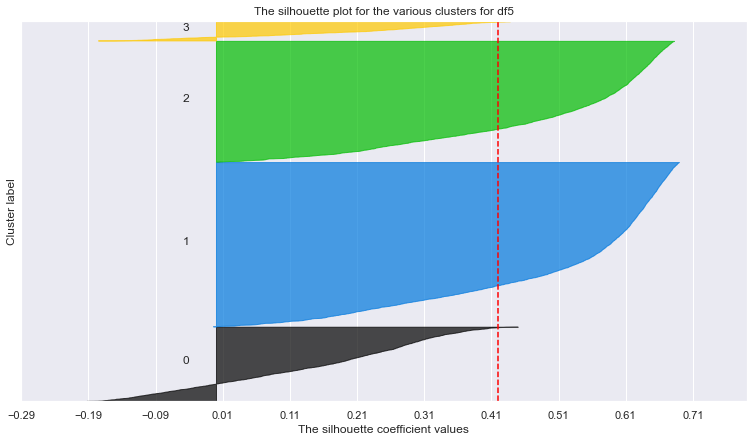

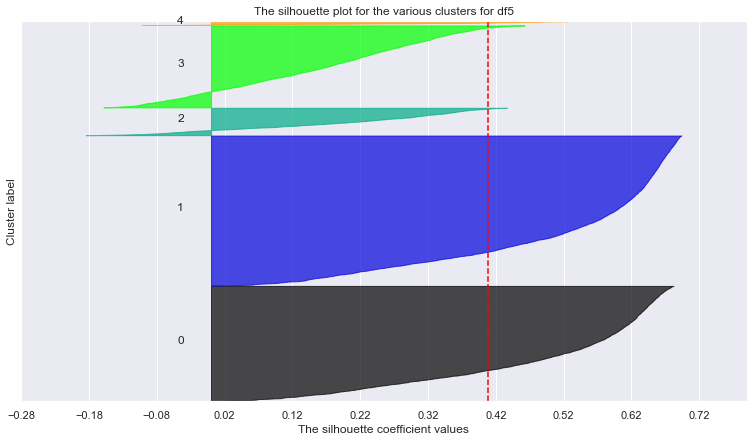

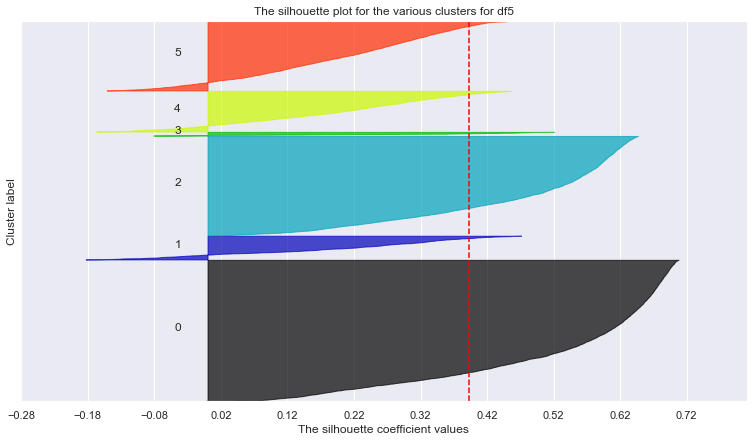

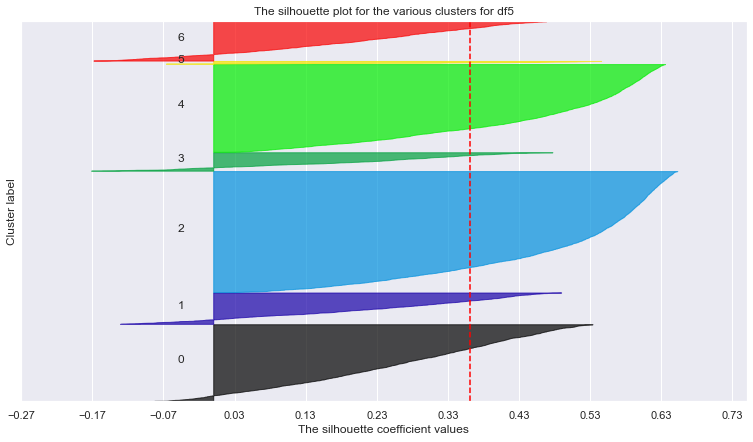

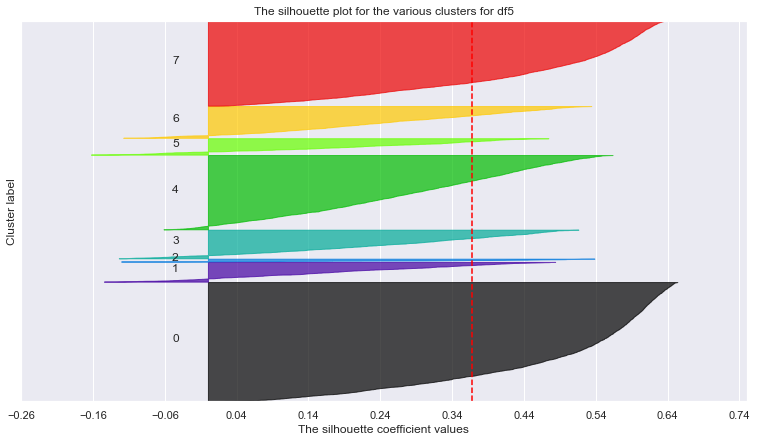

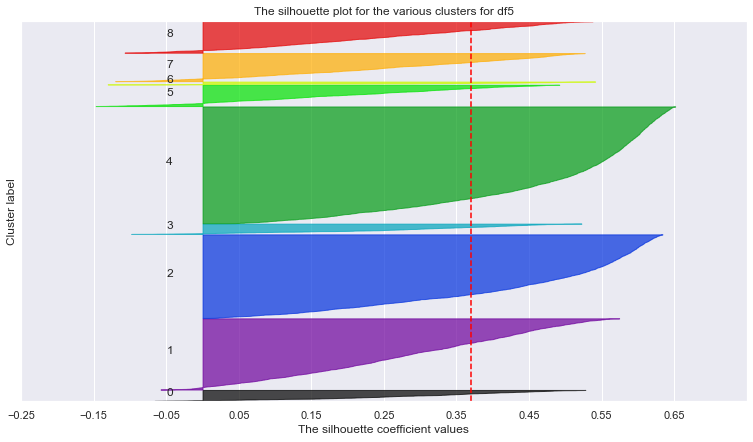

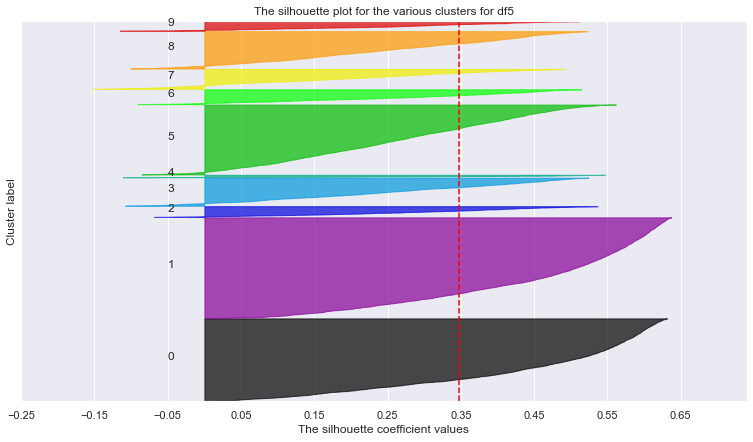

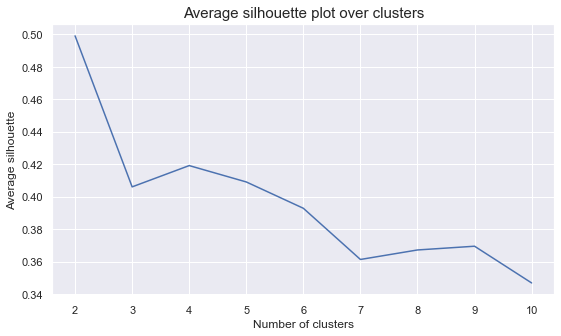

For n_clusters = 2, the average silhouette_score is : 0.5335303659792962
For n_clusters = 3, the average silhouette_score is : 0.36893092226536567
For n_clusters = 4, the average silhouette_score is : 0.3722969741633209
For n_clusters = 5, the average silhouette_score is : 0.39564503442766347
For n_clusters = 6, the average silhouette_score is : 0.389306353076125
For n_clusters = 7, the average silhouette_score is : 0.3827640623948452
For n_clusters = 8, the average silhouette_score is : 0.3675604937617425
For n_clusters = 9, the average silhouette_score is : 0.3613044829899338
For n_clusters = 10, the average silhouette_score is : 0.3445465314778742


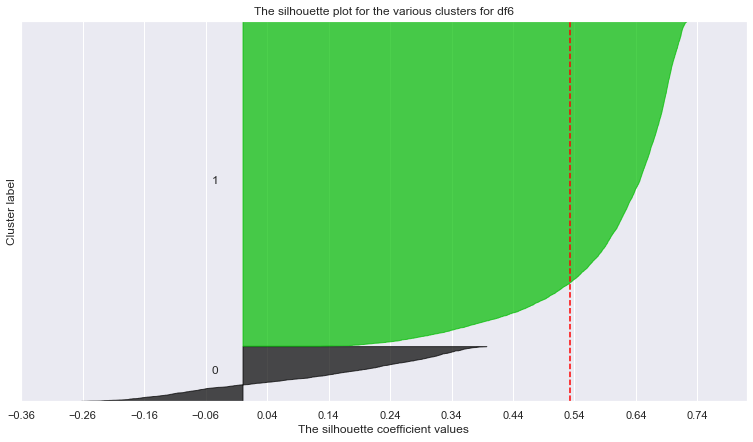

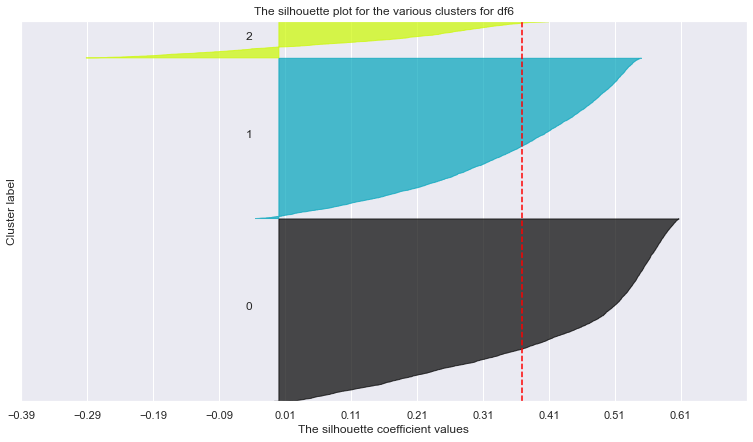

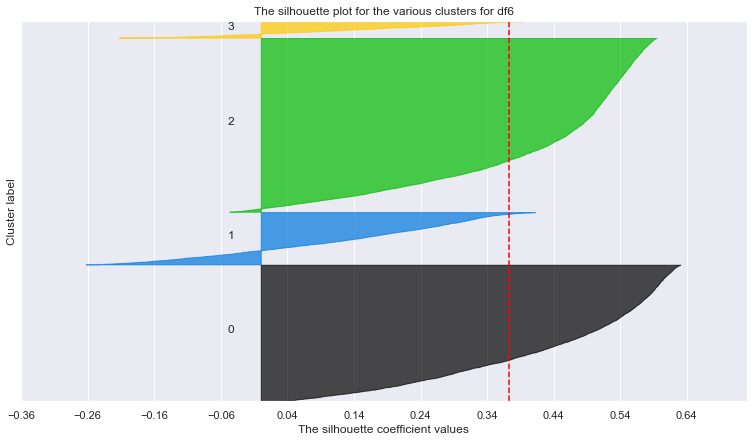

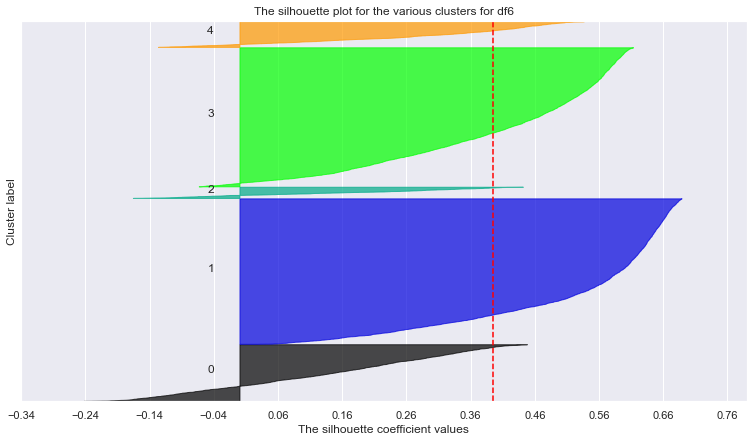

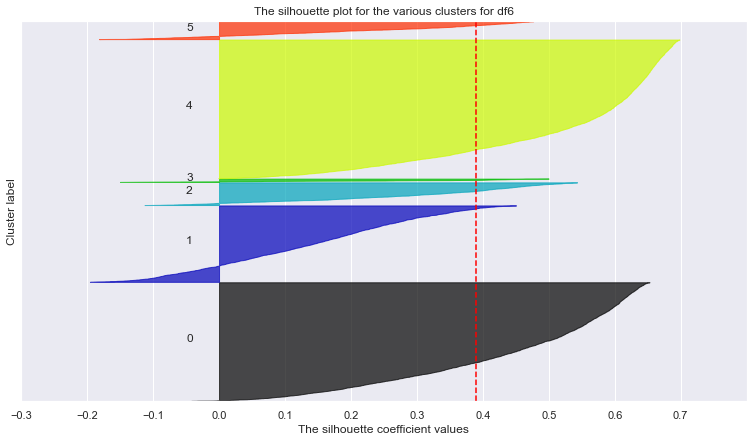

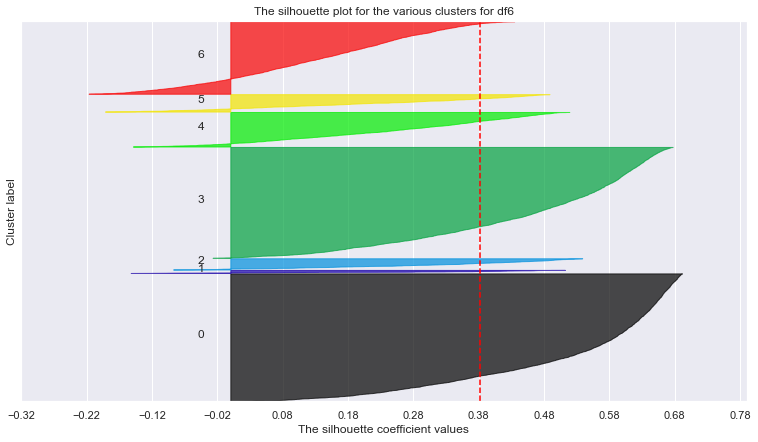

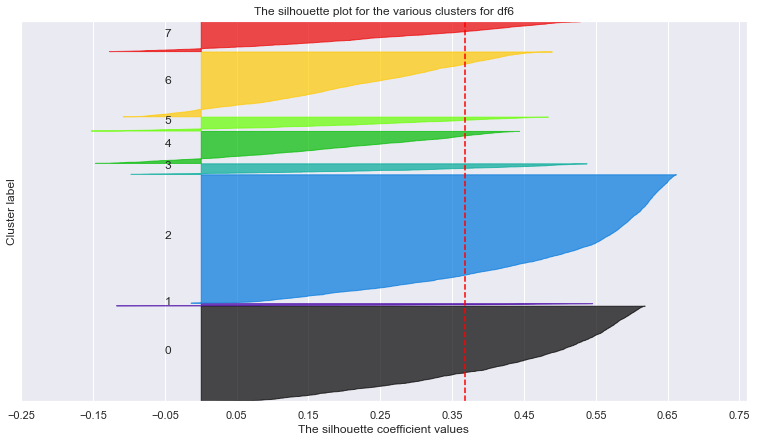

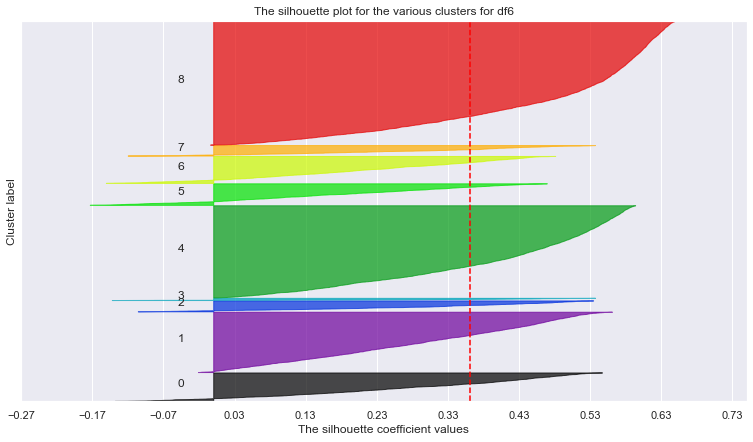

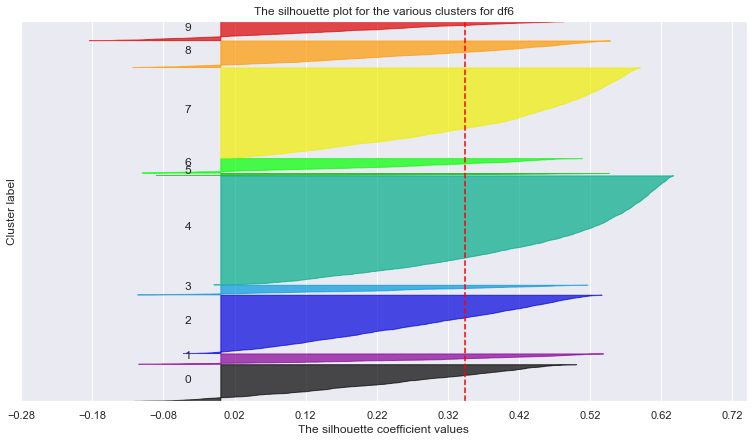

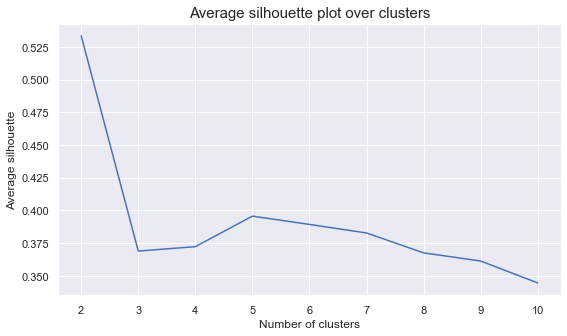

In [118]:
#Ploting the several silhoeutte scores for KMeans clustering solutions for every number 
#of cluster within a range for every dataframe in the new list of dataframes. 
n_iterator=1
for i in df_range_usable:
    silhouette_plot(i)
    n_iterator+=1

## 4.3 Fitting cluster algorithms and profiling the results

In [119]:
#Here we are fitting the hierarchical clustering algortihm(tunned according the R2 and dendrogram 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
hc3lust=AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=3)
hc3_labels=hc3lust.fit_predict(demo_df1_standard)
hc3_labels=pd.DataFrame(data=hc3_labels, index=demo_df1_standard.index, columns=['Labels'])
df_concat_hc_demo1=pd.concat([df4[cust_demographic], hc3_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 3
Number of columns in axes: 5
Number of unique cluster labels: 3
Number of features: 5
Number of rows in df: 9955


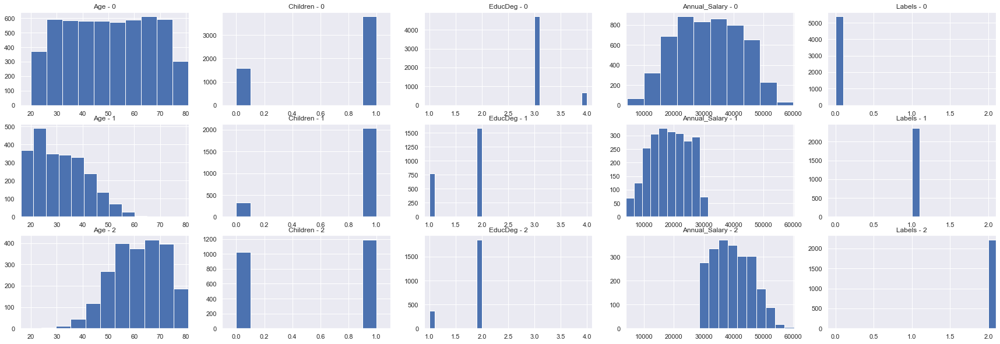

In [120]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_hc_demo1, hc3_labels)

In [121]:
#Here we are fitting the hierarchical clustering algortihm(tunned according the R2 and dendrogram 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
hc3lust=AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=3)
hc3_labels=hc3lust.fit_predict(demo_df2_standard)
hc3_labels=pd.DataFrame(data=hc3_labels, index=demo_df2_standard.index, columns=['Labels'])
df_concat_hc_demo2=pd.concat([df4[cust_demographic], hc3_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 3
Number of columns in axes: 5
Number of unique cluster labels: 3
Number of features: 5
Number of rows in df: 9955


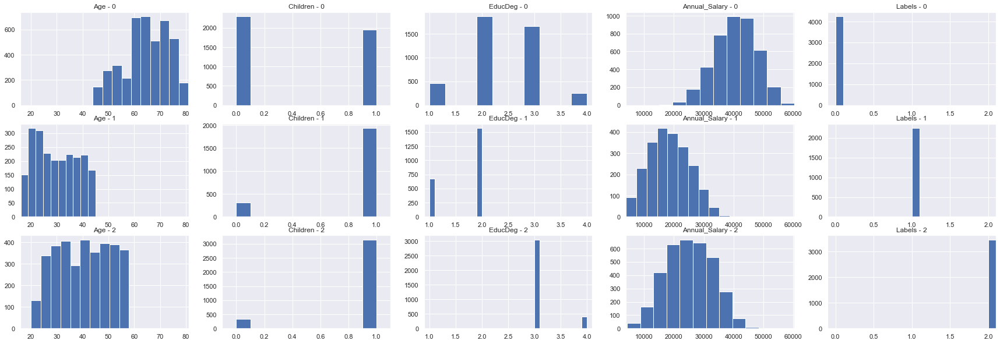

In [122]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_hc_demo2, hc3_labels)

In [123]:
#Here we are fitting the hierarchical clustering algortihm(tunned according the R2 and dendrogram 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
hc3lust=AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=3)
hc3_labels=hc3lust.fit_predict(pack_df1_standard)
hc3_labels=pd.DataFrame(data=hc3_labels, index=pack_df1_standard.index, columns=['Labels'])
df_concat_hc_pack1=pd.concat([df4[insur_package], hc3_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 3
Number of columns in axes: 6
Number of unique cluster labels: 3
Number of features: 6
Number of rows in df: 9955


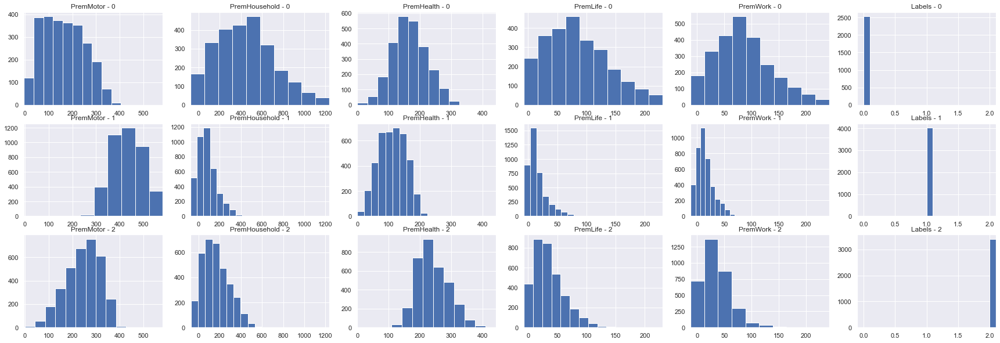

In [124]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_hc_pack1, hc3_labels)

In [125]:
#Creating a scaled version of the concatenated dataframes that were chosen to pass on to the groupby
#phase, so the centroids of each cluster assume a scaled value, and so, are able to be fit to 
#a clustering algorithm.
df_concat_hc_pack1_scaled=pd.concat([pack_df1_standard, hc3_labels], join='inner', ignore_index=False, axis=1)

In [126]:
#Here we are fitting the hierarchical clustering algortihm(tunned according the R2 and dendrogram 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
hc4lust=AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=4)
hc4_labels=hc4lust.fit_predict(pack_df2_standard)
hc4_labels=pd.DataFrame(data=hc4_labels, index=pack_df2_standard.index, columns=['Labels'])
df_concat_hc_pack2=pd.concat([df4[insur_package_ratio], hc4_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 4
Number of columns in axes: 6
Number of unique cluster labels: 4
Number of features: 6
Number of rows in df: 9955


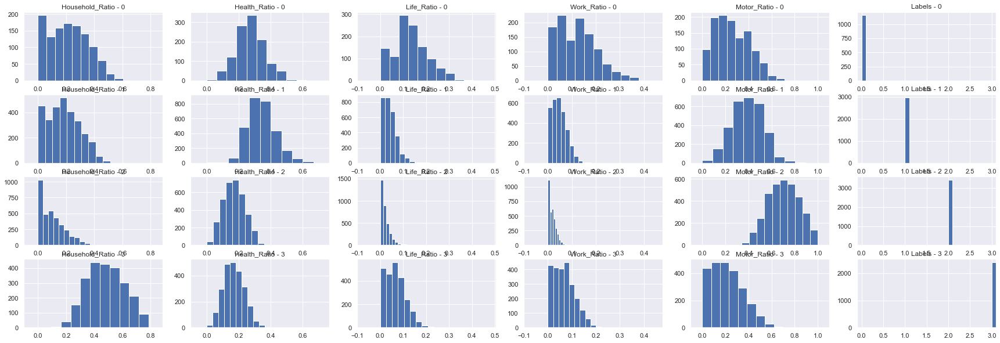

In [127]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_hc_pack2, hc4_labels)

In [128]:
#Here we are fitting the hierarchical clustering algortihm(tunned according the R2 and dendrogram 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
hc3lust=AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=3)
hc3_labels=hc3lust.fit_predict(import_df1_standard)
hc3_labels=pd.DataFrame(data=hc3_labels, index=import_df1_standard.index, columns=['Labels'])
df_concat_hc_import1=pd.concat([df4[cust_importance], hc3_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 3
Number of columns in axes: 6
Number of unique cluster labels: 3
Number of features: 6
Number of rows in df: 9955


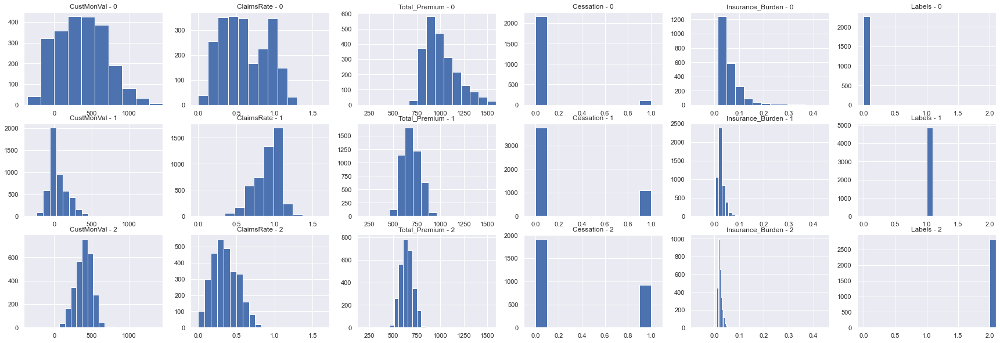

In [129]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_hc_import1, hc3_labels)

In [130]:
#Creating a scaled version of the concatenated dataframes that were chosen to pass on to the groupby
#phase, so the centroids of each cluster assume a scaled value, and so, are able to be fit to 
#a clustering algorithm.
df_concat_hc_import1_scaled=pd.concat([import_df1_standard, hc3_labels], join='inner', ignore_index=False, axis=1)

In [131]:
#Here we are fitting the hierarchical clustering algortihm(tunned according the R2 and dendrogram 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
hc2lust=AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=2)
hc2_labels=hc2lust.fit_predict(import_df2_standard)
hc2_labels=pd.DataFrame(data=hc2_labels, index=import_df2_standard.index, columns=['Labels'])
df_concat_hc_import2=pd.concat([df4[cust_importance], hc2_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 2
Number of columns in axes: 6
Number of unique cluster labels: 2
Number of features: 6
Number of rows in df: 9955


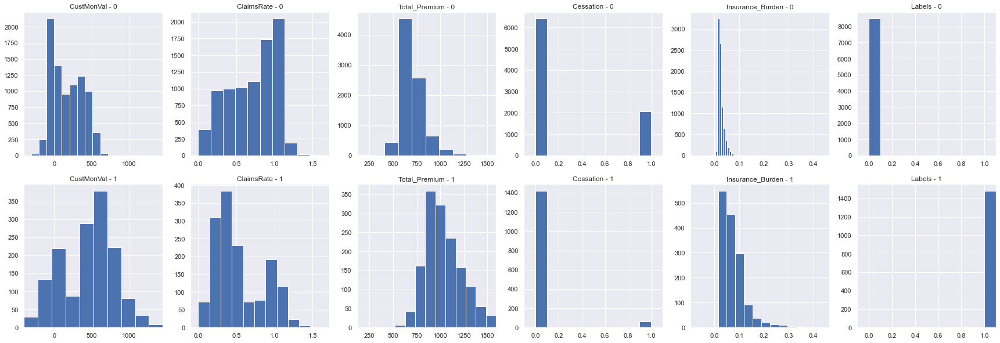

In [132]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_hc_import2, hc2_labels)

In [133]:
#Here we are fitting the KMeans clustering algortihm(tunned according the inertia and silhouette 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
kmclust3=KMeans(n_clusters=3, init='k-means++', n_init=15, random_state=1)
km3_labels=kmclust3.fit_predict(demo_df1_standard)
km3_labels=pd.DataFrame(data=km3_labels, index=demo_df1_standard.index, columns=['Labels'])
df_concat_km_demo1=pd.concat([df4[cust_demographic], km3_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 3
Number of columns in axes: 5
Number of unique cluster labels: 3
Number of features: 5
Number of rows in df: 9955


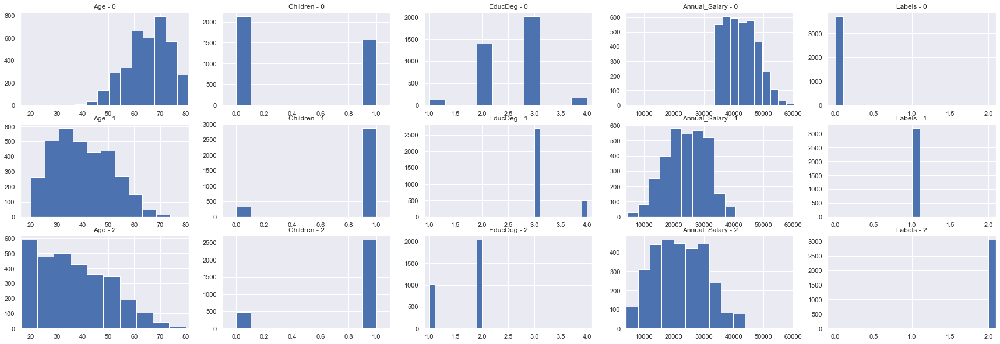

In [134]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_km_demo1, km3_labels)

In [135]:
#Creating a scaled version of the concatenated dataframes that were chosen to pass on to the groupby
#phase, so the centroids of each cluster assume a scaled value, and so, are able to be fit to 
#a clustering algorithm.
df_concat_km_demo1_scaled=pd.concat([demo_df1_standard, km3_labels], join='inner', ignore_index=False, axis=1)

In [136]:
#Here we are fitting the KMeans clustering algortihm(tunned according the inertia and silhouette 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
kmclust3=KMeans(n_clusters=3, init='k-means++', n_init=15, random_state=1)
km3_labels=kmclust3.fit_predict(demo_df2_standard)
km3_labels=pd.DataFrame(data=km3_labels, index=demo_df2_standard.index, columns=['Labels'])
df_concat_km_demo2=pd.concat([df4[cust_demographic], km3_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 3
Number of columns in axes: 5
Number of unique cluster labels: 3
Number of features: 5
Number of rows in df: 9955


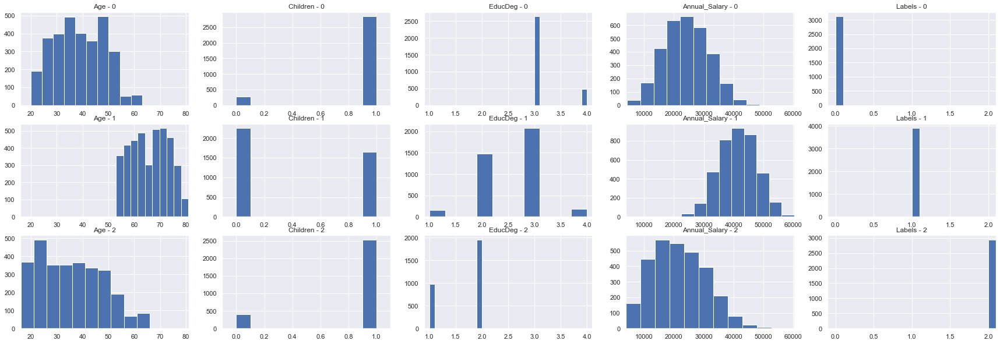

In [137]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_km_demo2, km3_labels)

In [138]:
#Here we are fitting the KMeans clustering algortihm(tunned according the inertia and silhouette 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
kmclust4=KMeans(n_clusters=4, init='k-means++', n_init=15, random_state=1)
km4_labels=kmclust4.fit_predict(pack_df1_standard)
km4_labels=pd.DataFrame(data=km4_labels, index=pack_df1_standard.index, columns=['Labels'])
df_concat_km_pack1=pd.concat([df4[insur_package], km4_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 4
Number of columns in axes: 6
Number of unique cluster labels: 4
Number of features: 6
Number of rows in df: 9955


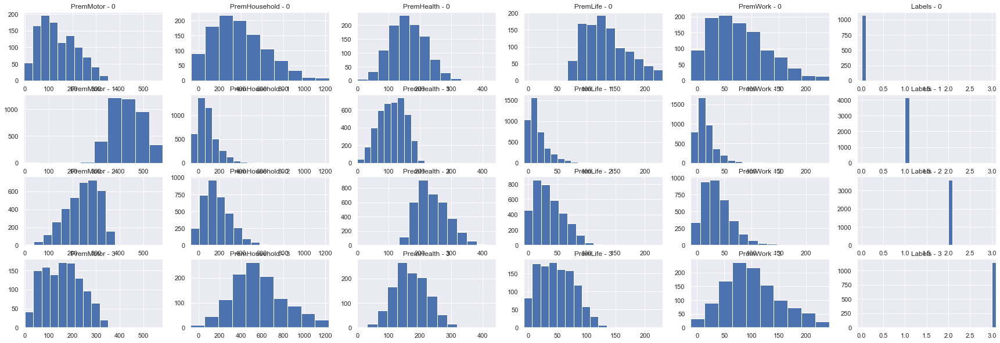

In [139]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_km_pack1, km4_labels)

In [140]:
#Here we are fitting the KMeans clustering algortihm(tunned according the inertia and silhouette 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
kmclust6=KMeans(n_clusters=6, init='k-means++', n_init=15, random_state=1)
km6_labels=kmclust6.fit_predict(pack_df2_standard)
km6_labels=pd.DataFrame(data=km6_labels, index=pack_df2_standard.index, columns=['Labels'])
df_concat_km_pack2=pd.concat([df4[insur_package_ratio], km6_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 6
Number of columns in axes: 6
Number of unique cluster labels: 6
Number of features: 6
Number of rows in df: 9955


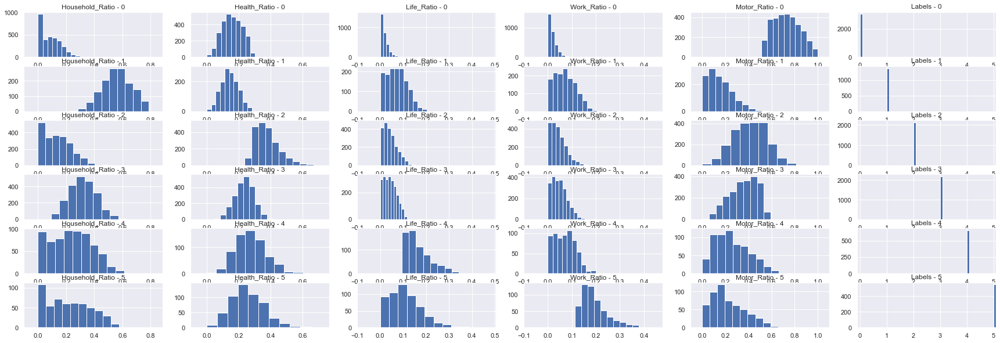

In [141]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_km_pack2, km6_labels)

In [142]:
#Here we are fitting the KMeans clustering algortihm(tunned according the inertia and silhouette 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
kmclust3=KMeans(n_clusters=3, init='k-means++', n_init=15, random_state=1)
km3_labels=kmclust3.fit_predict(import_df1_standard)
km3_labels=pd.DataFrame(data=km3_labels, index=import_df1_standard.index, columns=['Labels'])
df_concat_km_import1=pd.concat([df4[cust_importance], km3_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 3
Number of columns in axes: 6
Number of unique cluster labels: 3
Number of features: 6
Number of rows in df: 9955


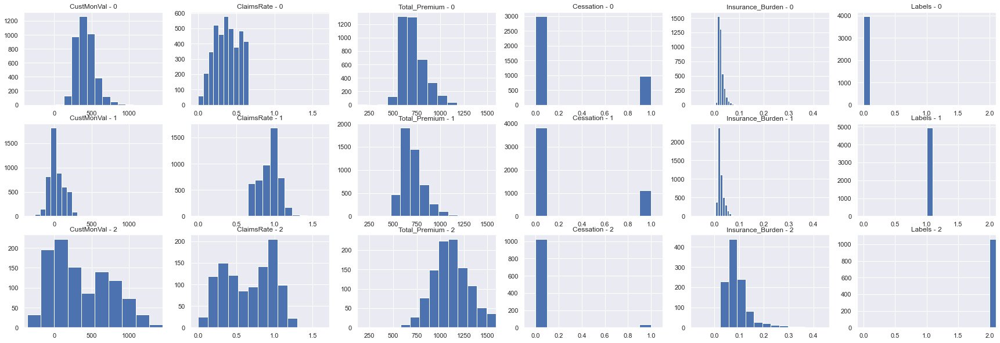

In [143]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_km_import1, km3_labels)

In [144]:
#Here we are fitting the KMeans clustering algortihm(tunned according the inertia and silhouette 
#plots) to one of the dataframes in the new list of dataframes. Then we join the labels obtained from
#from predicting the cluster labels with that clustering algorithm with the unscaled data for every 
#data point.
kmclust3=KMeans(n_clusters=3, init='k-means++', n_init=15, random_state=1)
km3_labels=kmclust3.fit_predict(import_df2_standard)
km3_labels=pd.DataFrame(data=km3_labels, index=import_df2_standard.index, columns=['Labels'])
df_concat_km_import2=pd.concat([df4[cust_importance], km3_labels], join='inner', ignore_index=False, axis=1)

Number of rows in axes: 3
Number of columns in axes: 6
Number of unique cluster labels: 3
Number of features: 6
Number of rows in df: 9955


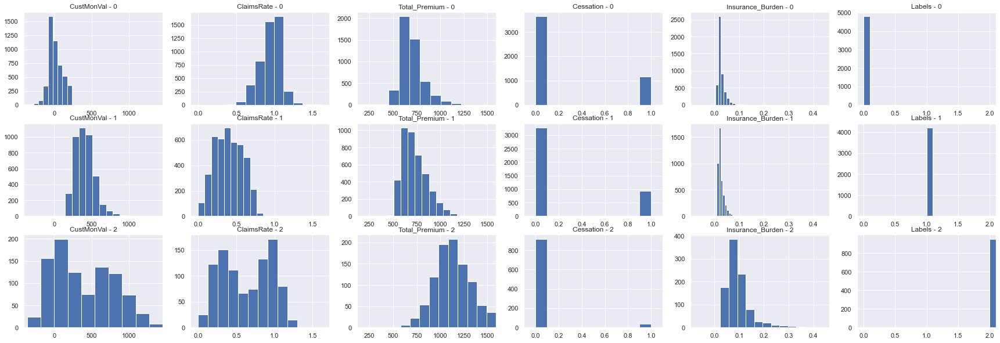

In [145]:
#Here we are using the function that plots multiple histograms to profile the clusters obtained above.
clust_profiler(df_concat_km_import2, km3_labels)

# 5. Crosstab

In [162]:
#Crosstabing the preferred clustering solution from every feature section and crosstabing them to 
#check out the population of each intersection cluster.
cross_test = pd.crosstab(df_concat_km_demo1['Labels'], [df_concat_hc_pack1['Labels'], df_concat_hc_import1['Labels']], rownames=['demographic'], colnames=['package', 'importance'])
cross_test

package        0            1              2          
importance     0    1   2   0    1    2    0    1    2
demographic                                           
0            444  221  97  62  747  590  205  869  471
1            205  116  37  47  965  821  128  609  270
2            979  360  76  43  438  311  155  529  160

In [163]:
#Changing label columns names from different segment clusterings, so as to be able to 
#differentiate them after groupby.
#Creating a concatenated dataframe for visualization.
df_concat_km_demo1.rename(columns={'Labels':'Demo_Labels'}, inplace=True)
df_concat_hc_pack1.rename(columns={'Labels':'Package_Labels'}, inplace=True)
df_concat_hc_import1.rename(columns={'Labels':'Import_Labels'}, inplace=True)
df_test_concat=pd.concat([df_concat_km_demo1, df_concat_hc_pack1, df_concat_hc_import1], axis=1)
df_test_concat

,Age,Children,EducDeg,Annual_Salary,Demo_Labels,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Package_Labels,CustMonVal,ClaimsRate,Total_Premium,Cessation,Insurance_Burden,Import_Labels
CustID,,,,,,,,,,,,,,,,,
1.0,34,1,2,26124,2,375.85,79.45,146.36,47.01,16.89,1,380.97,0.39,665.56,0,0.025477,2
2.0,21,1,2,8124,2,77.46,416.20,116.69,194.48,106.13,0,-131.13,1.12,910.96,0,0.112132,0
3.0,46,0,1,27324,2,206.15,224.50,124.58,86.35,99.02,0,504.67,0.28,740.60,0,0.027104,2
4.0,35,1,3,13188,1,182.48,43.35,311.17,35.34,28.34,2,-16.99,0.99,600.68,0,0.045547,1
5.0,43,1,3,21156,1,338.62,47.80,182.59,18.78,41.45,2,35.23,0.90,629.24,0,0.029743,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,67,0,4,38256,1,393.74,49.45,173.81,9.78,14.78,1,-0.11,0.96,641.56,0,0.016770,1
10293.0,64,0,1,29172,2,133.58,1035.75,143.25,12.89,105.13,0,1405.60,0.00,1430.60,0,0.049040,0
10294.0,40,1,3,35016,0,403.63,132.80,142.25,12.67,4.89,1,524.10,0.21,696.24,0,0.019883,2


In [164]:
#Changing label columns names from different segment clusterings, so as to be able to 
#differentiate them after groupby.
#Creating a concatenated dataframe for the groupby.
df_concat_km_demo1_scaled.rename(columns={'Labels':'Demo_Labels'}, inplace=True)
df_concat_hc_pack1_scaled.rename(columns={'Labels':'Package_Labels'}, inplace=True)
df_concat_hc_import1_scaled.rename(columns={'Labels':'Import_Labels'}, inplace=True)
df_test_concat_scaled=pd.concat([df_concat_km_demo1_scaled, df_concat_hc_pack1_scaled, df_concat_hc_import1_scaled], axis=1)
df_test_concat_scaled

,EducDeg,Annual_Salary,Demo_Labels,PremHousehold,PremHealth,PremLife,PremWork,Package_Labels,ClaimsRate,Total_Premium,Insurance_Burden,Import_Labels
CustID,,,,,,,,,,,,
1.0,-0.630321,-0.349271,2,-0.554367,-0.311033,0.173432,-0.525321,1,-0.923961,-0.463535,-0.243478,2
2.0,-0.630321,-1.885268,2,0.968073,-0.712477,3.633390,1.567412,0,1.397008,0.895016,2.853019,0
3.0,-1.907772,-0.246871,2,0.101401,-0.605723,1.096432,1.400679,0,-1.273696,-0.048109,-0.185325,2
4.0,0.647131,-1.453141,1,-0.717574,1.918899,-0.100371,-0.256811,2,0.983685,-0.822716,0.473714,1
5.0,0.647131,-0.773206,1,-0.697456,0.179171,-0.488904,0.050626,2,0.697538,-0.664605,-0.091042,1
...,...,...,...,...,...,...,...,...,...,...,...,...
10292.0,1.924582,0.685991,1,-0.689996,0.060375,-0.700063,-0.574801,1,0.888303,-0.596401,-0.554603,1
10293.0,-1.907772,-0.089176,2,3.769046,-0.353112,-0.627095,1.543962,0,-2.163931,3.771779,0.598521,0
10294.0,0.647131,0.409511,0,-0.313172,-0.366642,-0.632257,-0.806728,1,-1.496255,-0.293689,-0.443353,2


In [165]:
#Pivot Groupby to see the population of the cluster intersections.
df_test_concat_scaled.groupby(['Demo_Labels', 'Package_Labels', 'Import_Labels'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot(index='Demo_Labels', columns=['Package_Labels', 'Import_Labels'])

0                                      
Package_Labels    0            1              2          
Import_Labels     0    1   2   0    1    2    0    1    2
Demo_Labels                                              
0               444  221  97  62  747  590  205  869  471
1               205  116  37  47  965  821  128  609  270
2               979  360  76  43  438  311  155  529  160

In [166]:
# Centroids of the concatenated cluster labels
metric_features_used=[x for x in metric_features if x in df_test_concat_scaled]
df_centroids = df_test_concat_scaled.groupby(['Demo_Labels', 'Package_Labels', 'Import_Labels'])\
    [metric_features_used].mean()
df_centroids

ClaimsRate  PremHousehold  \
Demo_Labels Package_Labels Import_Labels                              
0           0              0               -0.217473       1.542450   
                           1                0.766881      -0.090408   
                           2               -0.663381      -0.427334   
            1              0               -0.770631       0.416306   
                           1                0.846506      -0.503088   
                           2               -1.258230      -0.571526   
            2              0               -0.421459       0.702890   
                           1                0.683269      -0.216839   
                           2               -0.598730      -0.482320   
1           0              0               -0.288699       1.605703   
                           1                0.671500      -0.067529   
                           2               -0.718588      -0.472561   
            1              0               -0.639167       0.442533   
                           1                0.875585      -0.609521   
                           2               -1.385034      -0.701507   
            2              0               -0.402091       0.665067   
                           1                0.524733      -0.261316   
                           2               -0.668666      -0.606345   
2           0              0               -0.092573       1.931231   
                           1                0.648080      -0.007545   
                           2               -0.723156      -0.472231   
            1              0               -0.608238       0.360249   
                           1                0.806131      -0.466619   
                           2               -1.302423      -0.606088   
            2              0               -0.330540       0.686152   
                           1                0.574448      -0.155203   
                           2               -0.599065      -0.540274   

                                          PremHealth  PremLife  PremWork  \
Demo_Labels Package_Labels Import_Labels                                   
0           0              0                0.073492  0.595211  0.526559   
                           1                0.036705  0.876503  0.876945   
                           2               -0.180882  0.745472  1.286945   
            1              0               -0.696175 -0.081113 -0.381428   
                           1               -0.733291 -0.526338 -0.540403   
                           2               -0.754391 -0.550337 -0.533281   
            2              0                0.858088 -0.089789 -0.089048   
                           1                1.054601 -0.081945 -0.099756   
                           2                0.867361 -0.169097 -0.194182   
1           0              0                0.022278  0.548883  0.669197   
                           1               -0.003537  0.956856  1.022175   
                           2               -0.097173  0.906433  0.891680   
            1              0               -0.683157 -0.254207 -0.317179   
                           1               -0.804126 -0.659206 -0.653133   
                           2               -0.877464 -0.677865 -0.677900   
            2              0                0.873940 -0.110962 -0.093692   
                           1                0.998559 -0.183661 -0.190270   
                           2                0.742348 -0.268730 -0.312728   
2           0              0               -0.139469  1.252548  1.268610   
                           1                0.106762  1.500265  1.397220   
                           2               -0.359015  1.080403  1.466285   
            1              0               -0.703752 -0.176230 -0.251456   
                           1               -0.753508 -0.485591 -0.505946   
                           2               -0.796031 -0.527950 -0.539895   
      

In [167]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', distance_threshold=0, n_clusters=None)
hclust_labels = hclust.fit_predict(df_centroids)

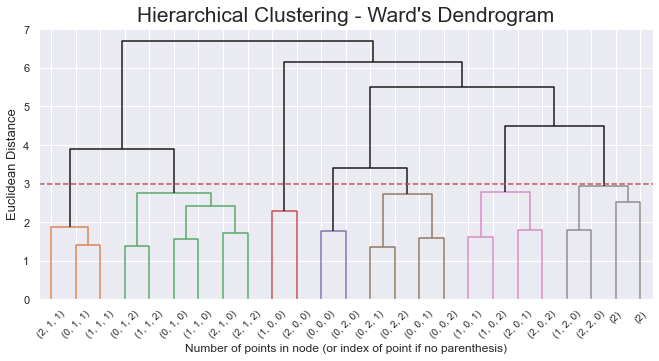

In [168]:
#Plotting the dendrogram for the merger of the several cluster
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 3
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [169]:
# Re-running the Hierarchical clustering based on the correct number of clusters
#As we were undecided between 6 and 7 cluster, we created 2 instances, one for each possibility
df_centroids6=df_centroids.copy()
df_centroids7=df_centroids.copy()

hc6lust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=6
)
hc6lust_labels = hc6lust.fit_predict(df_centroids)
df_centroids6['hclust_labels'] = hc6lust_labels

hc7lust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=7
)
hc7lust_labels = hc7lust.fit_predict(df_centroids)
df_centroids7['hclust_labels'] = hc7lust_labels

df_centroids6  

ClaimsRate  PremHousehold  \
Demo_Labels Package_Labels Import_Labels                              
0           0              0               -0.217473       1.542450   
                           1                0.766881      -0.090408   
                           2               -0.663381      -0.427334   
            1              0               -0.770631       0.416306   
                           1                0.846506      -0.503088   
                           2               -1.258230      -0.571526   
            2              0               -0.421459       0.702890   
                           1                0.683269      -0.216839   
                           2               -0.598730      -0.482320   
1           0              0               -0.288699       1.605703   
                           1                0.671500      -0.067529   
                           2               -0.718588      -0.472561   
            1              0               -0.639167       0.442533   
                           1                0.875585      -0.609521   
                           2               -1.385034      -0.701507   
            2              0               -0.402091       0.665067   
                           1                0.524733      -0.261316   
                           2               -0.668666      -0.606345   
2           0              0               -0.092573       1.931231   
                           1                0.648080      -0.007545   
                           2               -0.723156      -0.472231   
            1              0               -0.608238       0.360249   
                           1                0.806131      -0.466619   
                           2               -1.302423      -0.606088   
            2              0               -0.330540       0.686152   
                           1                0.574448      -0.155203   
                           2               -0.599065      -0.540274   

                                          PremHealth  PremLife  PremWork  \
Demo_Labels Package_Labels Import_Labels                                   
0           0              0                0.073492  0.595211  0.526559   
                           1                0.036705  0.876503  0.876945   
                           2               -0.180882  0.745472  1.286945   
            1              0               -0.696175 -0.081113 -0.381428   
                           1               -0.733291 -0.526338 -0.540403   
                           2               -0.754391 -0.550337 -0.533281   
            2              0                0.858088 -0.089789 -0.089048   
                           1                1.054601 -0.081945 -0.099756   
                           2                0.867361 -0.169097 -0.194182   
1           0              0                0.022278  0.548883  0.669197   
                           1               -0.003537  0.956856  1.022175   
                           2               -0.097173  0.906433  0.891680   
            1              0               -0.683157 -0.254207 -0.317179   
                           1               -0.804126 -0.659206 -0.653133   
                           2               -0.877464 -0.677865 -0.677900   
            2              0                0.873940 -0.110962 -0.093692   
                           1                0.998559 -0.183661 -0.190270   
                           2                0.742348 -0.268730 -0.312728   
2           0              0               -0.139469  1.252548  1.268610   
                           1                0.106762  1.500265  1.397220   
                           2               -0.359015  1.080403  1.466285   
            1              0               -0.703752 -0.176230 -0.251456   
                           1               -0.753508 -0.485591 -0.505946   
                           2               -0.796031 -0.527950 -0.539895   
      

In [170]:
df_centroids7

ClaimsRate  PremHousehold  \
Demo_Labels Package_Labels Import_Labels                              
0           0              0               -0.217473       1.542450   
                           1                0.766881      -0.090408   
                           2               -0.663381      -0.427334   
            1              0               -0.770631       0.416306   
                           1                0.846506      -0.503088   
                           2               -1.258230      -0.571526   
            2              0               -0.421459       0.702890   
                           1                0.683269      -0.216839   
                           2               -0.598730      -0.482320   
1           0              0               -0.288699       1.605703   
                           1                0.671500      -0.067529   
                           2               -0.718588      -0.472561   
            1              0               -0.639167       0.442533   
                           1                0.875585      -0.609521   
                           2               -1.385034      -0.701507   
            2              0               -0.402091       0.665067   
                           1                0.524733      -0.261316   
                           2               -0.668666      -0.606345   
2           0              0               -0.092573       1.931231   
                           1                0.648080      -0.007545   
                           2               -0.723156      -0.472231   
            1              0               -0.608238       0.360249   
                           1                0.806131      -0.466619   
                           2               -1.302423      -0.606088   
            2              0               -0.330540       0.686152   
                           1                0.574448      -0.155203   
                           2               -0.599065      -0.540274   

                                          PremHealth  PremLife  PremWork  \
Demo_Labels Package_Labels Import_Labels                                   
0           0              0                0.073492  0.595211  0.526559   
                           1                0.036705  0.876503  0.876945   
                           2               -0.180882  0.745472  1.286945   
            1              0               -0.696175 -0.081113 -0.381428   
                           1               -0.733291 -0.526338 -0.540403   
                           2               -0.754391 -0.550337 -0.533281   
            2              0                0.858088 -0.089789 -0.089048   
                           1                1.054601 -0.081945 -0.099756   
                           2                0.867361 -0.169097 -0.194182   
1           0              0                0.022278  0.548883  0.669197   
                           1               -0.003537  0.956856  1.022175   
                           2               -0.097173  0.906433  0.891680   
            1              0               -0.683157 -0.254207 -0.317179   
                           1               -0.804126 -0.659206 -0.653133   
                           2               -0.877464 -0.677865 -0.677900   
            2              0                0.873940 -0.110962 -0.093692   
                           1                0.998559 -0.183661 -0.190270   
                           2                0.742348 -0.268730 -0.312728   
2           0              0               -0.139469  1.252548  1.268610   
                           1                0.106762  1.500265  1.397220   
                           2               -0.359015  1.080403  1.466285   
            1              0               -0.703752 -0.176230 -0.251456   
                           1               -0.753508 -0.485591 -0.505946   
                           2               -0.796031 -0.527950 -0.539895   
      

In [171]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper6 = df_centroids6['hclust_labels'].to_dict()
df_6_scaled=df_test_concat_scaled.copy()
# Mapping the hierarchical clusters on the centroids to the observations
df_6_scaled['Labels'] = df_6_scaled.apply(
    lambda row: cluster_mapper6[
        (row['Demo_Labels'], row['Package_Labels'], row['Import_Labels'])
    ], axis=1
)
df_6_scaled.drop(['Demo_Labels', 'Package_Labels', 'Import_Labels'], axis=1, inplace=True)

In [172]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper6 = df_centroids6['hclust_labels'].to_dict()
cluster_mapper7 = df_centroids7['hclust_labels'].to_dict()

df_6 = df_test_concat.copy()
df_7 = df_test_concat.copy()
# Mapping the hierarchical clusters on the centroids to the observations
df_6['Labels'] = df_6.apply(
    lambda row: cluster_mapper6[
        (row['Demo_Labels'], row['Package_Labels'], row['Import_Labels'])
    ], axis=1
)

df_7['Labels'] = df_7.apply(
    lambda row: cluster_mapper7[
        (row['Demo_Labels'], row['Package_Labels'], row['Import_Labels'])
    ], axis=1
)

df_6.drop(['Demo_Labels', 'Package_Labels', 'Import_Labels'], axis=1, inplace=True)
df_7.drop(['Demo_Labels', 'Package_Labels', 'Import_Labels'], axis=1, inplace=True)
# Merged cluster centroids
df_6.groupby('Labels').mean().T

Labels,0,1,2,3,4,5
Age,67.739489,35.632631,29.765203,50.331910,34.981324,50.447442
Children,0.268314,0.905997,0.742399,0.842583,0.769100,0.845581
EducDeg,2.496749,2.508374,1.754223,2.789755,1.998302,2.761395
Annual_Salary,43502.902471,21608.408428,17930.280405,31527.240128,21350.587436,31425.661395
PremMotor,230.461847,243.352204,129.160160,432.365747,187.089847,428.219991
PremHousehold,235.810750,166.231199,616.774958,79.373613,178.065110,81.869140
PremHealth,218.173927,240.146337,161.109772,109.456772,170.244160,112.497526
PremLife,46.288036,36.058936,87.811199,15.282732,95.101681,14.996460
PremWork,45.872007,35.670573,88.962601,14.523116,94.748608,14.388572
CustMonVal,205.057165,178.410573,365.075583,439.411547,117.134958,14.475991


In [173]:
df_7.groupby('Labels').mean()

,Age,Children,EducDeg,Annual_Salary,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,CustMonVal,ClaimsRate,Total_Premium,Cessation,Insurance_Burden
Labels,,,,,,,,,,,,,,
0,35.632631,0.905997,2.508374,21608.408428,243.352204,166.231199,240.146337,36.058936,35.670573,178.410573,0.722129,721.459249,0.156672,0.038301
1,34.981324,0.769100,1.998302,21350.587436,187.089847,178.065110,170.244160,95.101681,94.748608,117.134958,0.803243,725.249406,0.084890,0.040159
2,29.765203,0.742399,1.754223,17930.280405,129.160160,616.774958,161.109772,87.811199,88.962601,365.075583,0.640811,1083.818691,0.031250,0.079516
3,50.331910,0.842583,2.789755,31527.240128,432.365747,79.373613,109.456772,15.282732,14.523116,439.411547,0.279733,651.001980,0.375133,0.022462
4,68.040410,0.253920,2.586852,43666.784077,245.460151,138.430187,227.990247,42.578474,42.904493,140.816984,0.759692,697.363552,0.141134,0.016192
5,50.447442,0.845581,2.761395,31425.661395,428.219991,81.869140,112.497526,14.996460,14.388572,14.475991,0.948372,651.971688,0.364186,0.022730
6,66.970724,0.305085,2.266564,43084.234206,192.145686,484.588829,193.096179,55.764854,53.453112,369.171525,0.591941,979.048659,0.047766,0.023032


Number of rows in axes: 6
Number of columns in axes: 15
Number of unique cluster labels: 6
Number of features: 15
Number of rows in df: 9955


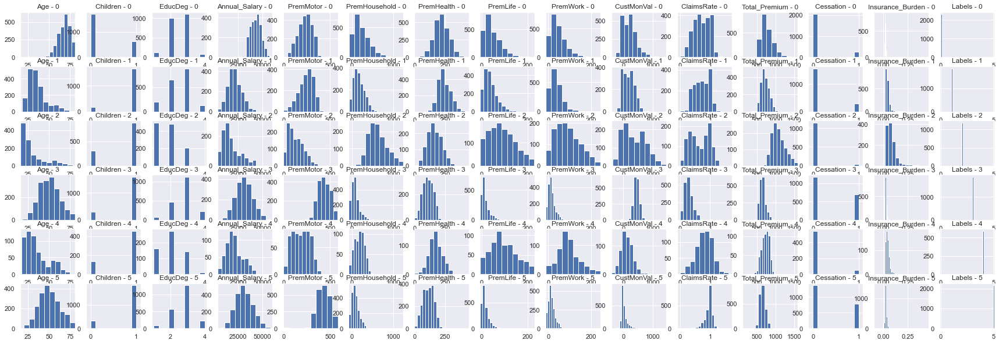

In [174]:
#Profilling the instance with 6 clusters with the function that plots a histogram for every feature
#in each cluster.
clust_profiler(df_6, df_6['Labels'])

In [180]:
df_6['Labels'].value_counts()

0    2307
5    2150
3    1874
1    1851
2    1184
4     589
Name: Labels, dtype: int64

Number of rows in axes: 7
Number of columns in axes: 15
Number of unique cluster labels: 7
Number of features: 15
Number of rows in df: 9955


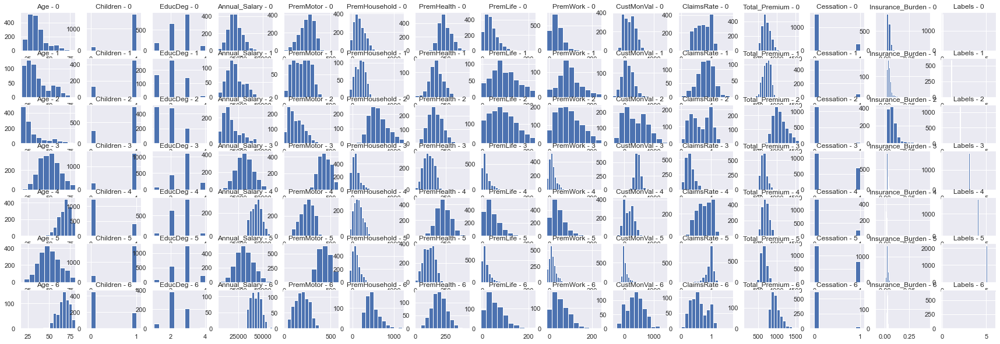

In [175]:
#Profilling the instance with 7 clusters with the function that plots a histogram for every feature
#in each cluster.
clust_profiler(df_7, df_7['Labels'])

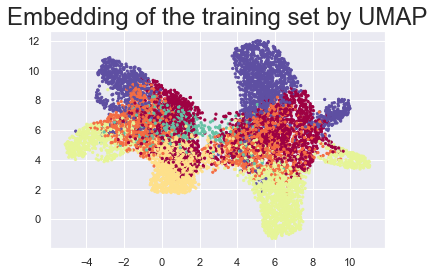

In [176]:
#Plotting the UMAP.
df_for_umap_scaled=df_6_scaled.copy()
final_cluster_labels=pd.DataFrame(df_for_umap_scaled['Labels'])
df_for_umap_scaled.drop(final_cluster_labels, axis=1, inplace=True)
trans = umap.UMAP(n_neighbors=50, min_dist=0.7, n_components=3, random_state=42).fit(df_for_umap_scaled)
plt.scatter(trans.embedding_[:, 0], trans.embedding_[:, 1], s= 5, c=final_cluster_labels.values, cmap='Spectral')
plt.title('Embedding of the training set by UMAP', fontsize=24)
plt.show()